IMPORT ALL LIBRARY

In [1]:
# --- 1. Core Data Handling & Komputasi Ilmiah ---
import pandas as pd # Untuk manipulasi dan analisis data (DataFrame)
import numpy as np # Untuk komputasi numerik array
import scipy # Untuk fungsi ilmiah umum
from scipy import stats # Untuk fungsi statistik spesifik (misal: Shapiro-Wilk, Box-Cox)
from scipy.optimize import curve_fit # Untuk fitting kurva (misal: eksponensial)

# --- 2. Visualisasi Data ---
import matplotlib.pyplot as plt # Untuk pembuatan plot statis dasar
import seaborn as sns # Untuk visualisasi statistik yang lebih menarik
import plotly.graph_objects as go # Untuk objek grafik Plotly yang lebih detail
import plotly.express as px # Untuk pembuatan grafik interaktif yang cepat
import mplfinance as mpf # Untuk visualisasi data keuangan (candlestick)
import geopandas as gpd # Untuk bekerja dengan data geospasial
import folium # Untuk membuat peta interaktif berbasis Leaflet.js
import missingno as msno # Untuk visualisasi pola data yang hilang

# --- 3. Data Preprocessing & Utilitas ML ---
from sklearn import preprocessing # Untuk scaling, normalisasi, dll.
from sklearn import impute # Untuk penanganan missing values (misal: IterativeImputer)
from sklearn import feature_selection # Untuk seleksi fitur
from sklearn import decomposition # Untuk reduksi dimensi (misal: PCA)
from sklearn import cluster # Untuk algoritma clustering umum (K-Means, DBSCAN)
from sklearn import mixture # Untuk model berbasis campuran (misal: Gaussian Mixture Models)
from imblearn import over_sampling # Untuk oversampling data tidak seimbang (misal: SMOTE)
# import fancyimpute as fi # Untuk imputasi missing values yang canggih (MICE), perlu diinstal via pip
# Perhatikan: tergantung versi fancyimpute, importnya bisa berbeda (misal: from fancyimpute import MICE)

import statsmodels.api as sm # Untuk model statistik umum (OLS, dll.)
import statsmodels.tsa.api as smt # Untuk model deret waktu (VAR, ExponentialSmoothing)
import statsmodels.tsa.seasonal as smt_seasonal # Untuk dekomposisi STL
import statsmodels.nonparametric.smoothers_lowess as sm_lowess # Untuk LOESS
import statsmodels.tsa.stattools as smt_stattools # Untuk uji stasioneritas (ADF, KPSS), Granger Causality
import statsmodels.tsa.filters.hp_filter as smt_hp # Untuk Hodrick-Prescott Filter

# from tsfresh import extract_features # Untuk ekstraksi fitur deret waktu otomatis
# from tsaug import augment # Untuk augmentasi data deret waktu
# Perhatikan: tsaug dan tsfresh mungkin memerlukan import lebih spesifik tergantung kebutuhan
# dari ydata_synthetic.synthesizers.timeseries.ctgan_models import CTGAN # Contoh untuk GANs

# --- 4. Time Series Specific & Model Peramalan ---
import pmdarima as pm # Untuk auto_arima
from prophet import Prophet # Untuk Facebook Prophet
import arch # Untuk model volatilitas (ARCH/GARCH)
from tslearn import clustering # Untuk clustering berbasis DTW
import pyts 
# import ruptures as rpt # Untuk deteksi perubahan (change point detection)
# # from hmmlearn import hmm # Untuk Hidden Markov Models

# --- 5. Pattern Mining ---
# Untuk Association Rule Mining (Apriori)
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from mlxtend.preprocessing import TransactionEncoder

# Untuk Sequential Pattern Mining (GSP, PrefixSpan)
# import pymining.seqmining as seqmining # Perlu diinstal via pip

# --- 6. Model Machine Learning (Boosting & Deep Learning) ---
import xgboost as xgb # Untuk XGBoost
# import lightgbm as lgb # Untuk LightGBM
import catboost as cb # Untuk CatBoost

import tensorflow as tf # Untuk TensorFlow
# Keras API sudah terintegrasi dalam TensorFlow 2.0+
from tensorflow import keras
from tensorflow.keras import layers

# --- 7. Plotly Dash (untuk membangun aplikasi dashboard) ---
import dash
from dash import dcc # Dash Core Components
from dash import html # Dash HTML Components
from dash.dependencies import Input, Output # Untuk callbacks interaktif

c:\Users\wenje\anaconda3\envs\dataMining-case\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\wenje\anaconda3\envs\dataMining-case\lib\site-packages\dash\_jupyter.py:30: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  _dash_comm = Comm(target_name="dash")


IMPORT DATASET

In [2]:
#import dataset
food_price_df = pd.read_csv('IDN_RTFP_mkt_2007_2025-07-14.csv')

In [3]:
print(food_price_df.shape)

(47945, 95)


ANALISIS UNIVARIAT

In [4]:
# --- Deskripsi Singkat Dataset ---
print(f"Ukuran dataset: {food_price_df.shape}")
for col in food_price_df.columns:
    print(f"Kolom: {col}, Tipe: {food_price_df[col].dtype}, Unik: {food_price_df[col].nunique()}")


Ukuran dataset: (47945, 95)
Kolom: ISO3, Tipe: object, Unik: 1
Kolom: country, Tipe: object, Unik: 1
Kolom: adm1_name, Tipe: object, Unik: 35
Kolom: adm2_name, Tipe: object, Unik: 108
Kolom: mkt_name, Tipe: object, Unik: 215
Kolom: lat, Tipe: float64, Unik: 177
Kolom: lon, Tipe: float64, Unik: 185
Kolom: geo_id, Tipe: object, Unik: 215
Kolom: price_date, Tipe: object, Unik: 223
Kolom: year, Tipe: int64, Unik: 19
Kolom: month, Tipe: int64, Unik: 12
Kolom: currency, Tipe: object, Unik: 1
Kolom: components, Tipe: object, Unik: 1
Kolom: start_dense_data, Tipe: object, Unik: 1
Kolom: last_survey_point, Tipe: object, Unik: 1
Kolom: data_coverage, Tipe: float64, Unik: 1
Kolom: data_coverage_recent, Tipe: int64, Unik: 1
Kolom: index_confidence_score, Tipe: float64, Unik: 1
Kolom: spatially_interpolated, Tipe: int64, Unik: 1
Kolom: chili, Tipe: float64, Unik: 5970
Kolom: eggs, Tipe: float64, Unik: 4385
Kolom: garlic, Tipe: float64, Unik: 3685
Kolom: meat_beef, Tipe: float64, Unik: 1208
Kolom: m

In [5]:
# --- Statistika Deskriptif Keseluruhan Variabel---
overall_desc_stats = food_price_df.describe().T
variable_chunks = {}

# Metadata (Chunk 1)
metadata_cols = [
    'lat', 'lon', 'year', 'month', 'data_coverage',
    'data_coverage_recent', 'index_confident', 'spatially_interpolated'
]
# Komoditas Level Indeks/Rata-rata (Chunk 2) - ini adalah kolom data float64
commodities_index_cols = [
    'chili', 'eggs', 'garlic', 'meat_beef', 'meat_chicken',
    'meat_chicken_broiler', 'oil', 'onions', 'rice', 'sugar'
]
# Base names untuk OHLC, Inflation, Trust per komoditas (untuk Chunk 3-12)
commodities_detailed = [
    'chili', 'eggs', 'garlic', 'meat_beef', 'meat_chicken',
    'meat_chicken_broiler', 'oil', 'onions', 'rice', 'sugar'
]
price_info_types = ['o', 'h', 'l', 'c', 'inflation', 'trust']

variable_chunks['Chunk 1 : metadata'] = metadata_cols
variable_chunks['Chunk 2 : commodities_index'] = commodities_index_cols
for i, commodity in enumerate(commodities_detailed):
    # Penyesuaian nomor chunk agar sesuai dengan permintaan Anda (3-12 untuk 10 komoditas)
    chunk_num = i + 3
    chunk_name = f'Chunk {chunk_num}: {commodity.replace("_", " ").title()} Detailed Metrics'
    cols_for_commodity = [f'{pit}_{commodity}' for pit in price_info_types]
    variable_chunks[chunk_name] = cols_for_commodity

variable_chunks['Chunk 13: Food Price Index Detailed Metrics'] = [
    f'{pit}_food_price_index' for pit in price_info_types
]

# Menghitung deskriptif statistik untuk setiap chunk
for chunk_name, cols_in_chunk in variable_chunks.items():
    # Filter kolom yang benar-benar ada di DataFrame
    existing_cols_in_chunk = [col for col in cols_in_chunk if col in overall_desc_stats.index]

    if existing_cols_in_chunk:
        print(f"\n===== {chunk_name} =====")
        chunk_df = overall_desc_stats.loc[existing_cols_in_chunk]
        print(chunk_df) # Hanya mencetak ke konsol
    else:
        print(f"\n===== {chunk_name} - Tidak ada variabel ditemukan atau tidak relevan =====")



===== Chunk 1 : metadata =====
                          count         mean       std      min      25%  \
lat                     47722.0    -3.696869  3.957174   -10.18    -7.35   
lon                     47722.0   112.350981  9.823946    95.32   106.11   
year                    47945.0  2015.798206  5.368089  2007.00  2011.00   
month                   47945.0     6.421525  3.443608     1.00     3.00   
data_coverage           47945.0    20.980000  0.000000    20.98    20.98   
data_coverage_recent    47945.0     0.000000  0.000000     0.00     0.00   
spatially_interpolated  47945.0     0.000000  0.000000     0.00     0.00   

                             50%      75%      max  
lat                       -4.015    -0.30     5.56  
lon                      110.840   117.58   140.70  
year                    2016.000  2020.00  2025.00  
month                      6.000     9.00    12.00  
data_coverage             20.980    20.98    20.98  
data_coverage_recent       0.000     0.00

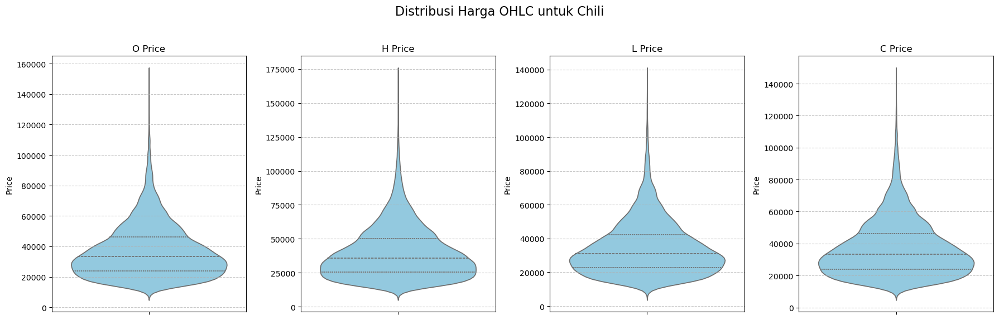

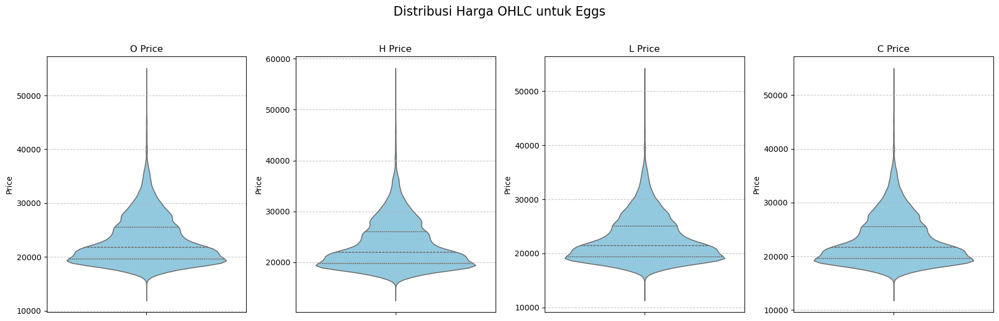

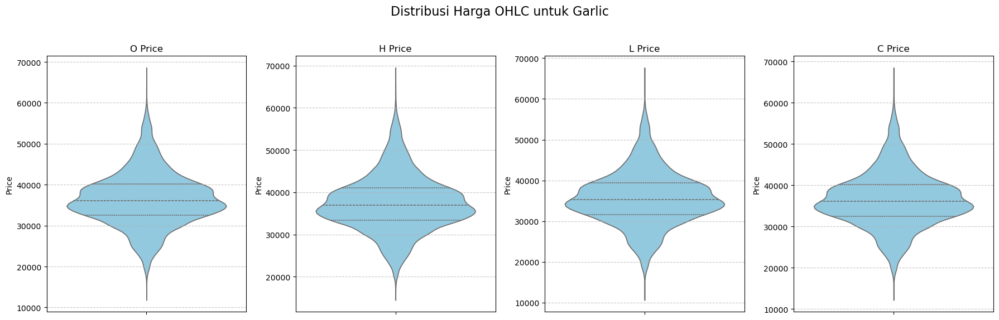

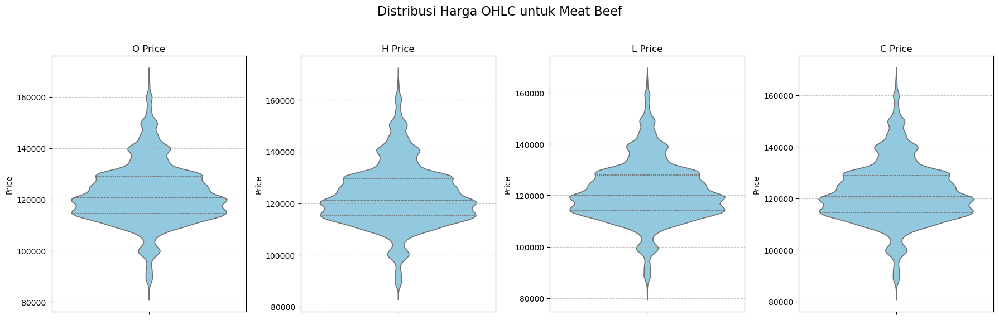

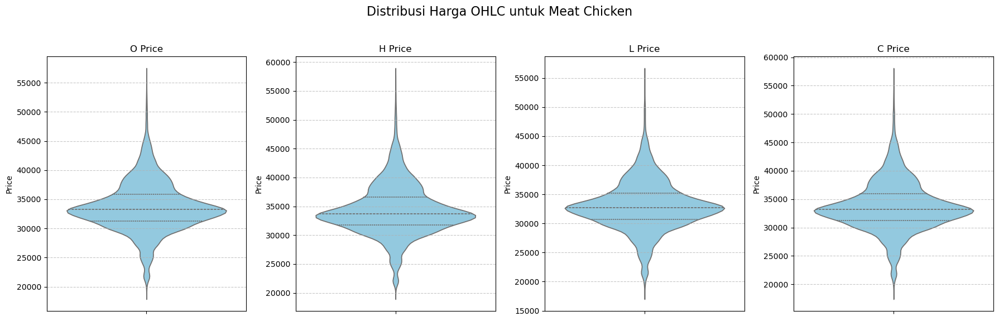

...

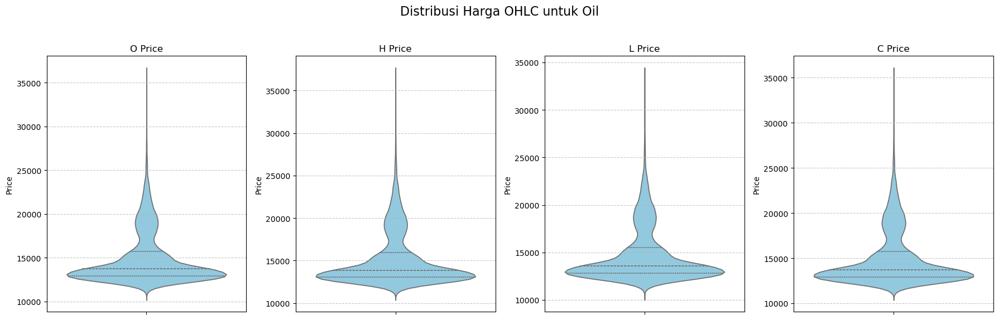

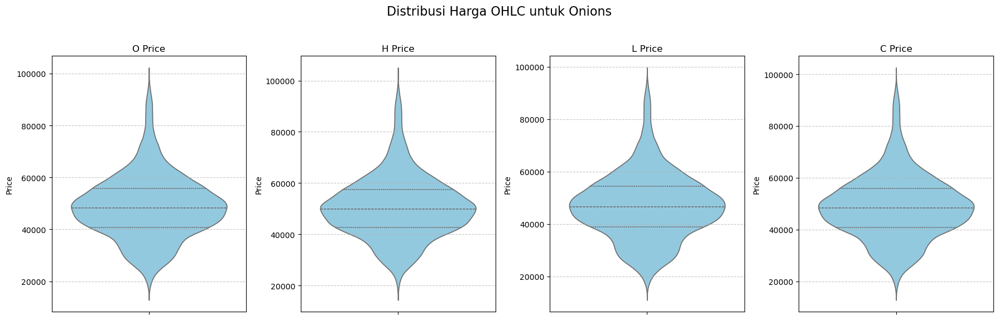

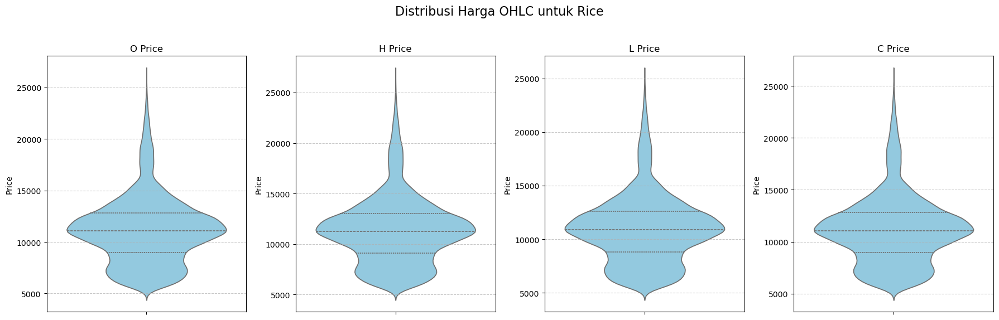

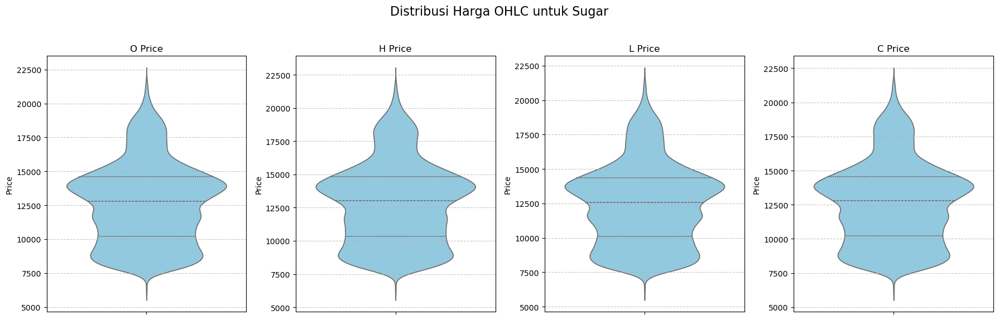

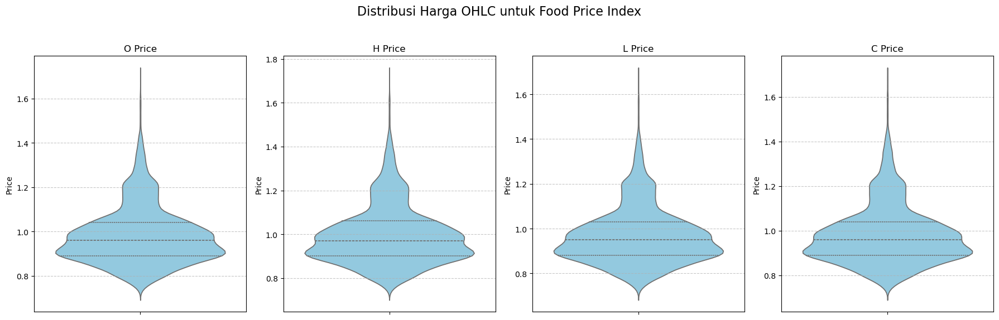

In [6]:
# --- Visualisasi Deskriptif Statistik (Violin Plot) ---

commodities_detailed = [
    'chili', 'eggs', 'garlic', 'meat_beef', 'meat_chicken',
    'meat_chicken_broiler', 'oil', 'onions', 'rice', 'sugar'
]
commodities_to_plot = commodities_detailed + ['food_price_index']
ohlc_types = ['o', 'h', 'l', 'c']

for commodity in commodities_to_plot:
    plt.figure(figsize=(18, 6)) # Ukuran figure untuk 4 subplots
    plt.suptitle(f'Distribusi Harga OHLC untuk {commodity.replace("_", " ").title()}', fontsize=16)

    for i, ohlc_type in enumerate(ohlc_types):
        # Bangun nama kolom yang sesuai
        if commodity == 'food_price_index':
            col_name = f'{ohlc_type}_food_price_index'
        else:
            col_name = f'{ohlc_type}_{commodity}'
        
        if col_name in food_price_df.columns:
            plt.subplot(1, 4, i + 1) # 1 baris, 4 kolom, subplot ke-(i+1)
            sns.violinplot(y=food_price_df[col_name].dropna(), inner='quartile', color='skyblue')
            plt.title(f'{ohlc_type.upper()} Price', fontsize=12)
            plt.ylabel('Price')
            plt.xlabel('') # Hapus label x jika tidak perlu
            plt.grid(axis='y', linestyle='--', alpha=0.7)
        else:
            print(f"Peringatan: Kolom '{col_name}' tidak ditemukan di DataFrame.")
            plt.subplot(1, 4, i + 1) # Tetap buat subplot kosong
            plt.title(f'{ohlc_type.upper()} Price (Data Missing)')
            plt.text(0.5, 0.5, 'Data N/A', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)


    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [7]:
# --- Analisis Dispersi Global ---

print("--- Analisis Dispersi ---")
commodities_detailed = [
    'chili', 'eggs', 'garlic', 'meat_beef', 'meat_chicken',
    'meat_chicken_broiler', 'oil', 'onions', 'rice', 'sugar'
]
price_info_types = ['o', 'h', 'l', 'c', 'inflation', 'trust']

#ambil food_price_df sesuai kolom commodities _detailed
expected_columns = [f"{pit}_{commodity}" for commodity in commodities_detailed for pit in price_info_types]
available_columns = [col for col in expected_columns if col in food_price_df.columns]

dispersion_results = pd.DataFrame(index=available_columns,
                                  columns=['Std Dev', 'Skewness', 'Range', 'IQR'])

for col in available_columns:
    series = food_price_df[col].dropna() # Hapus NaN jika ada
    if not series.empty:
        dispersion_results.loc[col, 'Std Dev'] = series.std()
        dispersion_results.loc[col, 'Skewness'] = scipy.stats.skew(series)
        dispersion_results.loc[col, 'Range'] = series.max() - series.min()
        
        Q1 = series.quantile(0.25)
        Q3 = series.quantile(0.75)
        dispersion_results.loc[col, 'IQR'] = Q3 - Q1
    else:
        dispersion_results.loc[col, ['Std Dev', 'Skewness', 'Range', 'IQR']] = np.nan

print(dispersion_results.round(2))



--- Analisis Dispersi ---
                                     Std Dev  Skewness      Range       IQR
o_chili                         17419.923919  1.231725  144569.62  22029.45
h_chili                         19157.321737  1.211584  162459.46  24714.24
l_chili                         15913.342852  1.252386  130287.75   19673.5
c_chili                         17553.855427  1.224452  137323.84  22342.28
inflation_chili                    24.896903  2.170059     438.67     11.55
trust_chili                         1.430643  0.974222        3.8       2.4
o_eggs                            4399.74564  1.224005   41157.17   5897.43
h_eggs                           4593.396593  1.211131   43548.27   6212.65
l_eggs                           4226.312766  1.228447   41026.02   5607.32
c_eggs                           4432.015337  1.216165   41204.51   5947.49
inflation_eggs                       6.44771  1.420686      99.48      3.18
trust_eggs                          0.451693  0.958312        

In [8]:
# --- 2. Pengujian Outlier (Z-score vs. IQR) ---

print("\n--- Pengujian Outlier ---")

outlier_summary = {}

for col in available_columns:
    series = food_price_df[col].dropna()
    if series.empty or len(series) < 2: # Minimal 2 data untuk beberapa statistik
        outlier_summary[col] = {
            'Method': 'N/A', 
            'Normaltest_pvalue': np.nan, 
            'AD_Critical_Value_5%': np.nan,
            'AD_Statistic_vs_Critical': 'N/A',
            'Outliers Count': 0, 
            'Outliers': []
        }
        continue

    # --- Uji Normalitas ---
    # D'Agostino's K-squared Test (normaltest)
    try:
        k2_stat, p_value_normaltest = scipy.stats.normaltest(series)
        is_normal_normaltest = p_value_normaltest > 0.05
    except ValueError:
        p_value_normaltest = np.nan
        is_normal_normaltest = False
    
    # Anderson-Darling Test
    ad_result = None
    try:
        ad_result = scipy.stats.anderson(series, dist='norm')
        # Hipotesis nol (data berasal dari distribusi normal) ditolak jika statistik > nilai kritis
        # Kita akan ambil nilai kritis untuk 5% (umumnya indeks 2)
        ad_critical_value_5_percent = ad_result.critical_values[2] 
        ad_is_normal = ad_result.statistic < ad_critical_value_5_percent
    except ValueError:
        ad_critical_value_5_percent = np.nan
        ad_is_normal = False


    # --- Keputusan Metode Outlier (Prioritaskan D'Agostino's K-squared untuk large data) ---
    outliers = []
    outlier_method = ''
    
    # Jika normaltest menunjukkan normalitas, gunakan Z-score
    if is_normal_normaltest: 
        outlier_method = 'Z-score'
        mean = series.mean()
        std_dev = series.std()
        if std_dev == 0:
            outliers = []
        else:
            z_scores = (series - mean) / std_dev
            outliers = series[np.abs(z_scores) > 3].tolist()
    else: # Jika normaltest menunjukkan tidak normal, gunakan IQR
        outlier_method = 'IQR'
        Q1 = series.quantile(0.25)
        Q3 = series.quantile(0.75)
        IQR = Q3 - Q1
        
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        outliers = series[(series < lower_bound) | (series > upper_bound)].tolist()
    
    outlier_summary[col] = {
        'Method': outlier_method,
        'Normaltest_pvalue': round(p_value_normaltest, 4),
        'Is_Normal (Normaltest p>0.05)': is_normal_normaltest,
        'AD_Statistic': round(ad_result.statistic, 4) if ad_result else np.nan,
        'AD_Critical_Value_5%': round(ad_critical_value_5_percent, 4) if ad_result else np.nan,
        'AD_Is_Normal (Stat < CritVal_5%)': ad_is_normal, # true jika normal
        'Outliers Count': len(outliers),
        'Outliers (first 5)': outliers[:5]
    }

# Konversi ringkasan outlier ke DataFrame untuk tampilan yang lebih baik
outlier_df = pd.DataFrame.from_dict(outlier_summary, orient='index')
print(outlier_df)


--- Pengujian Outlier ---
                               Method  Normaltest_pvalue  \
o_chili                           IQR                0.0   
h_chili                           IQR                0.0   
l_chili                           IQR                0.0   
c_chili                           IQR                0.0   
inflation_chili                   IQR                0.0   
trust_chili                       IQR                0.0   
o_eggs                            IQR                0.0   
h_eggs                            IQR                0.0   
l_eggs                            IQR                0.0   
c_eggs                            IQR                0.0   
inflation_eggs                    IQR                0.0   
trust_eggs                        IQR                0.0   
o_garlic                          IQR                0.0   
h_garlic                          IQR                0.0   
l_garlic                          IQR                0.0   
c_garlic     

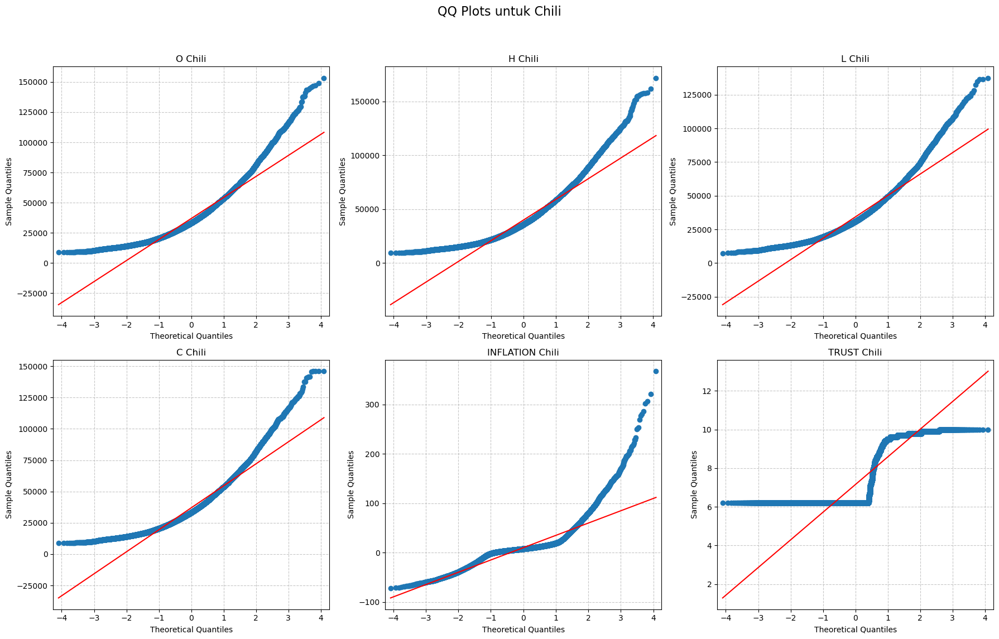

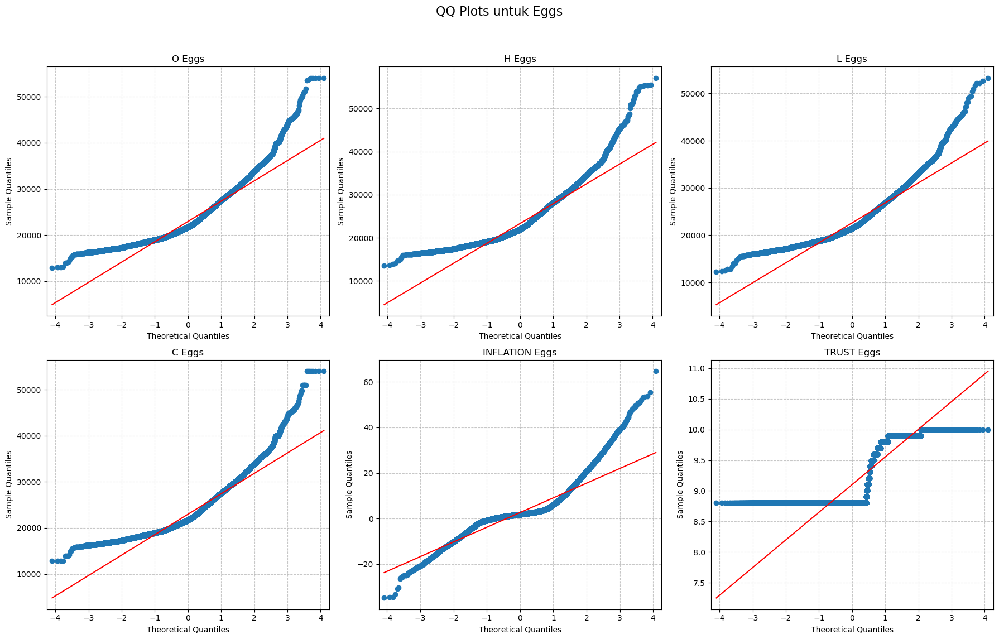

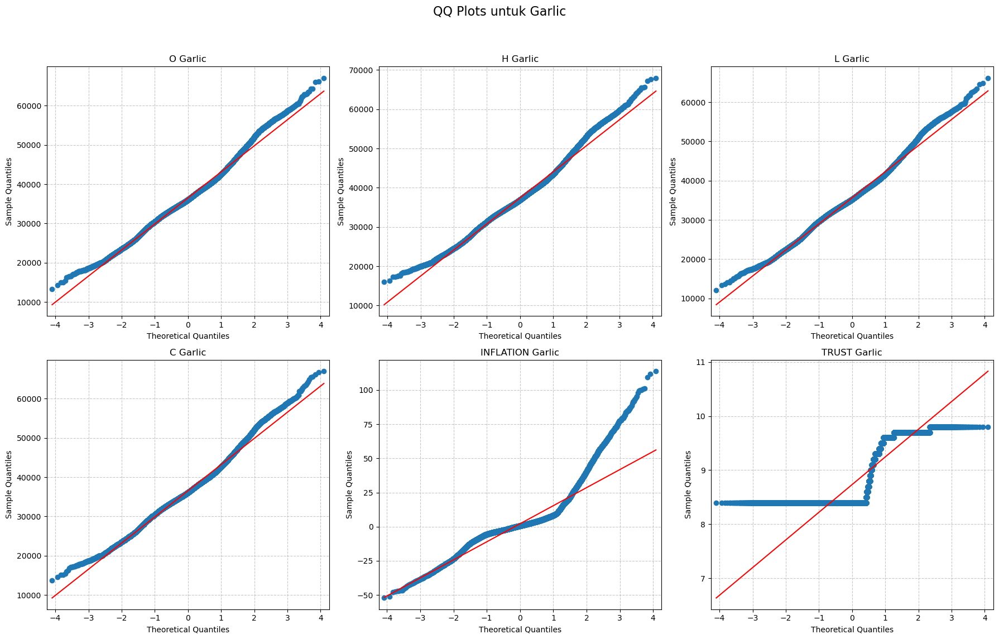

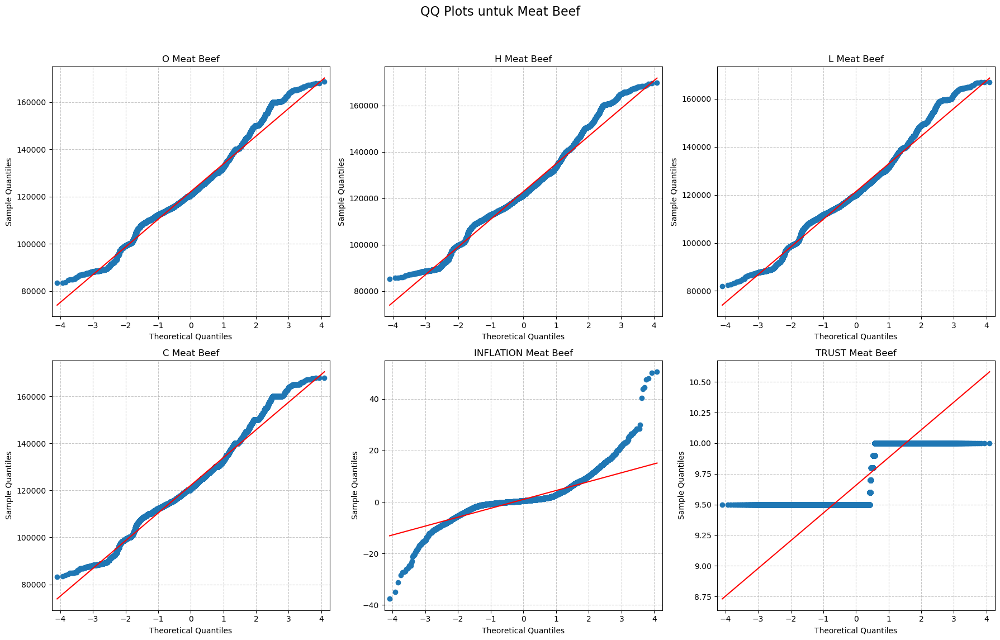

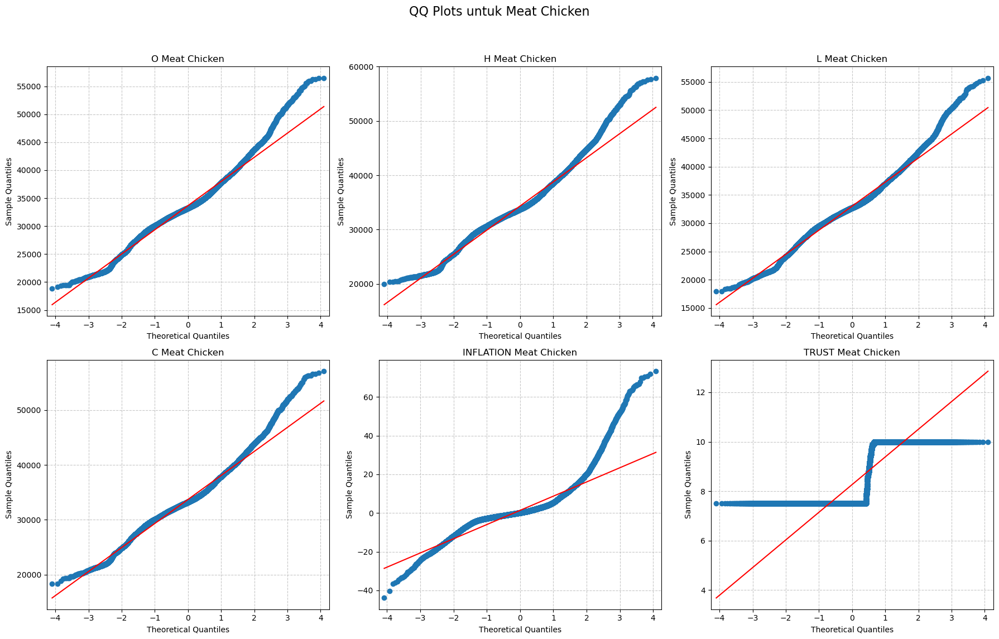

...

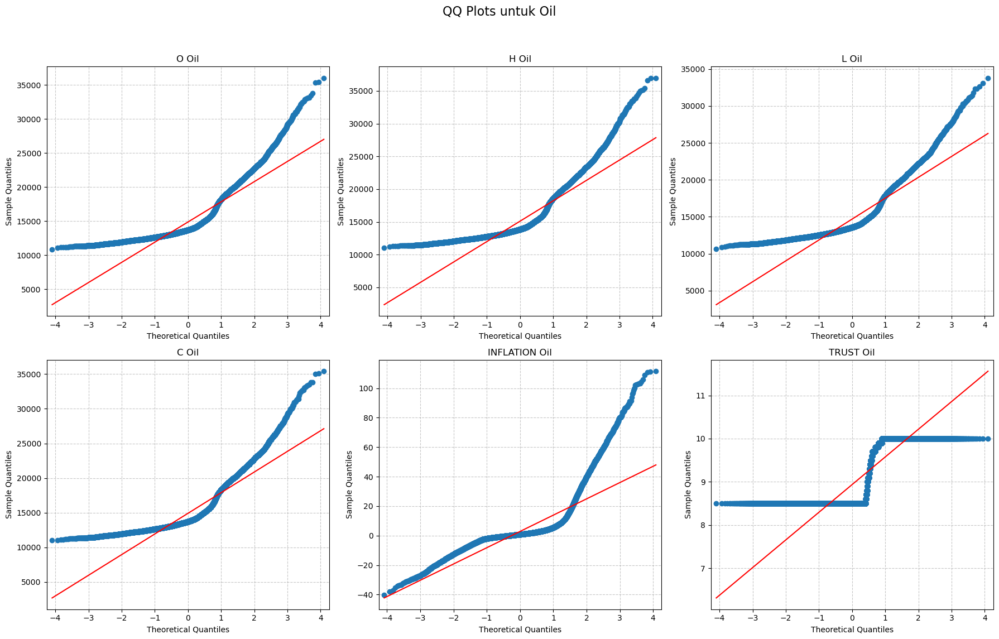

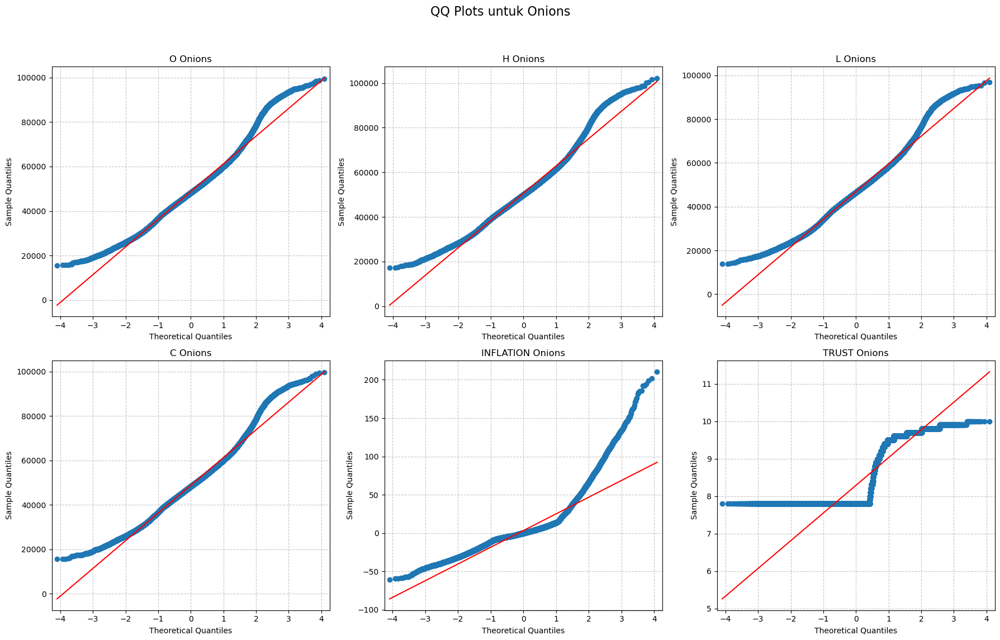

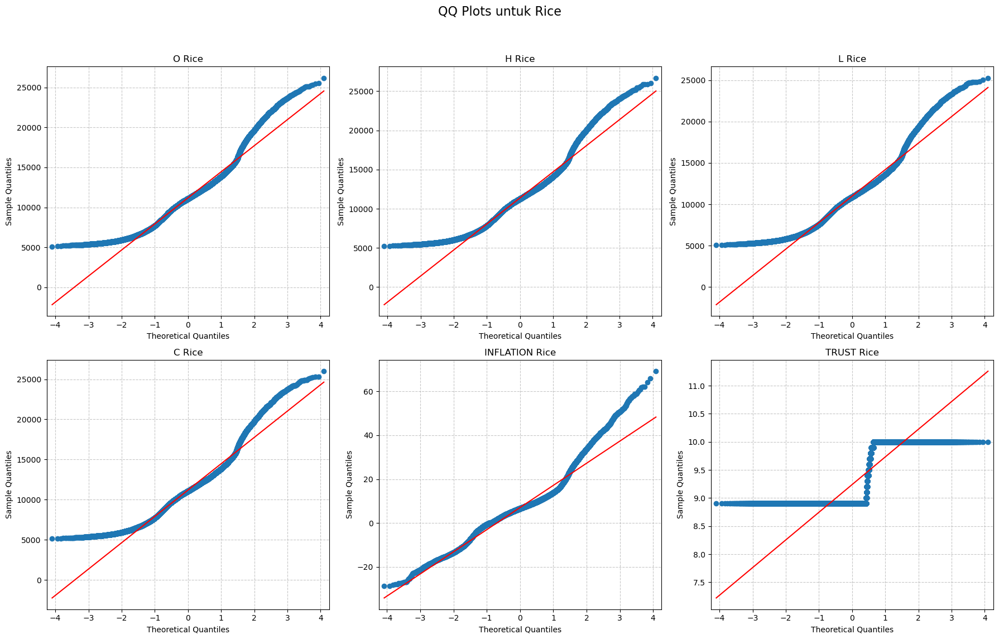

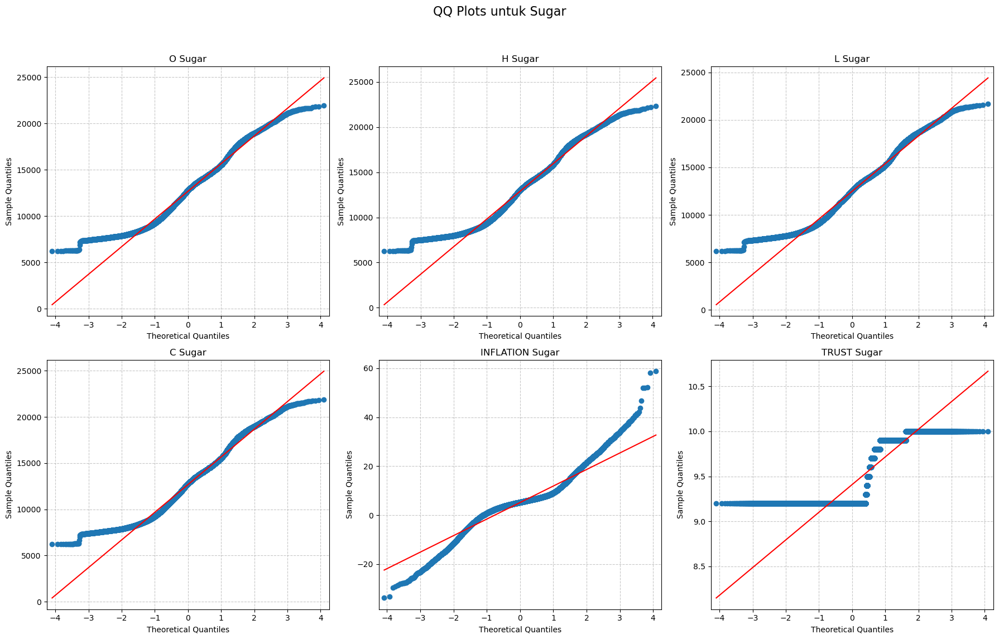

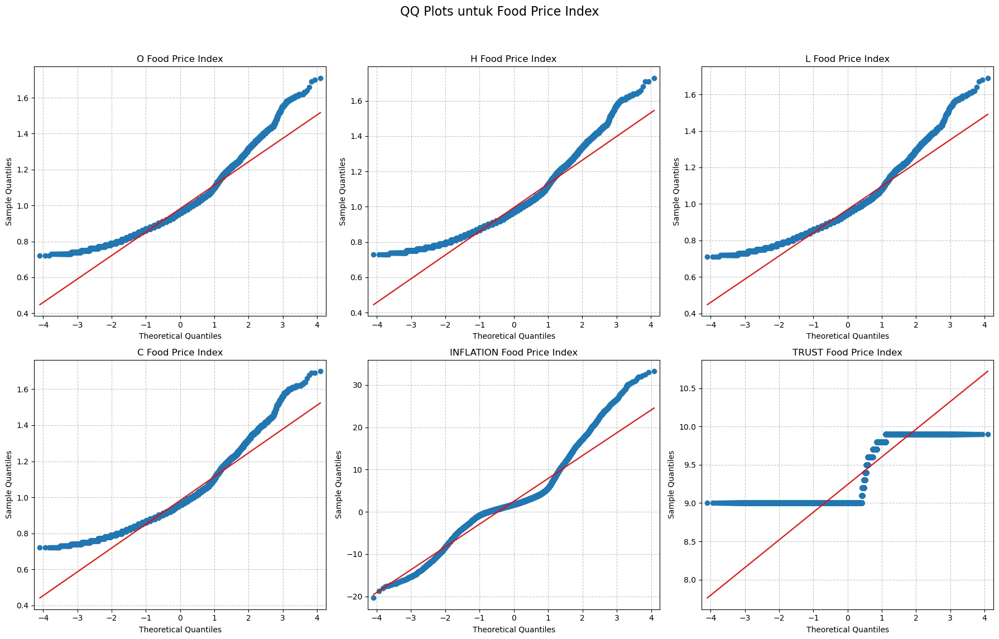

In [9]:
# --- Visualisasi Distribusi (QQ Plot) ---
commodities_to_plot = commodities_detailed + ['food_price_index']
data_types_for_qq = ['o', 'h', 'l', 'c', 'inflation', 'trust'] # Tipe data yang akan dibuat QQ Plot

for commodity in commodities_to_plot:
    plt.figure(figsize=(18, 12)) # Ukuran figure untuk 6 subplots (2 baris, 3 kolom)
    plt.suptitle(f'QQ Plots untuk {commodity.replace("_", " ").title()}', fontsize=16)

    for i, data_type in enumerate(data_types_for_qq):
        # Bangun nama kolom yang sesuai
        if commodity == 'food_price_index':
            col_name = f'{data_type}_food_price_index'
        else:
            col_name = f'{data_type}_{commodity}'
        
        if col_name in food_price_df.columns:
            ax = plt.subplot(2, 3, i + 1) # 2 baris, 3 kolom, subplot ke-(i+1)
            
            # Buat QQ Plot
            # line='s' untuk membuat garis referensi standar
            sm.qqplot(food_price_df[col_name].dropna(), line='s', ax=ax)
            
            plt.title(f'{data_type.upper()} {commodity.replace("_", " ").title()}', fontsize=12)
            plt.ylabel('Sample Quantiles')
            plt.xlabel('Theoretical Quantiles')
            plt.grid(True, linestyle='--', alpha=0.7)
        else:
            print(f"Peringatan: Kolom '{col_name}' tidak ditemukan di DataFrame.")
            ax = plt.subplot(2, 3, i + 1) # Tetap buat subplot kosong
            plt.title(f'{data_type.upper()} {commodity.replace("_", " ").title()} (Data Missing)')
            plt.text(0.5, 0.5, 'Data N/A', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Sesuaikan layout agar judul tidak tumpang tindih
    plt.show() # Tampilkan plot di output notebook

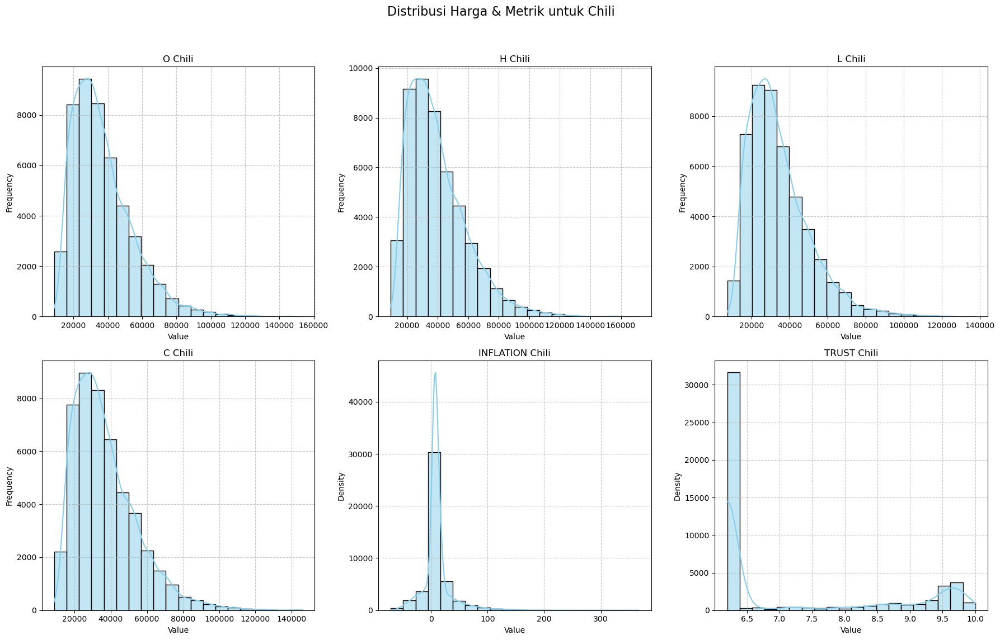

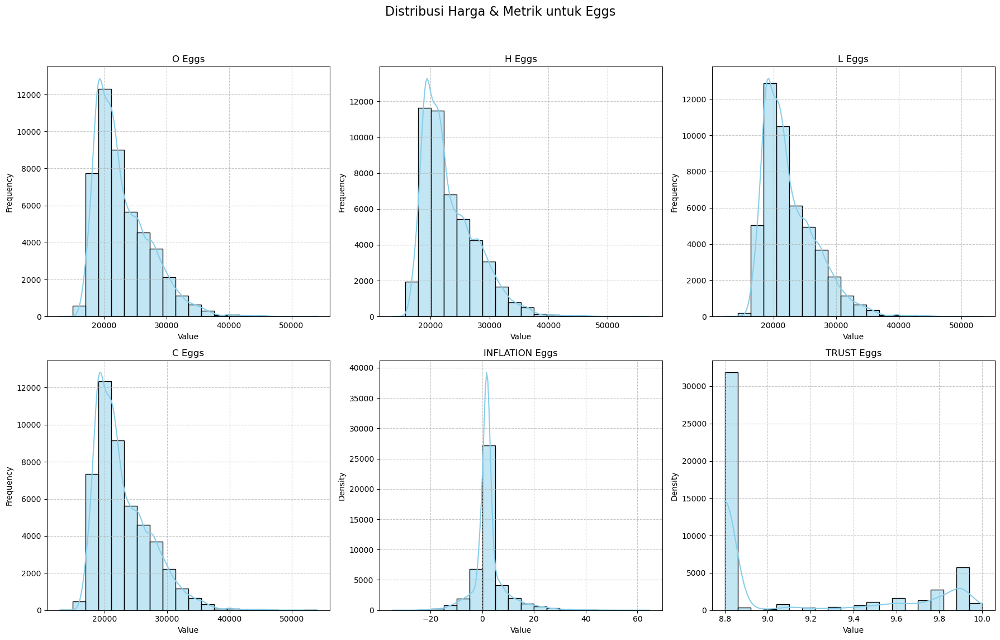

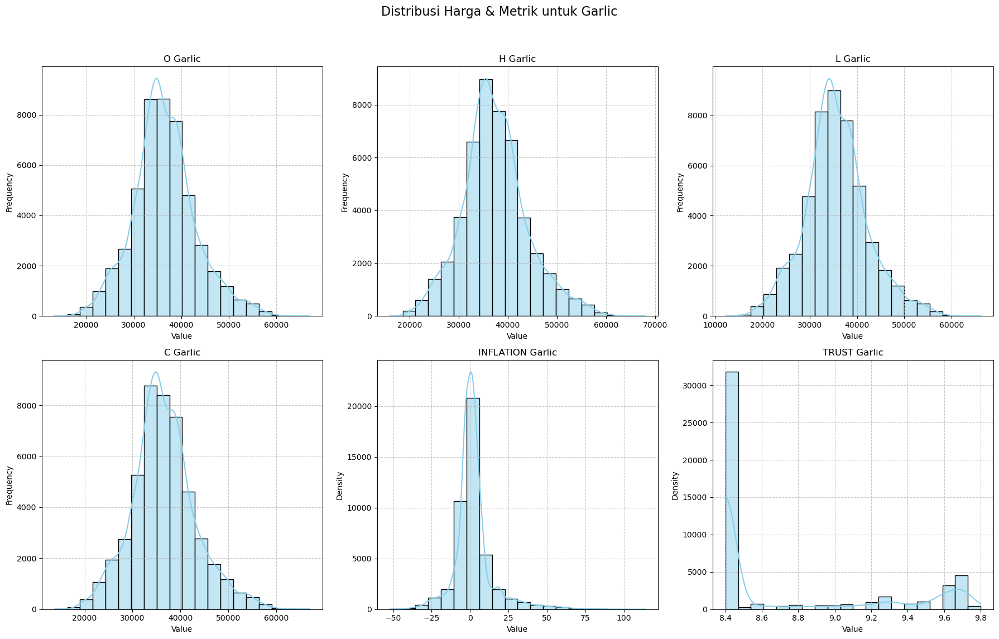

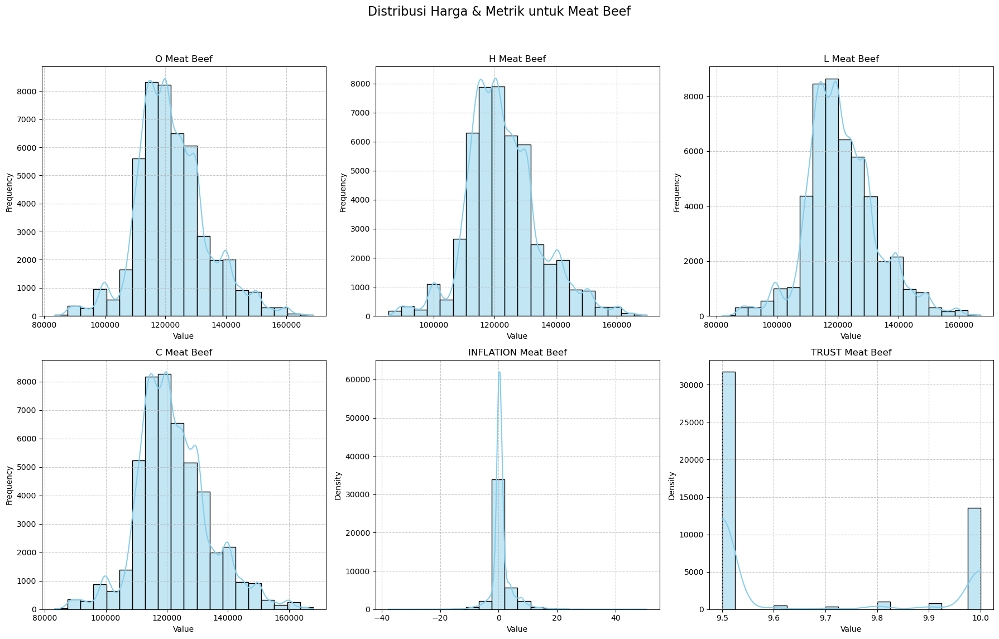

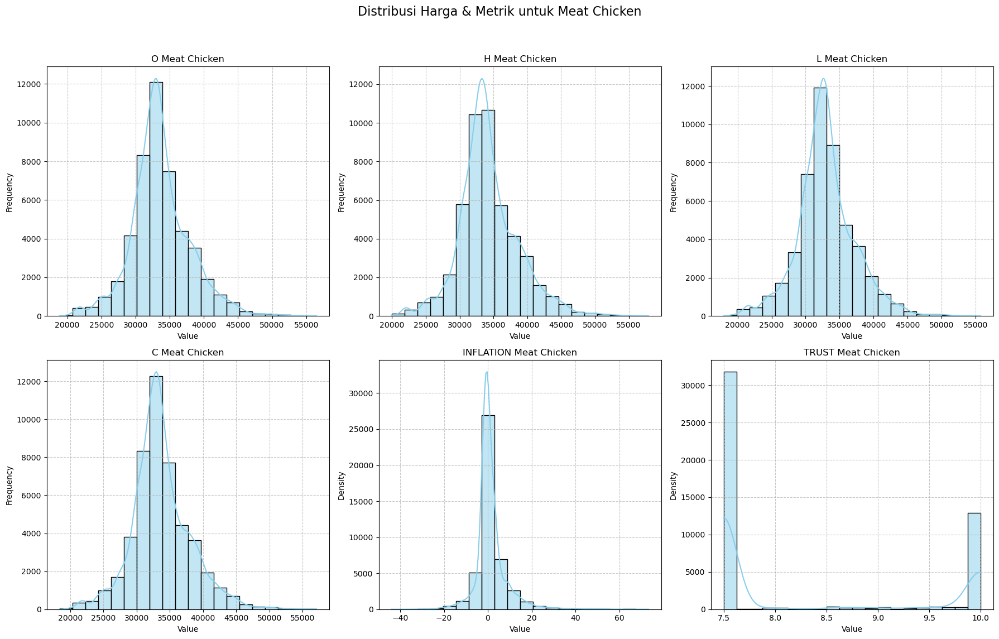

...

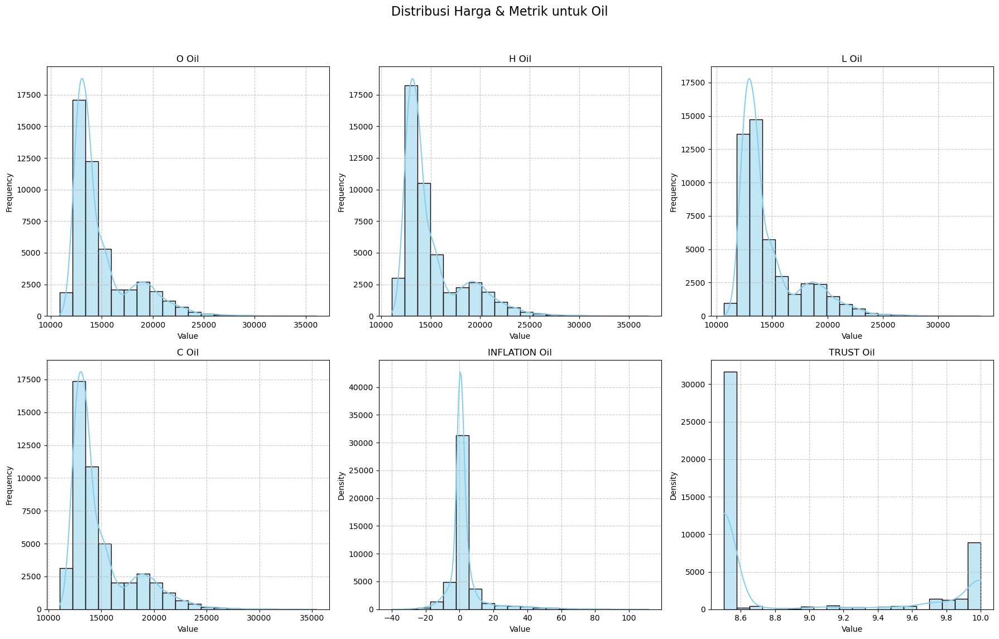

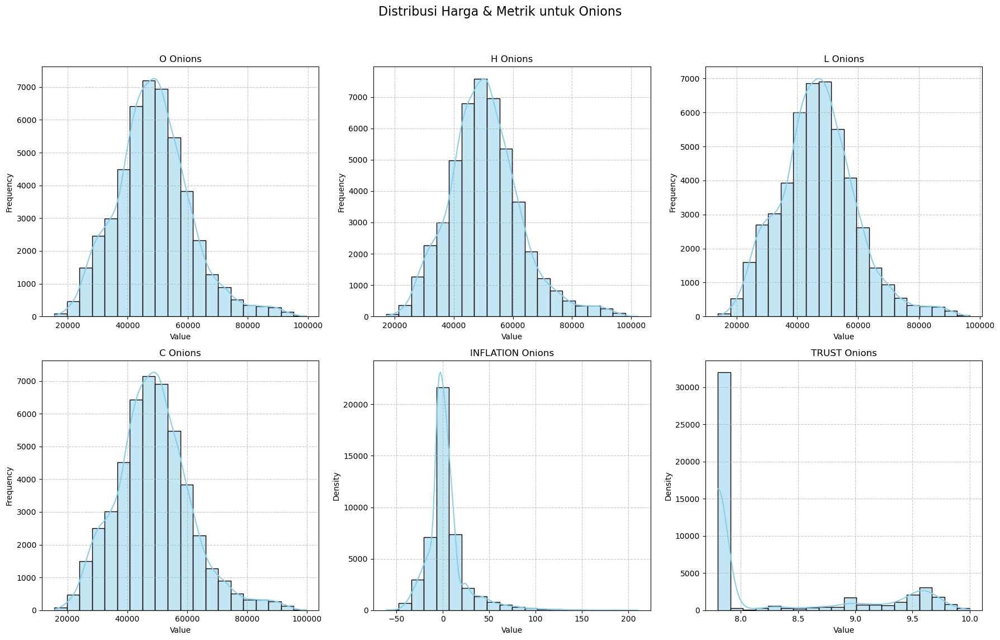

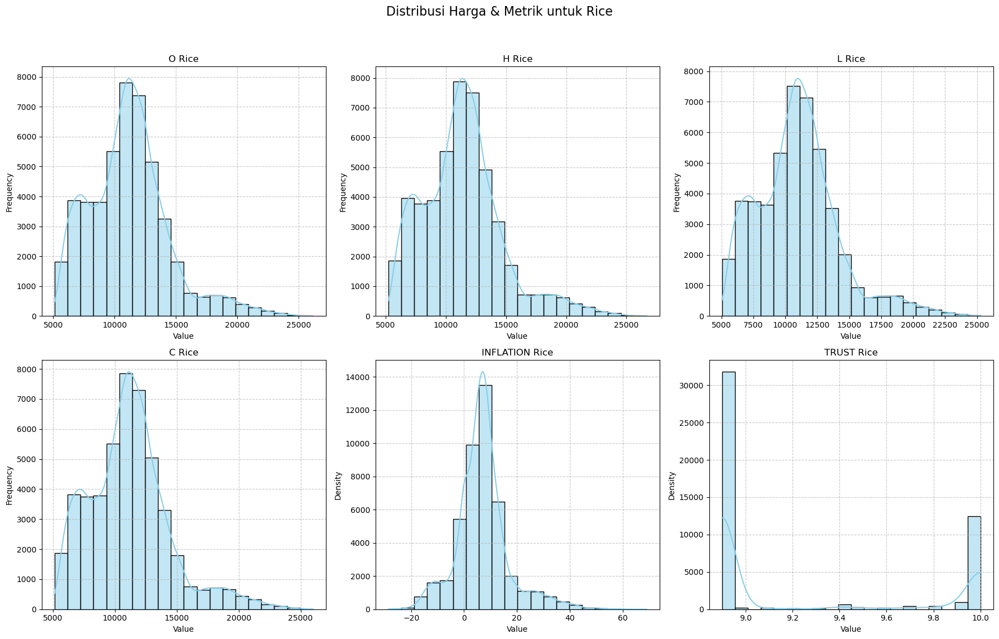

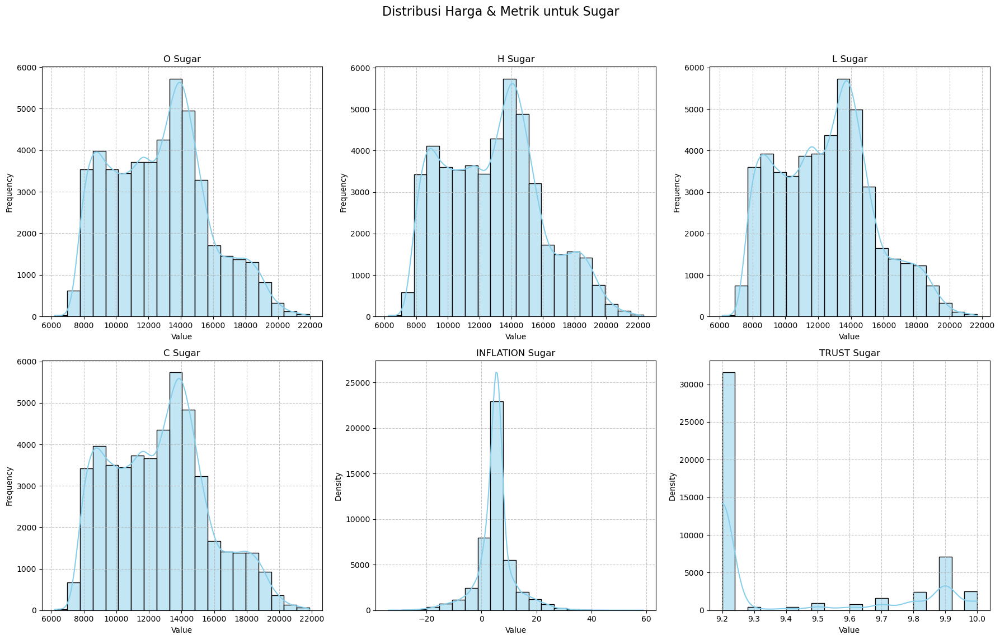

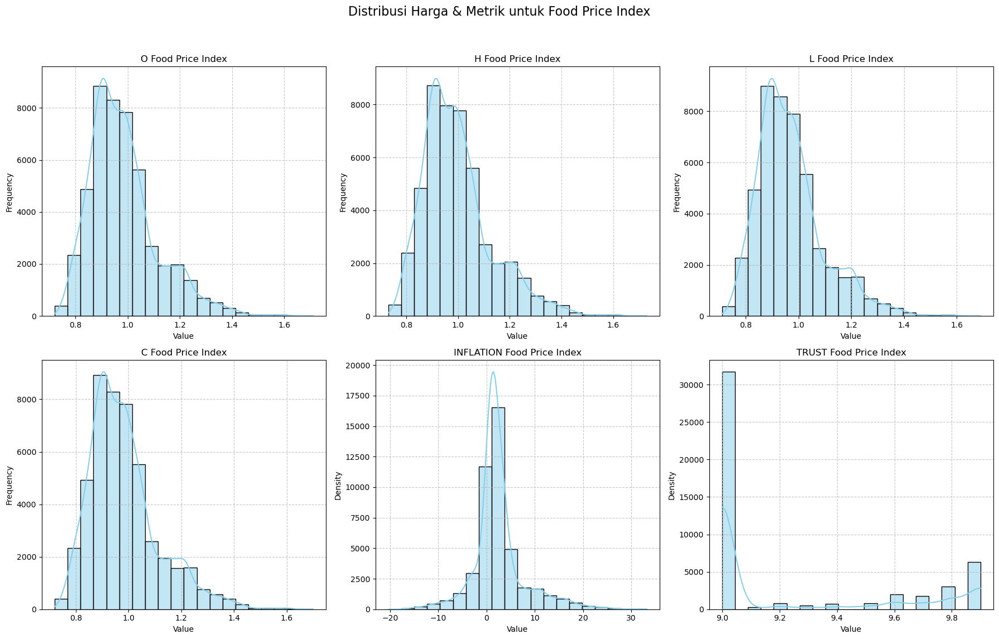

In [10]:
# --- Visualisasi Distribusi (Bar Plot with Density) ---
commodities_to_plot = commodities_detailed + ['food_price_index']
data_types_for_hist_kde = ['o', 'h', 'l', 'c', 'inflation', 'trust'] # Tipe data yang akan dibuat plotnya

for commodity in commodities_to_plot:
    plt.figure(figsize=(18, 12)) # Ukuran figure untuk 6 subplots (2 baris, 3 kolom)
    plt.suptitle(f'Distribusi Harga & Metrik untuk {commodity.replace("_", " ").title()}', fontsize=16)

    for i, data_type in enumerate(data_types_for_hist_kde):
        # Bangun nama kolom yang sesuai
        if commodity == 'food_price_index':
            col_name = f'{data_type}_food_price_index'
        else:
            col_name = f'{data_type}_{commodity}'
        
        if col_name in food_price_df.columns:
            ax = plt.subplot(2, 3, i + 1) # 2 baris, 3 kolom, subplot ke-(i+1)
            
            # Buat Histogram dengan KDE
            palette = sns.color_palette("husl", len(commodity))
            sns.histplot(food_price_df[col_name].dropna(), kde=True, ax=ax, color='skyblue', bins=20)
            
            plt.title(f'{data_type.upper()} {commodity.replace("_", " ").title()}', fontsize=12)
            plt.ylabel('Frequency' if 'inflation' not in col_name and 'trust' not in col_name else 'Density')
            plt.xlabel('Value')
            plt.grid(True, linestyle='--', alpha=0.7)
        else:
            print(f"Peringatan: Kolom '{col_name}' tidak ditemukan di DataFrame.")
            ax = plt.subplot(2, 3, i + 1) # Tetap buat subplot kosong
            plt.title(f'{data_type.upper()} {commodity.replace("_", " ").title()} (Data Missing)')
            plt.text(0.5, 0.5, 'Data N/A', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Sesuaikan layout agar judul tidak tumpang tindih
    plt.show() 

ANALISIS FITUR TURUNAN

In [11]:
# --- Pembuatan Fitur Turunan ---
# Return = (Close–Open)/Open
# Volatility = (High–Low)/Open
# Candle‑pattern flags (misal: bullish if Close>Open)

commodities_to_feature_engineer = commodities_detailed + ['food_price_index']

for commodity in commodities_to_feature_engineer:
    # Bangun nama kolom OHLC
    if commodity == 'food_price_index':
        open_col = 'o_food_price_index'
        high_col = 'h_food_price_index'
        low_col = 'l_food_price_index'
        close_col = 'c_food_price_index'
    else:
        open_col = f'o_{commodity}'
        high_col = f'h_{commodity}'
        low_col = f'l_{commodity}'
        close_col = f'c_{commodity}'

    # Periksa apakah kolom-kolom OHLC ada sebelum perhitungan
    if all(col in food_price_df.columns for col in [open_col, high_col, low_col, close_col]):
        # 1. Return = (Close - Open) / Open
        # Gunakan .copy() untuk menghindari SettingWithCopyWarning jika DataFrame di-slice
        food_price_df[f'return_{commodity}'] = (
            (food_price_df[close_col] - food_price_df[open_col]) / food_price_df[open_col]
        )

        # 2. Volatility = (High - Low) / Open
        food_price_df[f'volatility_{commodity}'] = (
            (food_price_df[high_col] - food_price_df[low_col]) / food_price_df[open_col]
        )

        # 3. Candle-pattern flags (bullish if Close > Open)
        food_price_df[f'bullish_flag_{commodity}'] = (
            food_price_df[close_col] > food_price_df[open_col]
        ).astype(int) # Konversi True/False menjadi 1/0
    else:
        print(f"Peringatan: Kolom OHLC untuk '{commodity}' tidak lengkap. Fitur tidak dibuat.")


In [12]:
# --- Deskripsi Statistik Fitur Turunan ---

new_feature_cols = [col for col in food_price_df.columns if 
                    any(prefix in col for prefix in ['return_', 'volatility_', 'bullish_flag_'])]
# --- 1. Deskripsi Statistik untuk Fitur Baru (lanjutan dari permintaan terakhir) ---

print("\n--- Deskripsi Statistik untuk Fitur Baru (Return, Volatility, Bullish Flag) ---")

if new_feature_cols: 
    new_features_desc_stats = food_price_df[new_feature_cols].describe().T
    print(new_features_desc_stats.round(4))
else:
    print("Tidak ada fitur baru yang ditemukan untuk deskripsi statistik.")


--- Deskripsi Statistik untuk Fitur Baru (Return, Volatility, Bullish Flag) ---
                                     count    mean     std     min     25%  \
return_chili                       47945.0  0.0064  0.1055 -0.5670 -0.0319   
volatility_chili                   47945.0  0.1387  0.1121  0.0006  0.0707   
bullish_flag_chili                 47945.0  0.4937  0.5000  0.0000  0.0000   
return_eggs                        47945.0  0.0006  0.0232 -0.2131 -0.0062   
volatility_eggs                    47945.0  0.0285  0.0258  0.0005  0.0122   
bullish_flag_eggs                  47945.0  0.4734  0.4993  0.0000  0.0000   
return_garlic                      47945.0  0.0017  0.0361 -0.3229 -0.0116   
volatility_garlic                  47945.0  0.0505  0.0350  0.0002  0.0279   
bullish_flag_garlic                47945.0  0.5268  0.4993  0.0000  0.0000   
return_meat_beef                   47945.0  0.0004  0.0097 -0.2291 -0.0029   
volatility_meat_beef               47945.0  0.0120  0.0092  0


--- Visualisasi Distribusi Return dan Volatility (Violin Plot) ---


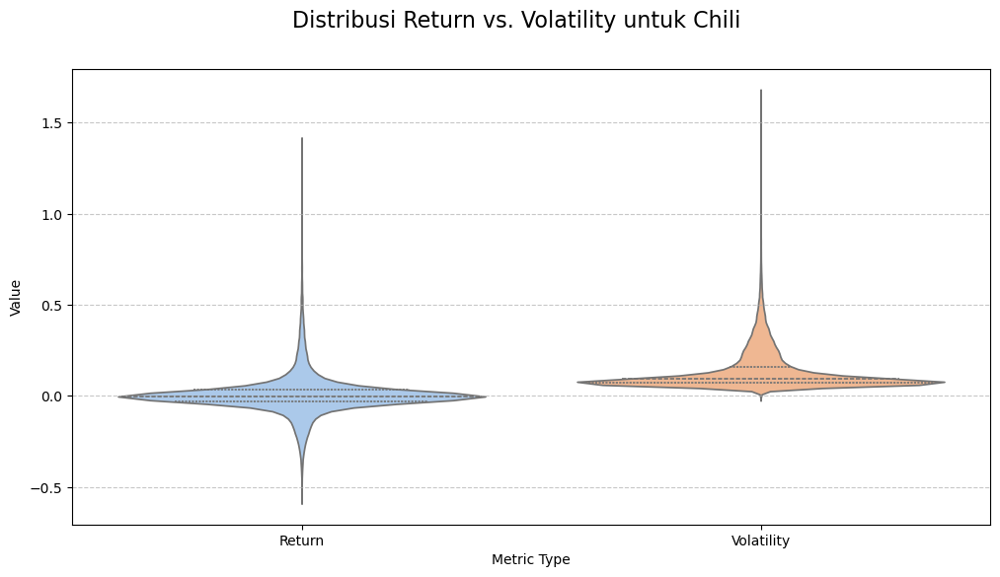

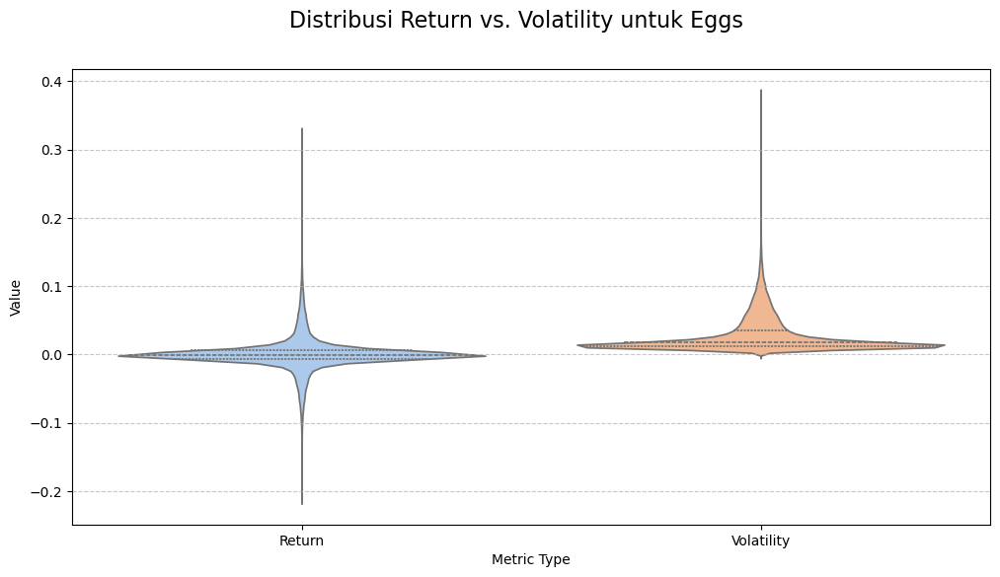

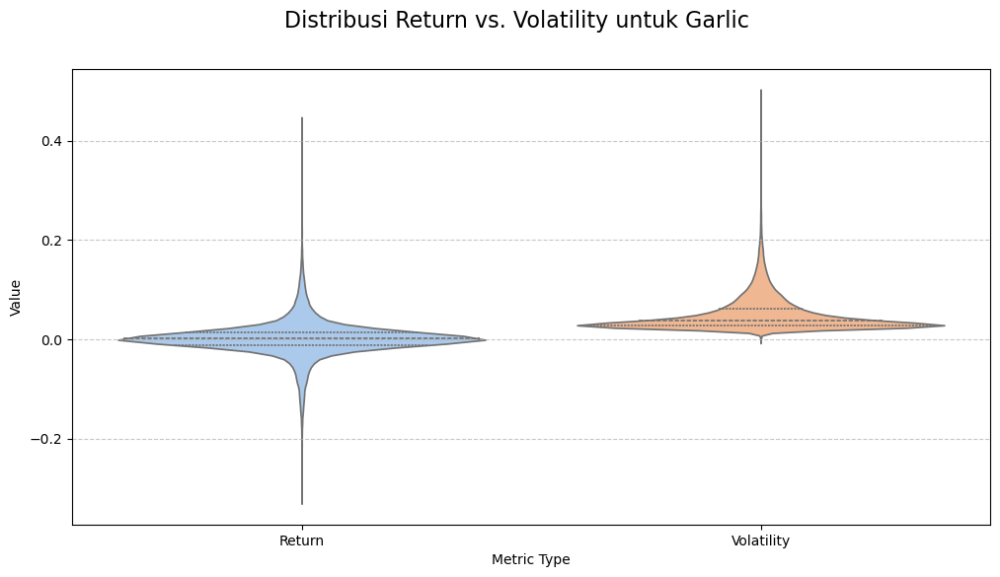

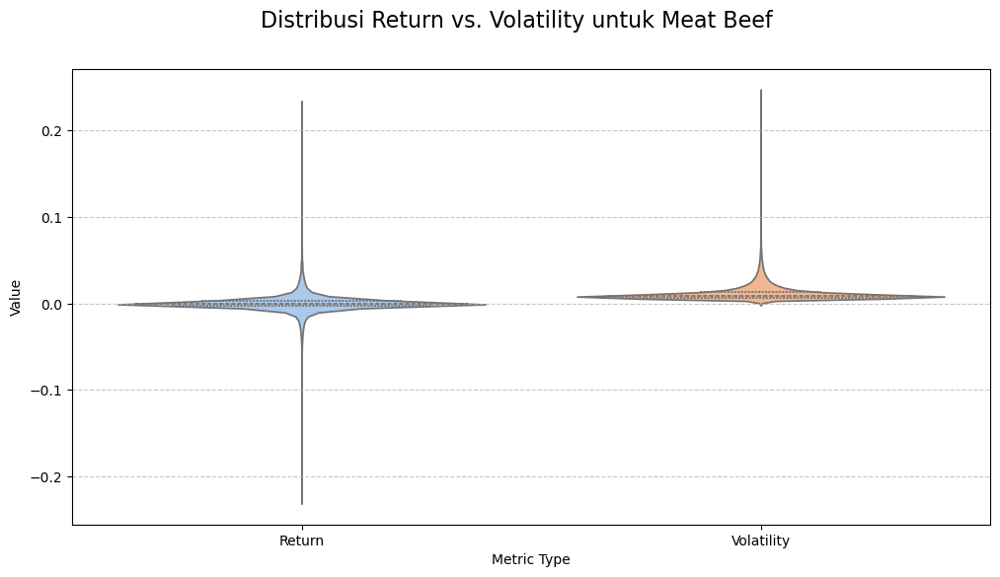

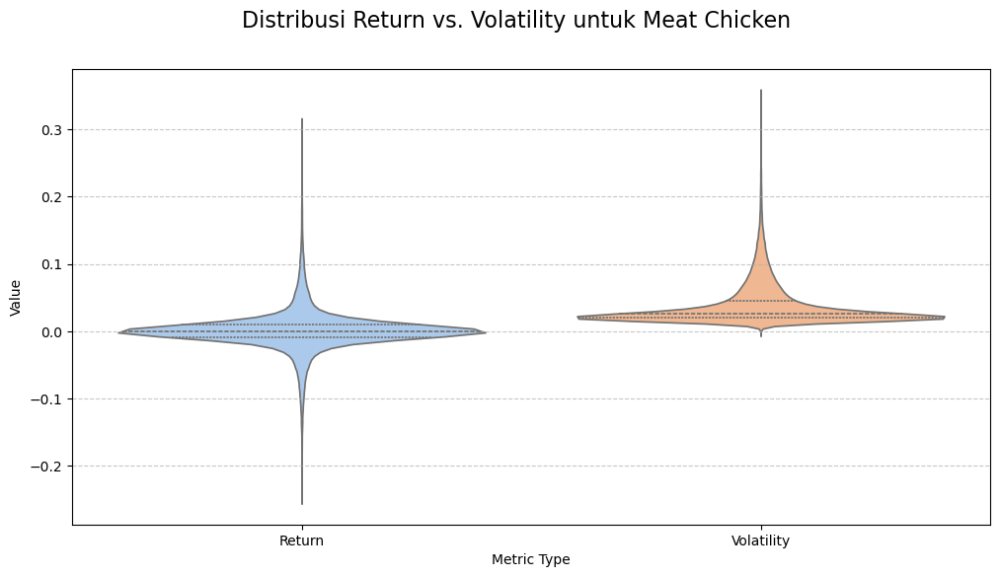

...

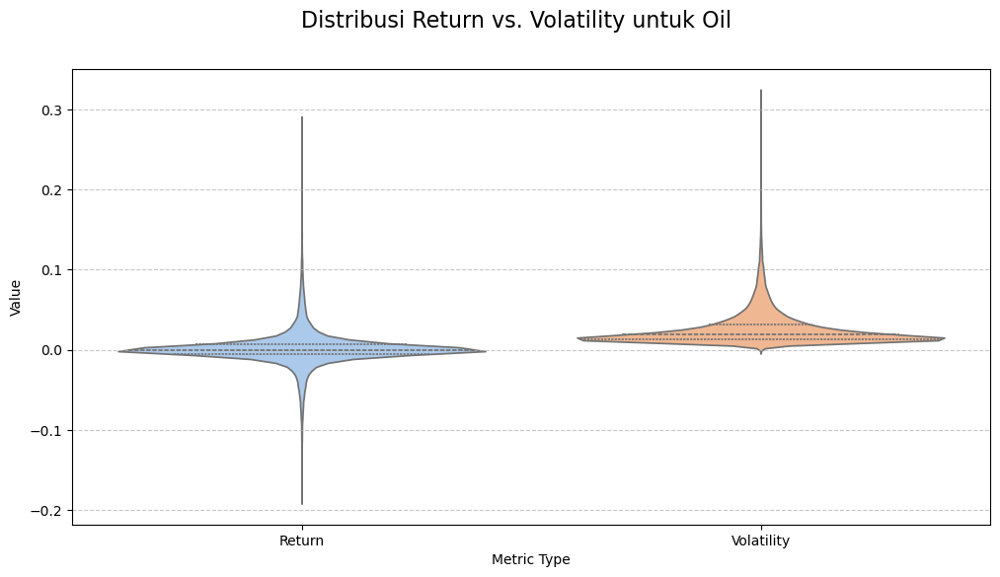

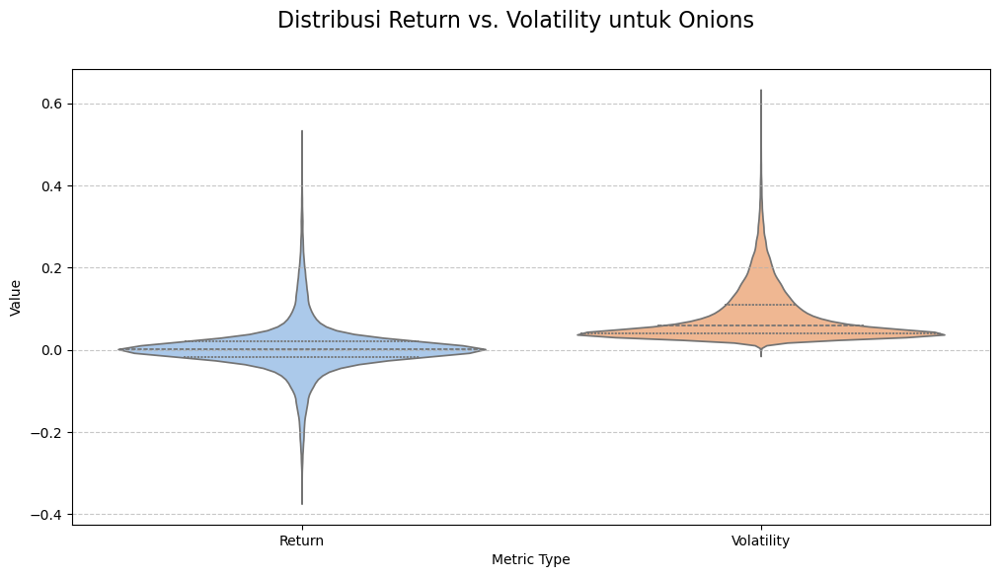

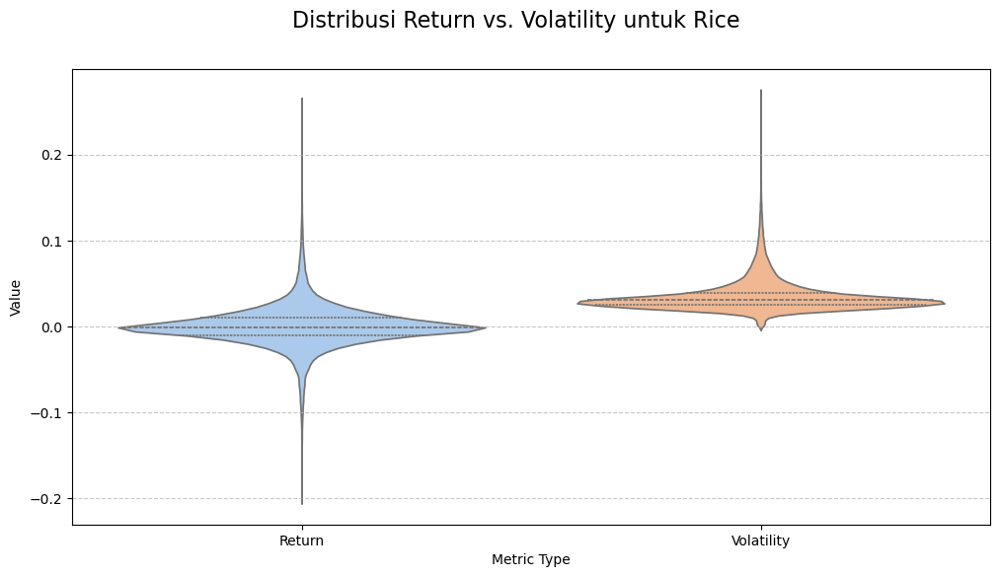

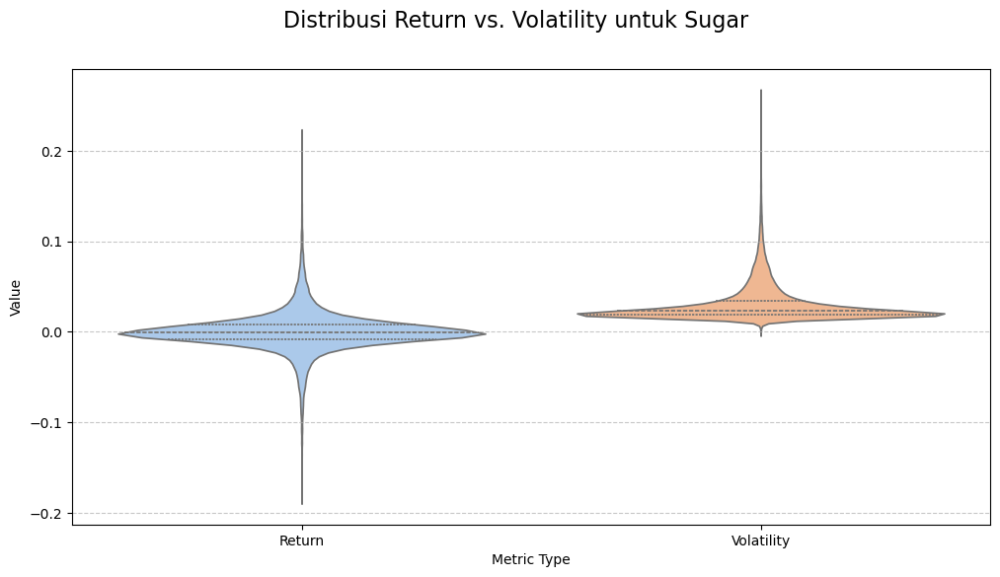

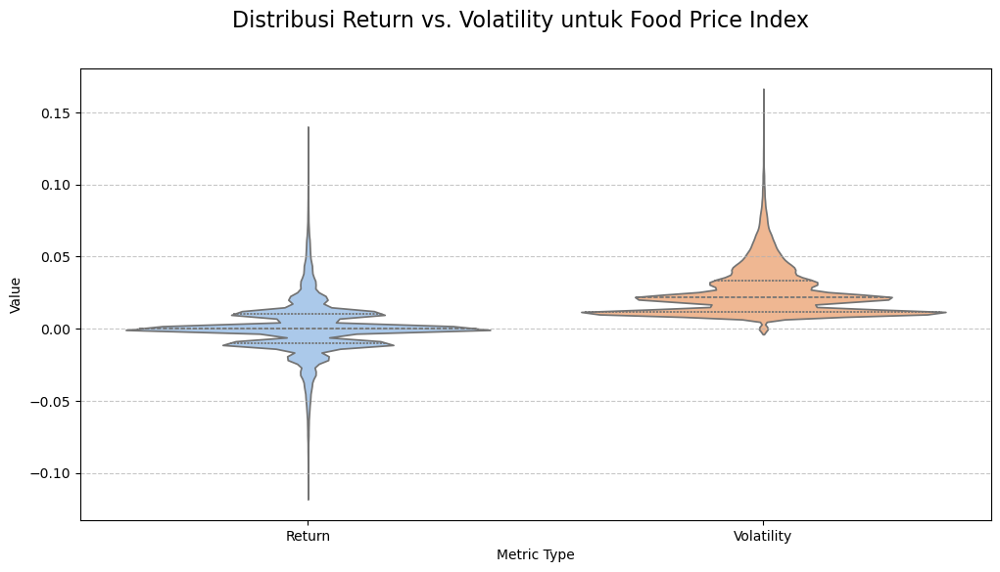

In [13]:
# --- 2. Visualisasi Distribusi Return dan Volatility (Violin Plot) ---

print("\n--- Visualisasi Distribusi Return dan Volatility (Violin Plot) ---")

ohlc_categories_for_plot = commodities_detailed + ['food_price_index']

for category in ohlc_categories_for_plot:
    return_col = f'return_{category}'
    volatility_col = f'volatility_{category}'

    # Periksa apakah kedua kolom ada sebelum plotting
    if return_col in food_price_df.columns and volatility_col in food_price_df.columns:
        plt.figure(figsize=(12, 6))
        plt.suptitle(f'Distribusi Return vs. Volatility untuk {category.replace("_", " ").title()}', fontsize=16)

        # Melt data untuk Seaborn violinplot side-by-side
        plot_df = food_price_df[[return_col, volatility_col]].melt(
            var_name='Metric', value_name='Value'
        )
        
        # Rename metric names for better labels
        plot_df['Metric'] = plot_df['Metric'].replace({
            return_col: 'Return',
            volatility_col: 'Volatility'
        })

        sns.violinplot(x='Metric', y='Value', data=plot_df, inner='quartile', 
                       palette='pastel', hue='Metric', legend=False)
        plt.ylabel('Value')
        plt.xlabel('Metric Type')
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()
    else:
        print(f"Peringatan (Plotting): Fitur Return atau Volatility untuk '{category}' tidak lengkap. Plot tidak dibuat.")


--- Analisis Temporal Fitur Candle Pattern Flag ---

Analisis untuk: Chili
Proporsi Bullish per Tahun (mean dari bullish_flag_chili):
year
2007    0.483
2008    0.418
2009    0.531
2010    0.552
2011    0.527
2012    0.540
2013    0.519
2014    0.428
2015    0.503
2016    0.478
2017    0.467
2018    0.440
2019    0.432
2020    0.431
2021    0.528
2022    0.506
2023    0.513
2024    0.572
2025    0.525
Name: bullish_flag_chili, dtype: float64

Proporsi Bullish per Bulan (mean dari bullish_flag_chili):
month
1     0.663
2     0.567
3     0.537
4     0.188
5     0.289
6     0.361
7     0.579
8     0.230
9     0.356
10    0.605
11    0.707
12    0.857
Name: bullish_flag_chili, dtype: float64

Rolling Mean (12-bulan) untuk bullish_flag_chili:
47940    0.416667
47941    0.416667
47942    0.416667
47943    0.333333
47944    0.333333
Name: bullish_flag_chili, dtype: float64


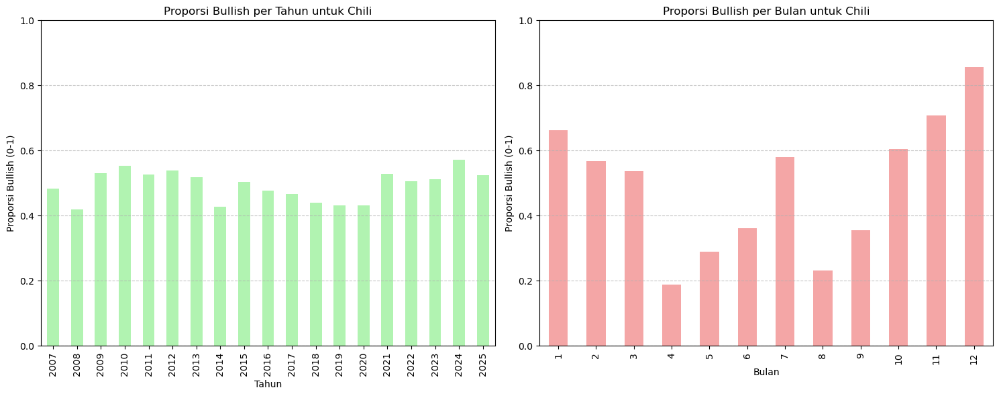

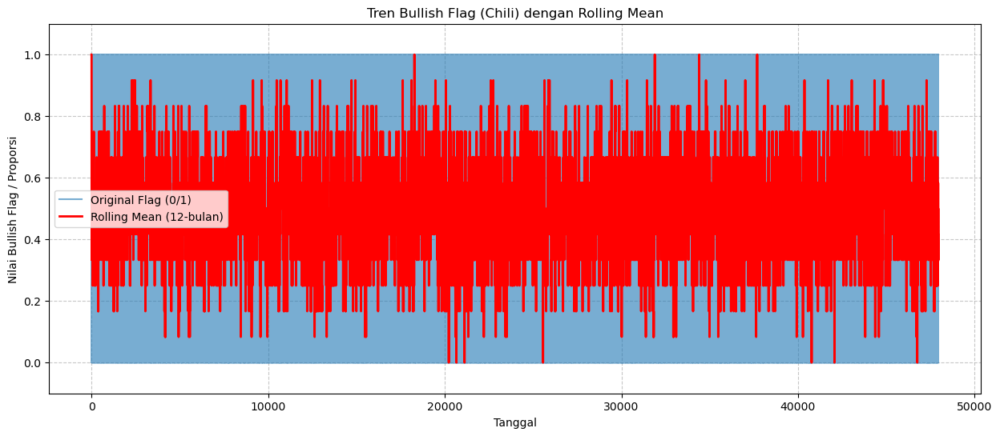


Analisis untuk: Eggs
Proporsi Bullish per Tahun (mean dari bullish_flag_eggs):
year
2007    0.509
2008    0.530
2009    0.278
2010    0.295
2011    0.414
2012    0.429
2013    0.512
2014    0.409
2015    0.532
2016    0.329
2017    0.538
2018    0.534
2019    0.441
2020    0.556
2021    0.426
2022    0.647
2023    0.461
2024    0.541
2025    0.715
Name: bullish_flag_eggs, dtype: float64

Proporsi Bullish per Bulan (mean dari bullish_flag_eggs):
month
1     0.454
2     0.407
3     0.481
4     0.403
5     0.476
6     0.596
7     0.533
8     0.344
9     0.304
10    0.322
11    0.605
12    0.754
Name: bullish_flag_eggs, dtype: float64

Rolling Mean (12-bulan) untuk bullish_flag_eggs:
47940    0.833333
47941    0.833333
47942    0.750000
47943    0.833333
47944    0.750000
Name: bullish_flag_eggs, dtype: float64


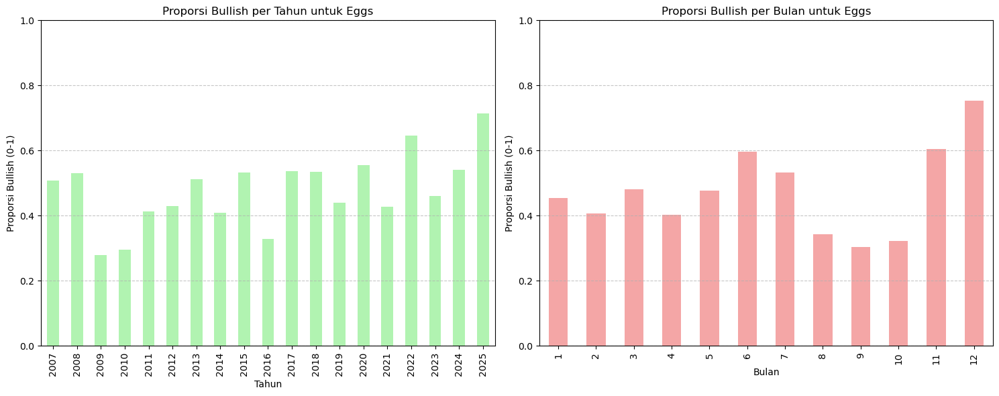

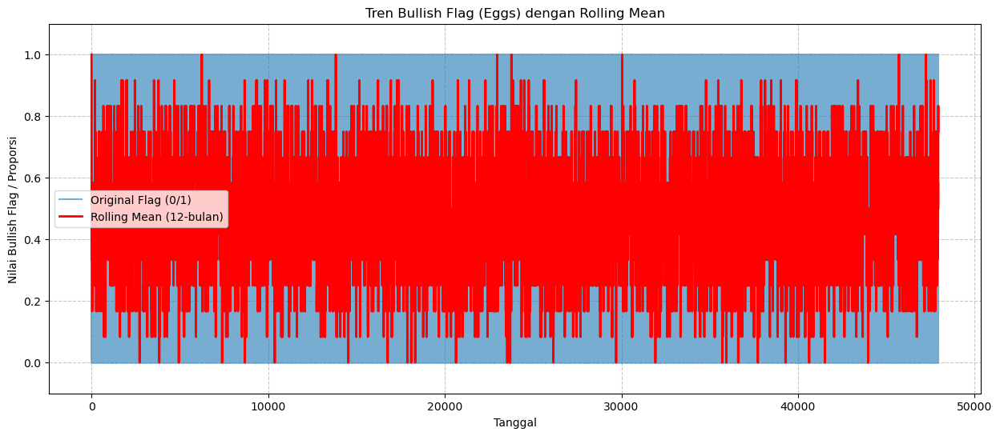


Analisis untuk: Garlic
Proporsi Bullish per Tahun (mean dari bullish_flag_garlic):
year
2007    0.552
2008    0.409
2009    0.586
2010    0.670
2011    0.559
2012    0.498
2013    0.376
2014    0.500
2015    0.434
2016    0.518
2017    0.480
2018    0.405
2019    0.566
2020    0.435
2021    0.524
2022    0.498
2023    0.674
2024    0.664
2025    0.755
Name: bullish_flag_garlic, dtype: float64

Proporsi Bullish per Bulan (mean dari bullish_flag_garlic):
month
1     0.747
2     0.715
3     0.615
4     0.399
5     0.345
6     0.369
7     0.554
8     0.229
9     0.331
10    0.569
11    0.664
12    0.782
Name: bullish_flag_garlic, dtype: float64

Rolling Mean (12-bulan) untuk bullish_flag_garlic:
47940    0.750000
47941    0.750000
47942    0.750000
47943    0.833333
47944    0.833333
Name: bullish_flag_garlic, dtype: float64


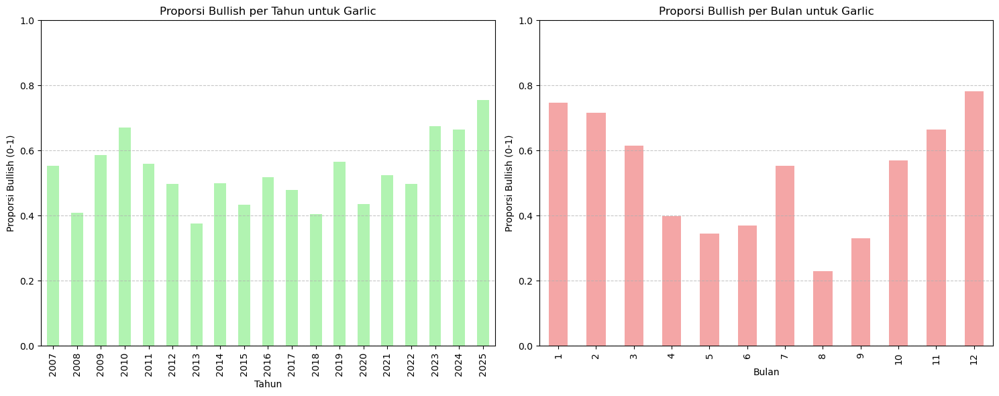

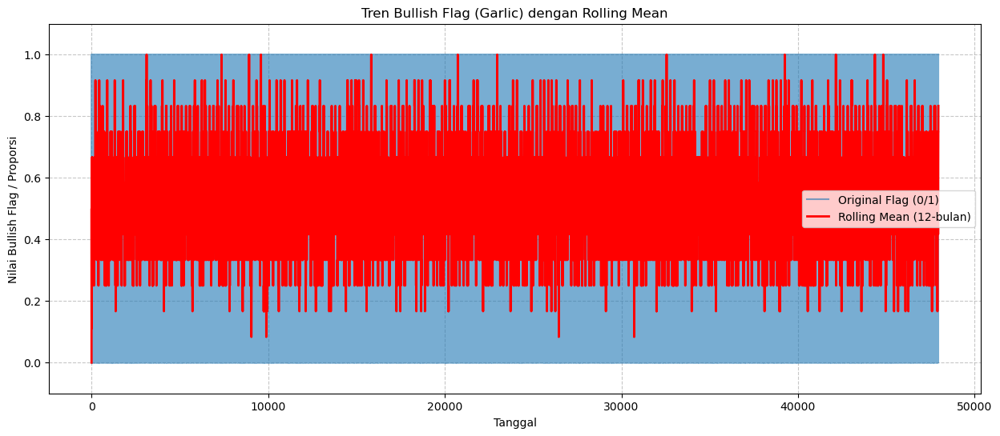


Analisis untuk: Meat Beef
Proporsi Bullish per Tahun (mean dari bullish_flag_meat_beef):
year
2007    0.536
2008    0.518
2009    0.491
2010    0.441
2011    0.488
2012    0.457
2013    0.410
2014    0.460
2015    0.453
2016    0.445
2017    0.488
2018    0.504
2019    0.521
2020    0.446
2021    0.535
2022    0.562
2023    0.391
2024    0.532
2025    0.680
Name: bullish_flag_meat_beef, dtype: float64

Proporsi Bullish per Bulan (mean dari bullish_flag_meat_beef):
month
1     0.443
2     0.467
3     0.523
4     0.534
5     0.502
6     0.536
7     0.537
8     0.459
9     0.474
10    0.430
11    0.423
12    0.527
Name: bullish_flag_meat_beef, dtype: float64

Rolling Mean (12-bulan) untuk bullish_flag_meat_beef:
47940    0.500000
47941    0.500000
47942    0.583333
47943    0.666667
47944    0.666667
Name: bullish_flag_meat_beef, dtype: float64


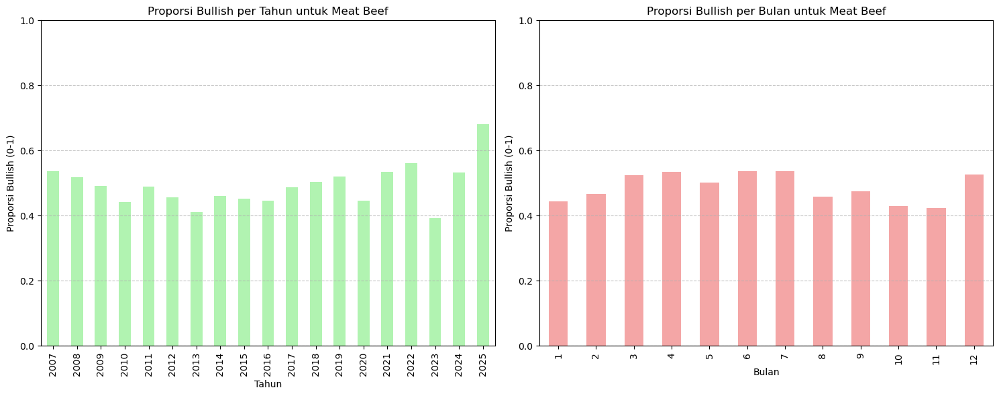

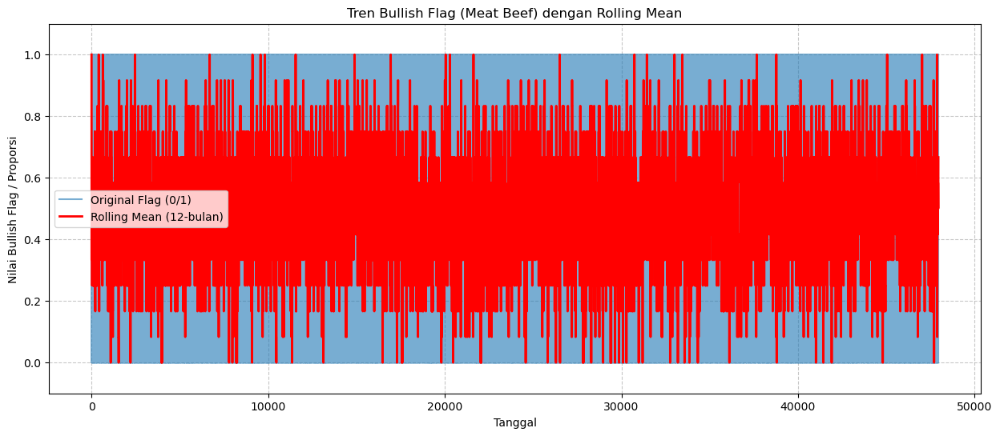


Analisis untuk: Meat Chicken
Proporsi Bullish per Tahun (mean dari bullish_flag_meat_chicken):
year
2007    0.591
2008    0.563
2009    0.421
2010    0.540
2011    0.539
2012    0.422
2013    0.380
2014    0.475
2015    0.396
2016    0.411
2017    0.557
2018    0.492
2019    0.555
2020    0.536
2021    0.541
2022    0.492
2023    0.481
2024    0.681
2025    0.804
Name: bullish_flag_meat_chicken, dtype: float64

Proporsi Bullish per Bulan (mean dari bullish_flag_meat_chicken):
month
1     0.418
2     0.390
3     0.454
4     0.689
5     0.688
6     0.798
7     0.571
8     0.454
9     0.423
10    0.320
11    0.426
12    0.507
Name: bullish_flag_meat_chicken, dtype: float64

Rolling Mean (12-bulan) untuk bullish_flag_meat_chicken:
47940    0.416667
47941    0.500000
47942    0.500000
47943    0.583333
47944    0.500000
Name: bullish_flag_meat_chicken, dtype: float64


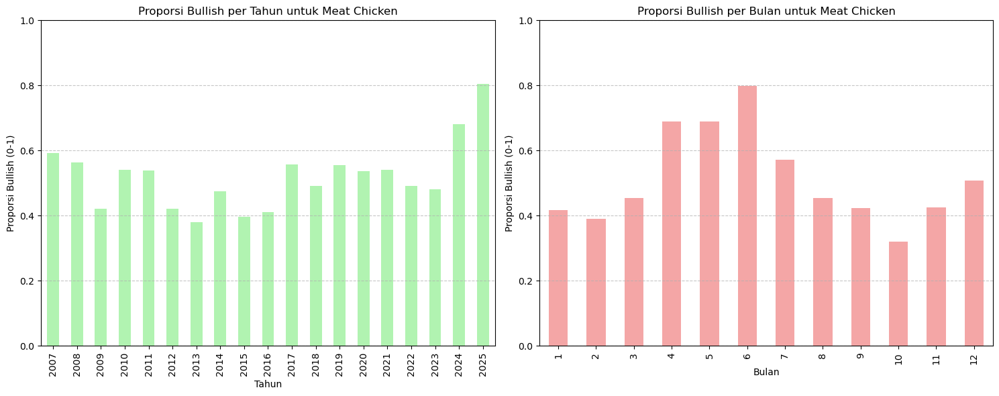

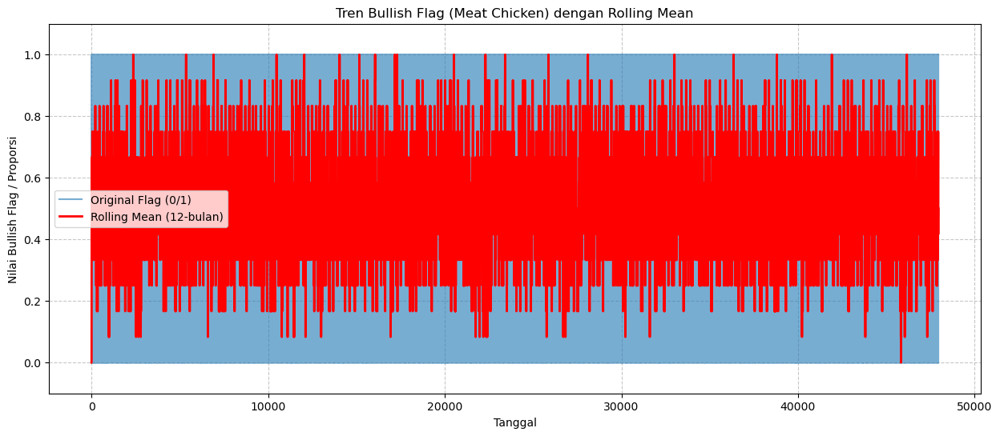


Analisis untuk: Meat Chicken Broiler
Proporsi Bullish per Tahun (mean dari bullish_flag_meat_chicken_broiler):
year
2007    0.596
2008    0.632
2009    0.282
2010    0.483
2011    0.480
2012    0.512
2013    0.618
2014    0.421
2015    0.479
2016    0.358
2017    0.490
2018    0.487
2019    0.388
2020    0.443
2021    0.486
2022    0.452
2023    0.450
2024    0.678
2025    0.783
Name: bullish_flag_meat_chicken_broiler, dtype: float64

Proporsi Bullish per Bulan (mean dari bullish_flag_meat_chicken_broiler):
month
1     0.508
2     0.334
3     0.400
4     0.571
5     0.706
6     0.755
7     0.443
8     0.424
9     0.378
10    0.337
11    0.516
12    0.549
Name: bullish_flag_meat_chicken_broiler, dtype: float64

Rolling Mean (12-bulan) untuk bullish_flag_meat_chicken_broiler:
47940    0.833333
47941    0.833333
47942    0.833333
47943    0.833333
47944    0.750000
Name: bullish_flag_meat_chicken_broiler, dtype: float64


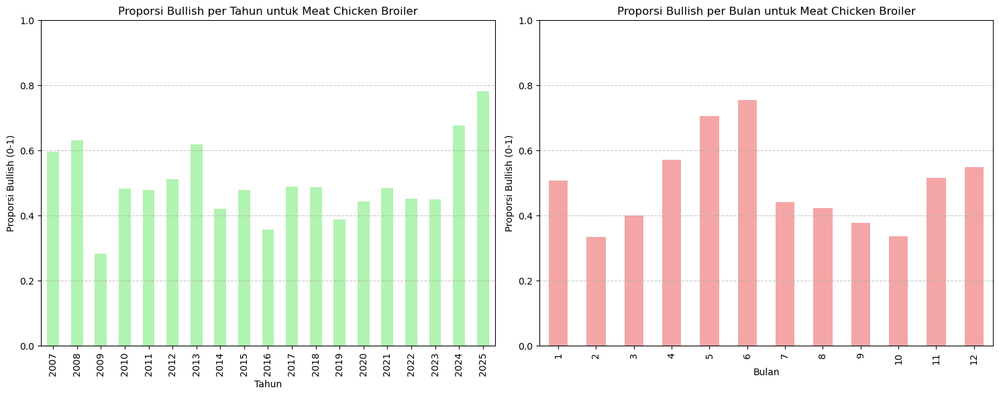

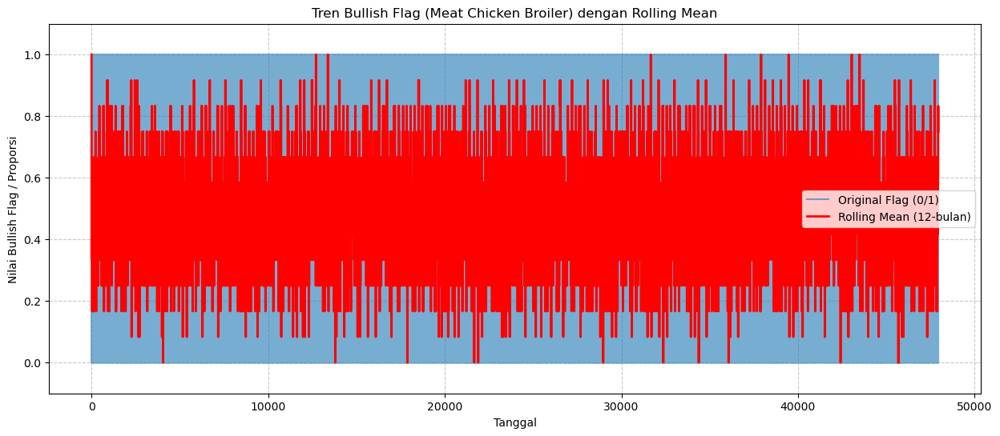


Analisis untuk: Oil
Proporsi Bullish per Tahun (mean dari bullish_flag_oil):
year
2007    0.572
2008    0.522
2009    0.482
2010    0.405
2011    0.474
2012    0.461
2013    0.451
2014    0.475
2015    0.479
2016    0.515
2017    0.554
2018    0.524
2019    0.512
2020    0.507
2021    0.730
2022    0.535
2023    0.395
2024    0.526
2025    0.625
Name: bullish_flag_oil, dtype: float64

Proporsi Bullish per Bulan (mean dari bullish_flag_oil):
month
1     0.397
2     0.435
3     0.561
4     0.561
5     0.497
6     0.563
7     0.550
8     0.530
9     0.545
10    0.459
11    0.464
12    0.562
Name: bullish_flag_oil, dtype: float64

Rolling Mean (12-bulan) untuk bullish_flag_oil:
47940    0.500000
47941    0.500000
47942    0.500000
47943    0.583333
47944    0.583333
Name: bullish_flag_oil, dtype: float64


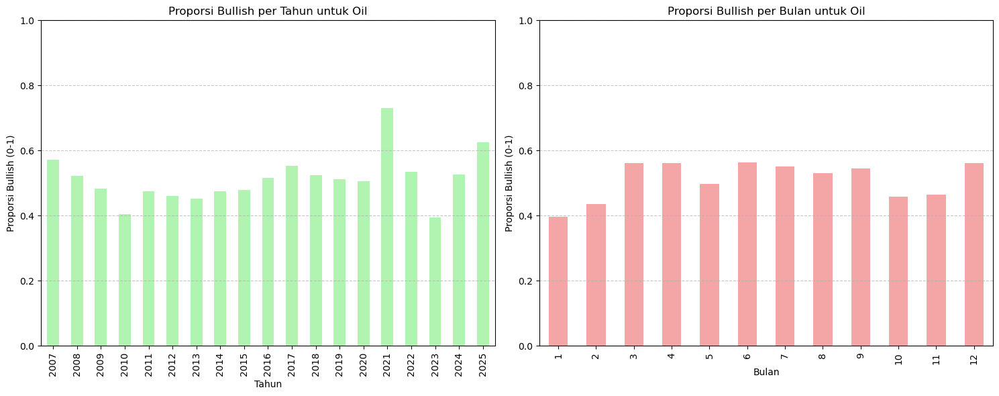

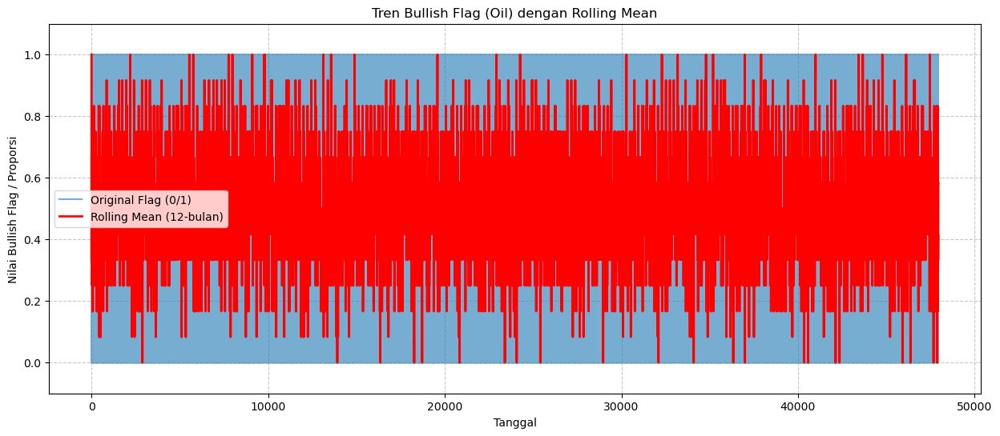


Analisis untuk: Onions
Proporsi Bullish per Tahun (mean dari bullish_flag_onions):
year
2007    0.594
2008    0.422
2009    0.616
2010    0.702
2011    0.591
2012    0.503
2013    0.357
2014    0.486
2015    0.462
2016    0.465
2017    0.501
2018    0.398
2019    0.518
2020    0.403
2021    0.423
2022    0.591
2023    0.485
2024    0.667
2025    0.828
Name: bullish_flag_onions, dtype: float64

Proporsi Bullish per Bulan (mean dari bullish_flag_onions):
month
1     0.710
2     0.666
3     0.572
4     0.573
5     0.557
6     0.448
7     0.507
8     0.155
9     0.217
10    0.448
11    0.635
12    0.732
Name: bullish_flag_onions, dtype: float64

Rolling Mean (12-bulan) untuk bullish_flag_onions:
47940    0.750000
47941    0.750000
47942    0.750000
47943    0.750000
47944    0.666667
Name: bullish_flag_onions, dtype: float64


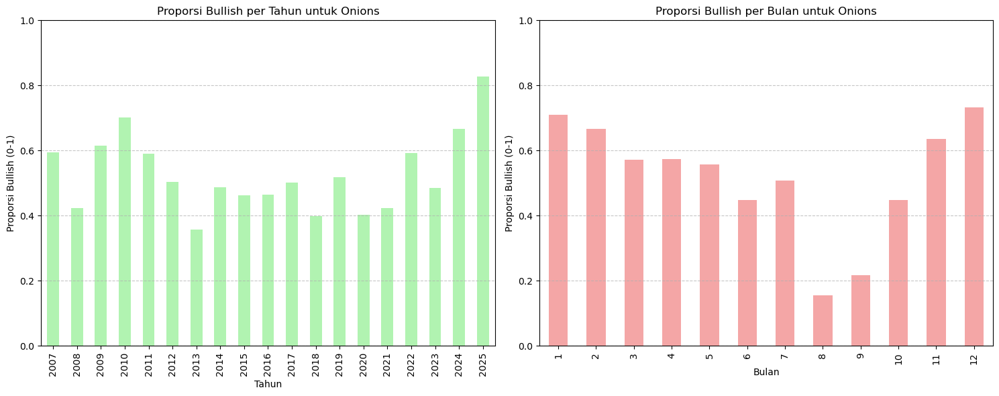

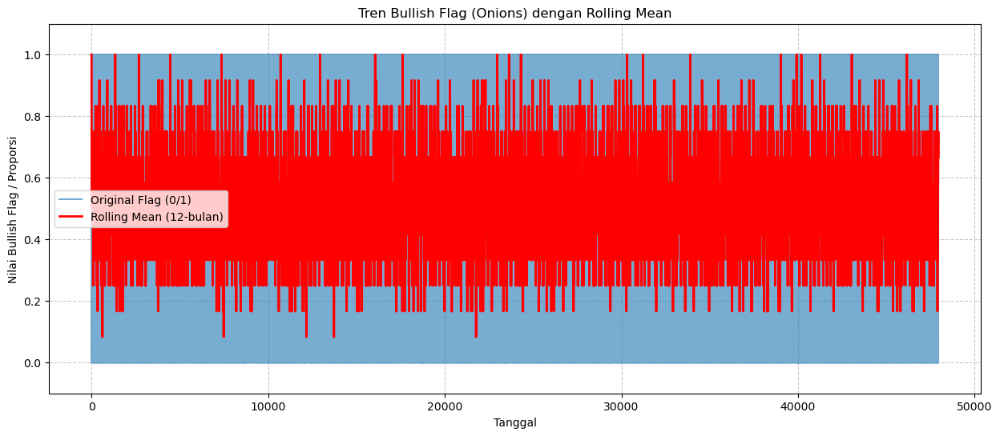


Analisis untuk: Rice
Proporsi Bullish per Tahun (mean dari bullish_flag_rice):
year
2007    0.550
2008    0.542
2009    0.492
2010    0.593
2011    0.506
2012    0.509
2013    0.540
2014    0.419
2015    0.490
2016    0.312
2017    0.489
2018    0.499
2019    0.331
2020    0.271
2021    0.265
2022    0.433
2023    0.602
2024    0.676
2025    0.569
Name: bullish_flag_rice, dtype: float64

Proporsi Bullish per Bulan (mean dari bullish_flag_rice):
month
1     0.518
2     0.369
3     0.426
4     0.345
5     0.458
6     0.497
7     0.506
8     0.459
9     0.444
10    0.490
11    0.531
12    0.682
Name: bullish_flag_rice, dtype: float64

Rolling Mean (12-bulan) untuk bullish_flag_rice:
47940    0.583333
47941    0.666667
47942    0.666667
47943    0.583333
47944    0.500000
Name: bullish_flag_rice, dtype: float64


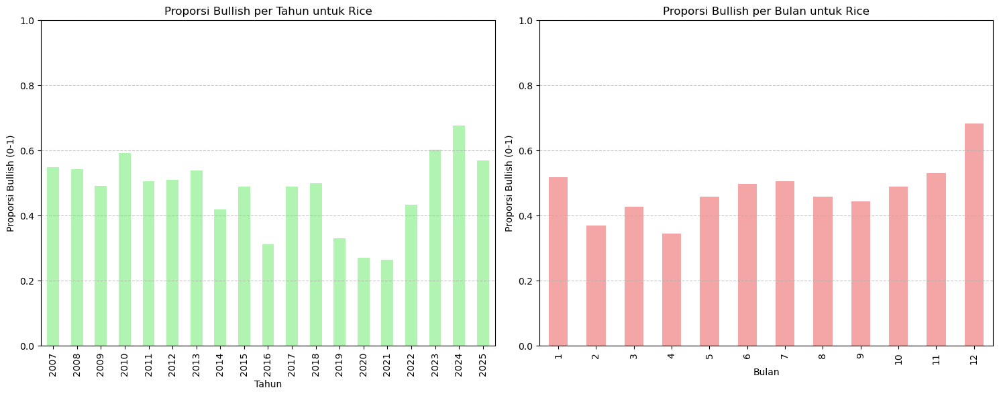

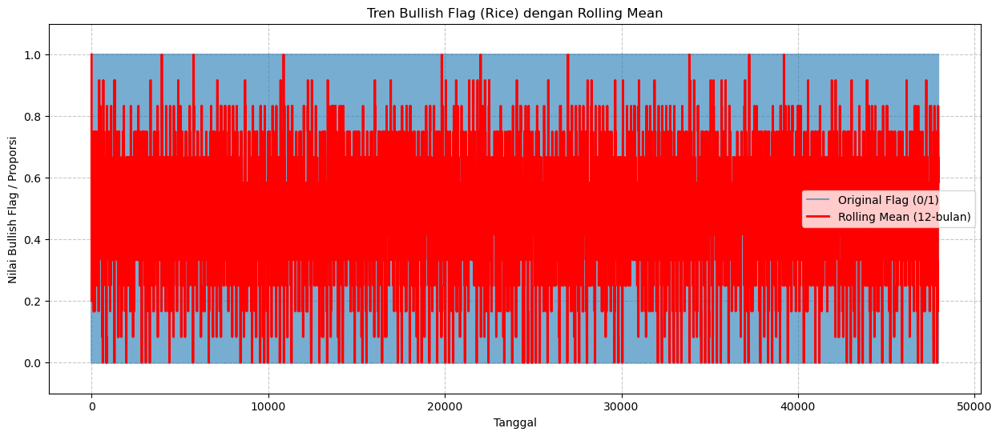


Analisis untuk: Sugar
Proporsi Bullish per Tahun (mean dari bullish_flag_sugar):
year
2007    0.519
2008    0.512
2009    0.510
2010    0.597
2011    0.500
2012    0.525
2013    0.558
2014    0.386
2015    0.529
2016    0.444
2017    0.391
2018    0.514
2019    0.303
2020    0.392
2021    0.222
2022    0.423
2023    0.526
2024    0.612
2025    0.599
Name: bullish_flag_sugar, dtype: float64

Proporsi Bullish per Bulan (mean dari bullish_flag_sugar):
month
1     0.530
2     0.409
3     0.494
4     0.314
5     0.427
6     0.445
7     0.505
8     0.422
9     0.435
10    0.478
11    0.536
12    0.707
Name: bullish_flag_sugar, dtype: float64

Rolling Mean (12-bulan) untuk bullish_flag_sugar:
47940    0.500000
47941    0.500000
47942    0.416667
47943    0.333333
47944    0.333333
Name: bullish_flag_sugar, dtype: float64


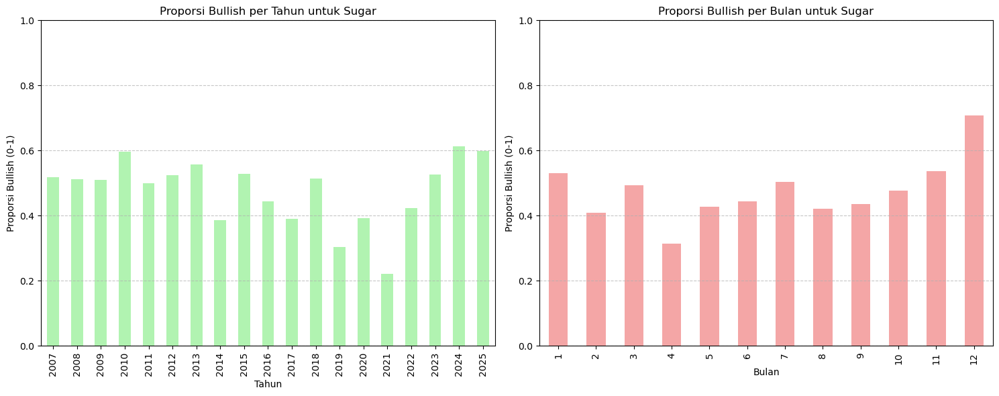

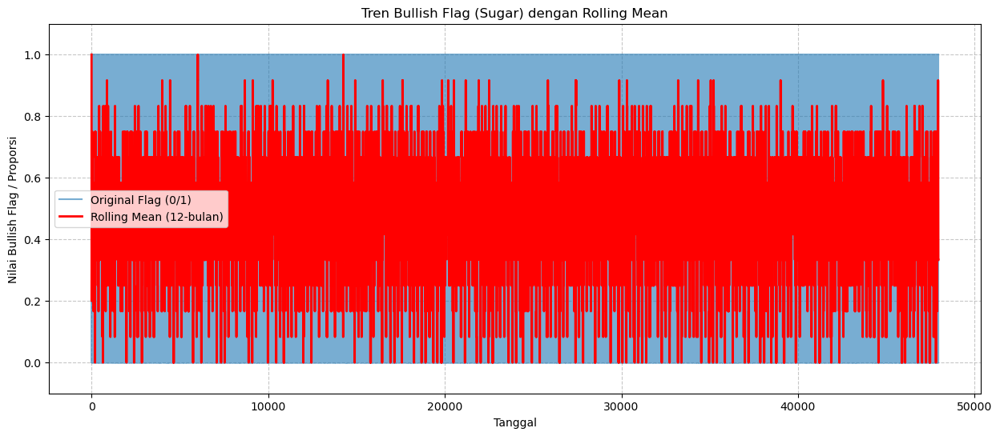


Analisis untuk: Food Price Index
Proporsi Bullish per Tahun (mean dari bullish_flag_food_price_index):
year
2007    0.198
2008    0.215
2009    0.170
2010    0.327
2011    0.278
2012    0.227
2013    0.154
2014    0.175
2015    0.310
2016    0.265
2017    0.322
2018    0.241
2019    0.224
2020    0.329
2021    0.416
2022    0.483
2023    0.466
2024    0.576
2025    0.626
Name: bullish_flag_food_price_index, dtype: float64

Proporsi Bullish per Bulan (mean dari bullish_flag_food_price_index):
month
1     0.428
2     0.329
3     0.345
4     0.257
5     0.242
6     0.274
7     0.288
8     0.062
9     0.112
10    0.267
11    0.451
12    0.652
Name: bullish_flag_food_price_index, dtype: float64

Rolling Mean (12-bulan) untuk bullish_flag_food_price_index:
47940    0.666667
47941    0.666667
47942    0.666667
47943    0.583333
47944    0.666667
Name: bullish_flag_food_price_index, dtype: float64


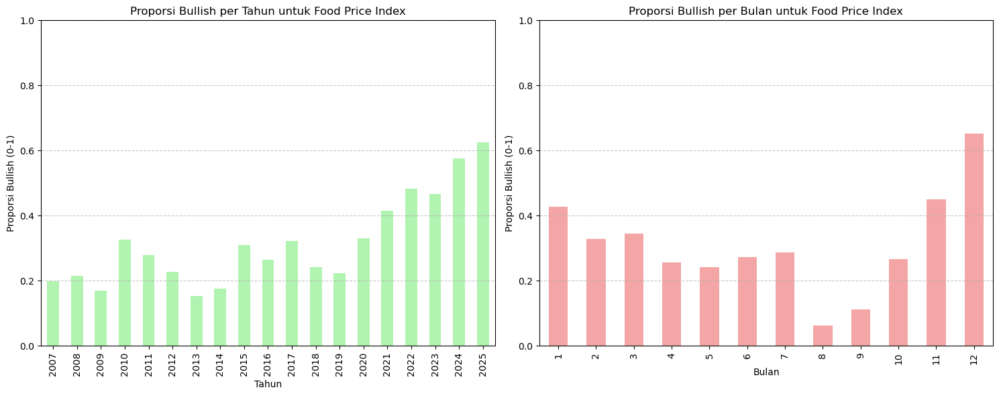

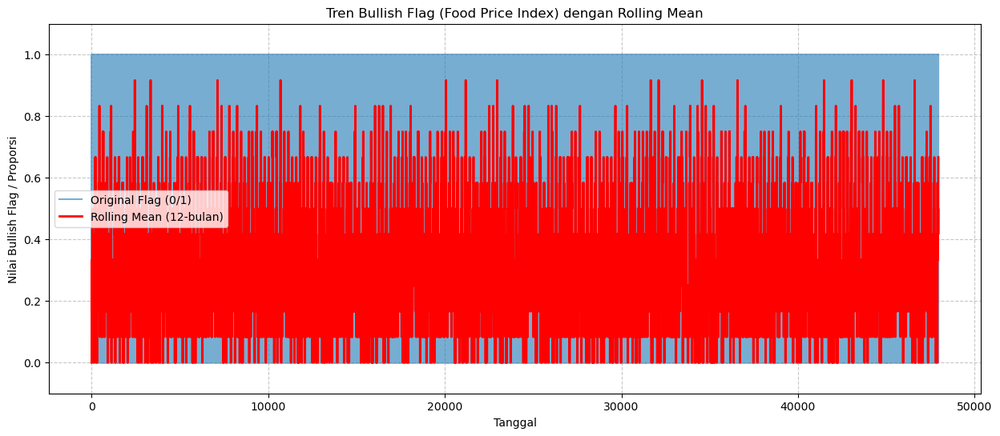

In [14]:
# --- Proporsi Candle Pattern Flag (Bullish vs Bearish) ---
print("\n--- Analisis Temporal Fitur Candle Pattern Flag ---")

bullish_flag_cols = [col for col in food_price_df.columns if 'bullish_flag_' in col]

for flag_col in bullish_flag_cols:
    commodity_name = flag_col.replace('bullish_flag_', '').replace('_', ' ').title()
    print(f"\nAnalisis untuk: {commodity_name}")

    # 1. Proporsi Bullish per Tahun
    if 'year' in food_price_df.columns:
        annual_bullish_proportion = food_price_df.groupby('year')[flag_col].mean()
        print(f"Proporsi Bullish per Tahun (mean dari {flag_col}):")
        print(annual_bullish_proportion.round(3))
    else:
        print("Kolom 'year' tidak ditemukan untuk analisis tahunan.")

    # 2. Proporsi Bullish per Bulan (across all years)
    if 'month' in food_price_df.columns:
        monthly_bullish_proportion = food_price_df.groupby('month')[flag_col].mean()
        print(f"\nProporsi Bullish per Bulan (mean dari {flag_col}):")
        print(monthly_bullish_proportion.round(3))
    else:
        print("Kolom 'month' tidak ditemukan untuk analisis bulanan.")

    # 3. Rolling Mean (Tren Jangka Menengah/Panjang)
    rolling_window = 12 # Contoh: rata-rata per 12 bulan
    rolling_mean_flag = food_price_df[flag_col].rolling(window=rolling_window, min_periods=1).mean()
    print(f"\nRolling Mean ({rolling_window}-bulan) untuk {flag_col}:")
    print(rolling_mean_flag.tail()) # Tampilkan beberapa nilai terakhir

    # --- Visualisasi Temporal Candle Pattern Flag ---
    
    plt.figure(figsize=(15, 6))
    
    # Plot 1: Proportions per Year (Bar Plot)
    if 'year' in food_price_df.columns:
        plt.subplot(1, 2, 1) # 1 baris, 2 kolom, plot 1
        annual_bullish_proportion.plot(kind='bar', color='lightgreen', alpha=0.7)
        plt.title(f'Proporsi Bullish per Tahun untuk {commodity_name}')
        plt.xlabel('Tahun')
        plt.ylabel('Proporsi Bullish (0-1)')
        plt.ylim(0, 1)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Plot 2: Proportions per Month (Bar Plot)
    if 'month' in food_price_df.columns:
        plt.subplot(1, 2, 2) # 1 baris, 2 kolom, plot 2
        monthly_bullish_proportion.plot(kind='bar', color='lightcoral', alpha=0.7)
        plt.title(f'Proporsi Bullish per Bulan untuk {commodity_name}')
        plt.xlabel('Bulan')
        plt.ylabel('Proporsi Bullish (0-1)')
        plt.ylim(0, 1)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()

    # Plot 3: Rolling Mean over Time (Line Plot)
    plt.figure(figsize=(15, 6))
    plt.plot(food_price_df.index, food_price_df[flag_col], label='Original Flag (0/1)', alpha=0.6)
    plt.plot(rolling_mean_flag.index, rolling_mean_flag, label=f'Rolling Mean ({rolling_window}-bulan)', color='red', linewidth=2)
    plt.title(f'Tren Bullish Flag ({commodity_name}) dengan Rolling Mean')
    plt.xlabel('Tanggal')
    plt.ylabel('Nilai Bullish Flag / Proporsi')
    plt.ylim(-0.1, 1.1)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()


ANALISIS TEMPORAL (sekaligus visualisasi time series)

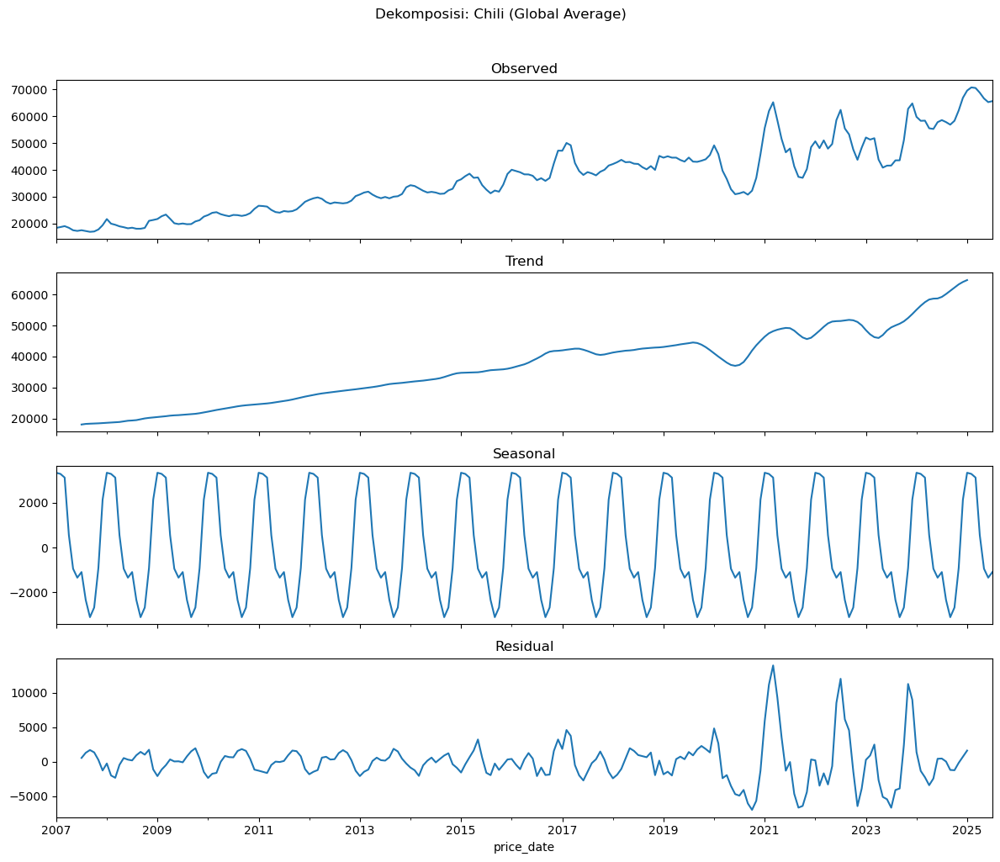

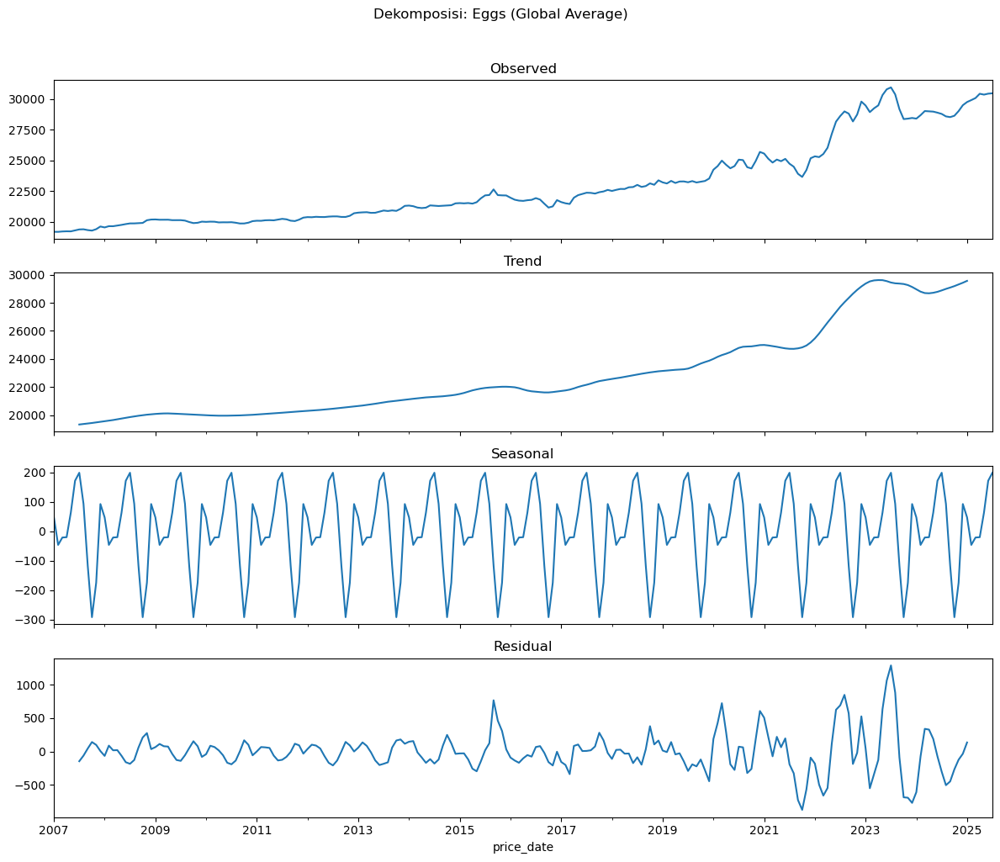

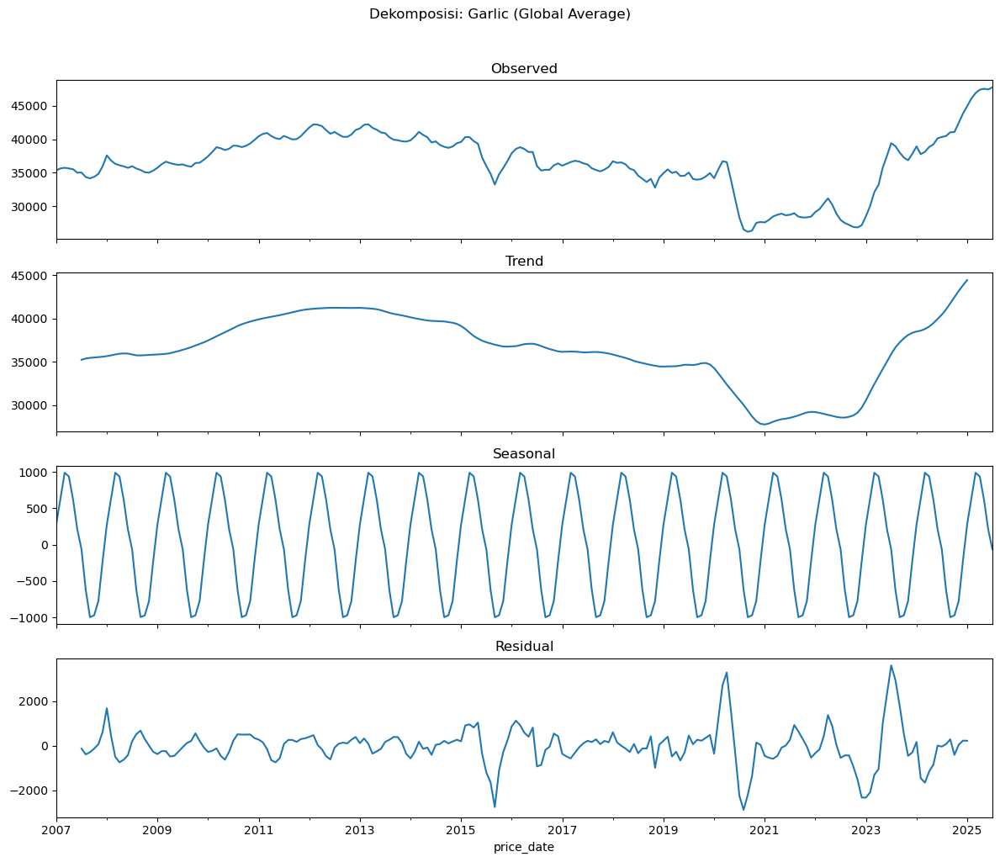

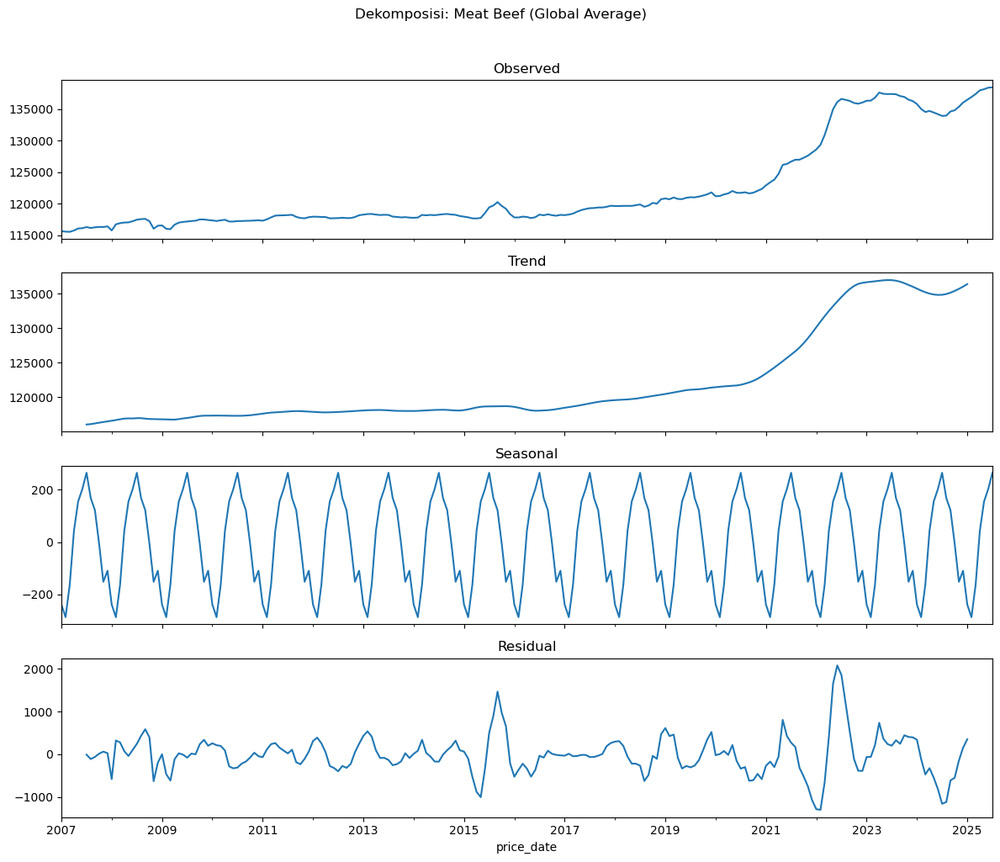

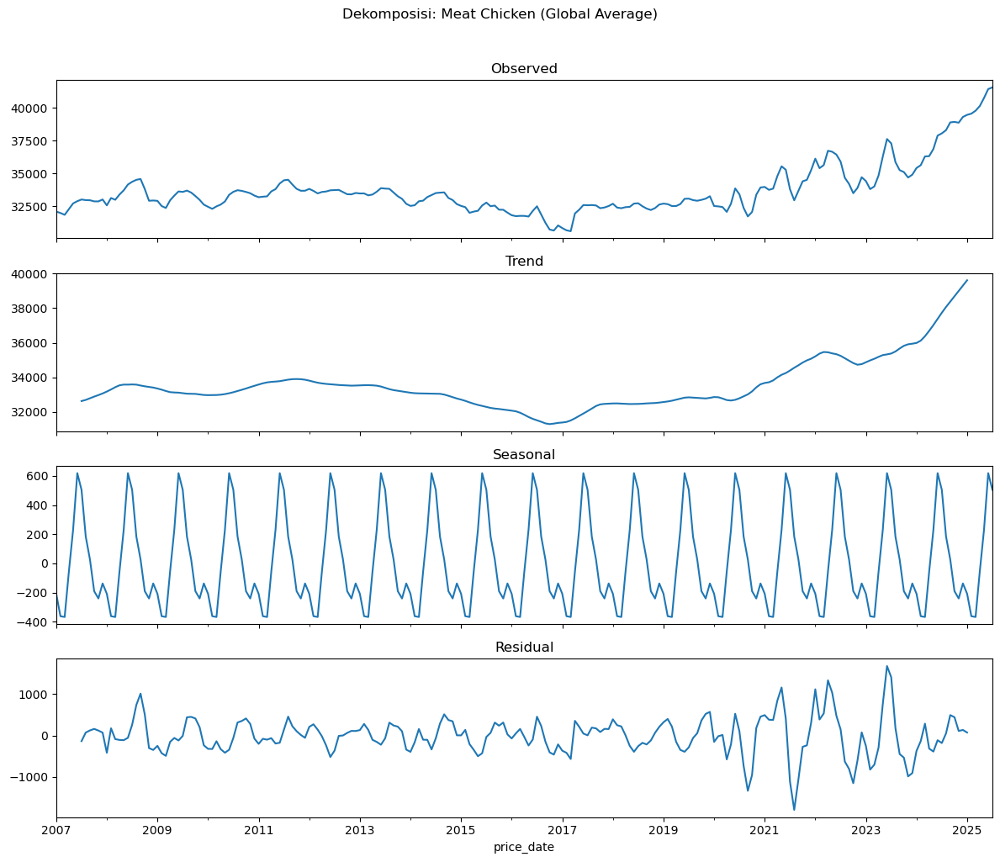

...

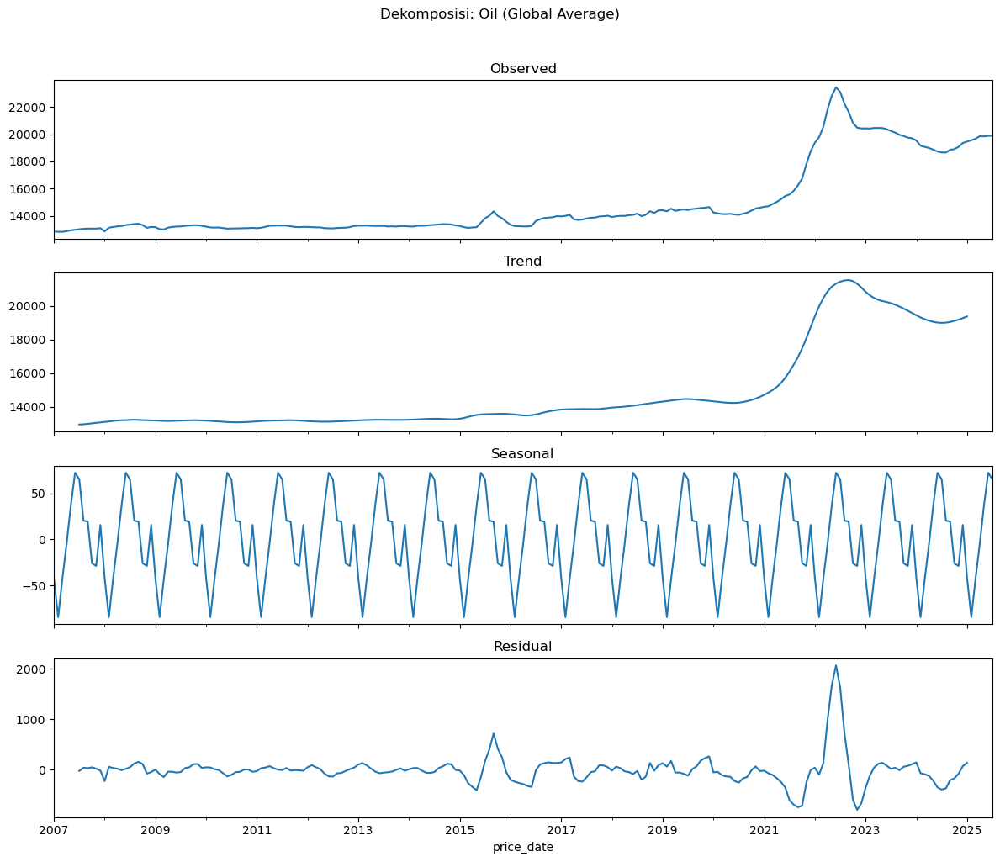

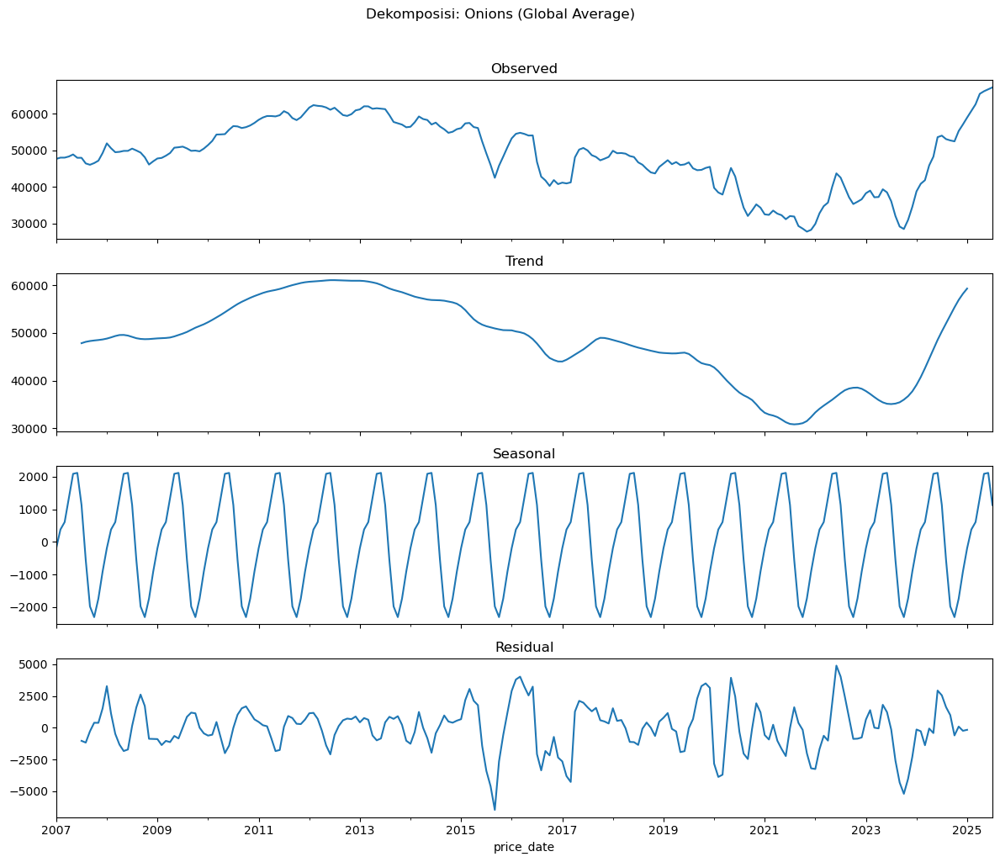

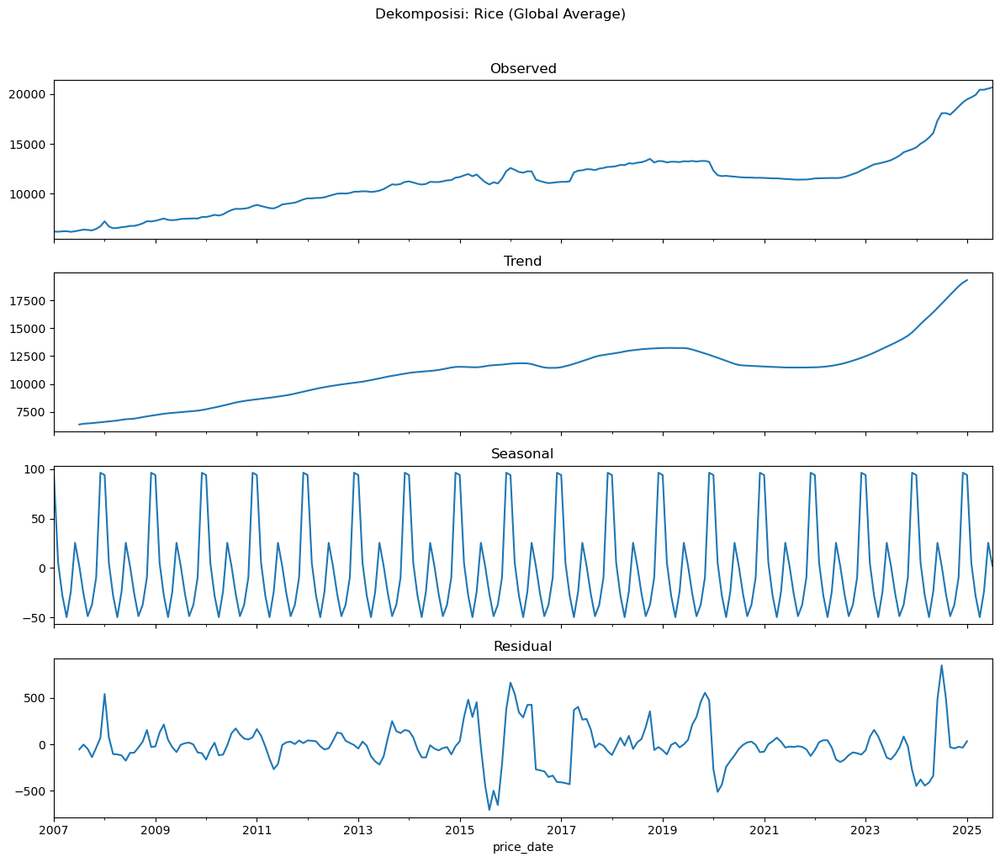

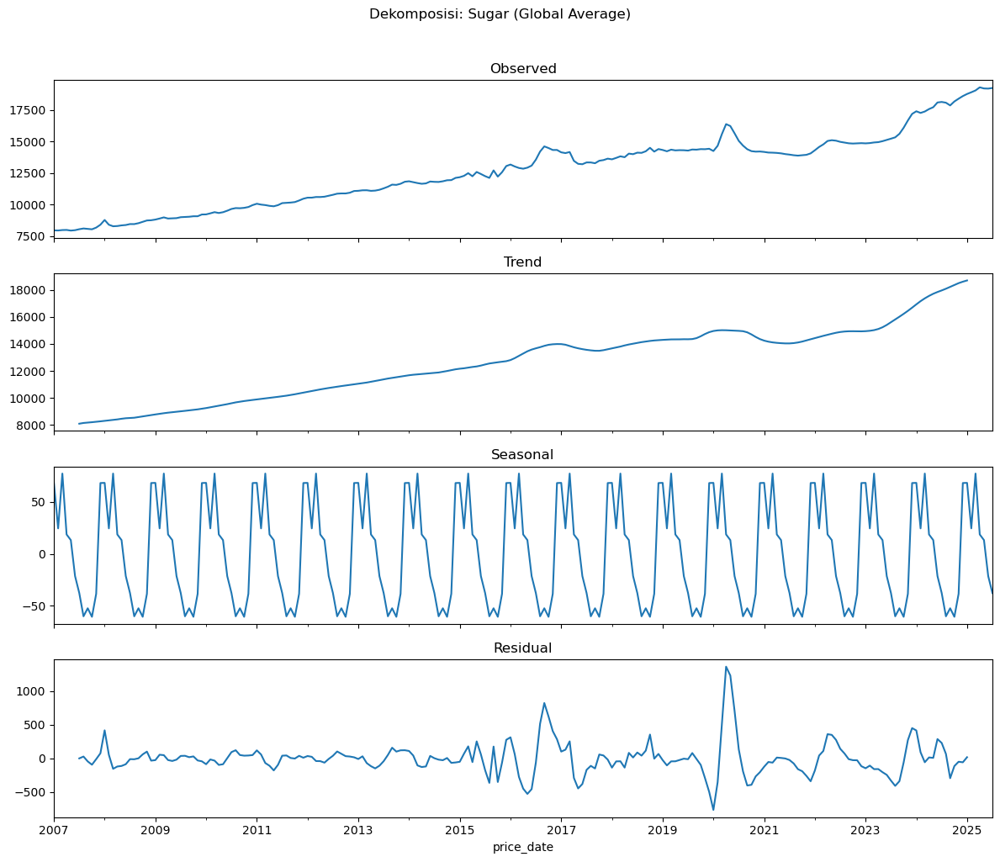

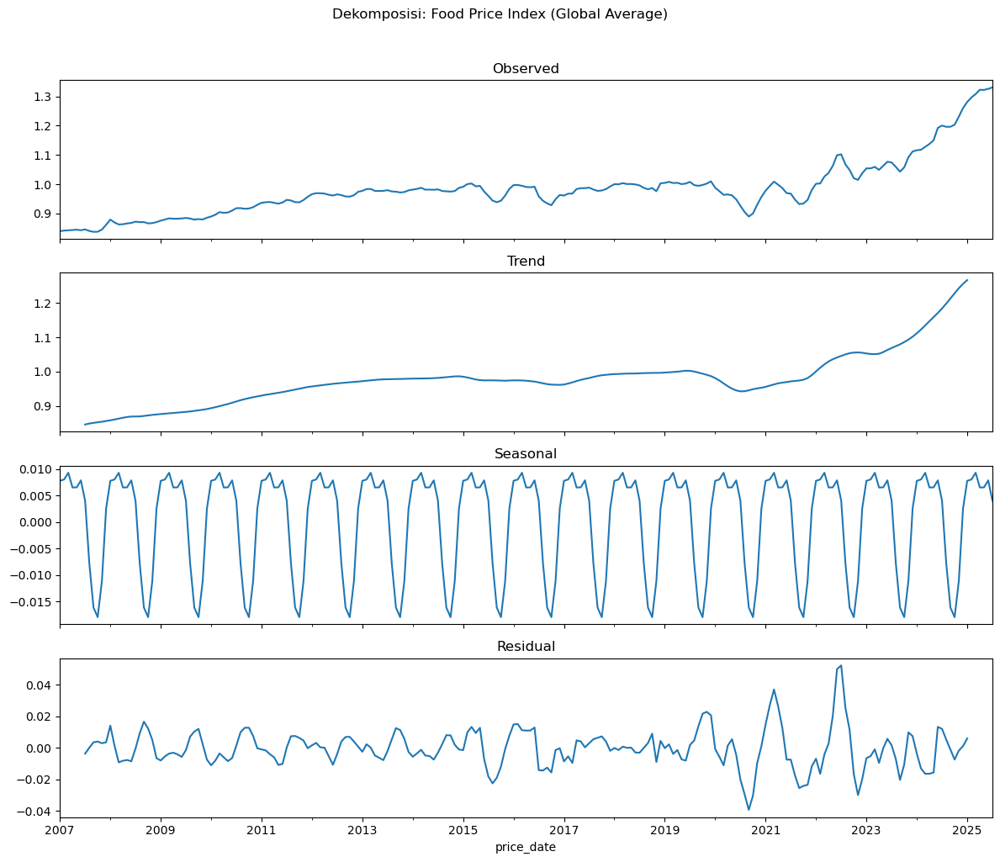


--- Dekomposisi Deret Waktu Selesai ---
--------------------------------------------------


In [15]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss
from scipy.signal import periodogram

# --- Dekomposisi Deret Waktu ---
food_price_df['price_date'] = pd.to_datetime(food_price_df['price_date'], errors='coerce')
provinces = food_price_df['adm1_name'].unique()
commodities_detailed = [
    'chili', 'eggs', 'garlic', 'meat_beef', 'meat_chicken',
    'meat_chicken_broiler', 'oil', 'onions', 'rice', 'sugar', 'food_price_index'
]
price_type = ['c']

for commodity in commodities_detailed:
    col_name = f'c_{commodity}'
    if col_name not in food_price_df.columns:
        print(f"Kolom {col_name} tidak ditemukan di DataFrame.")
        continue
    df_global = food_price_df.groupby('price_date', as_index=False)[col_name].mean()

    # Hapus baris yang memiliki nilai kosong setelah penggabungan
    df_global = df_global.dropna(subset=[col_name])

    if df_global.empty:
        print(f"Tidak ada data global untuk {commodity}.")
        continue

    # Set 'price_date' sebagai index dan urutkan
    df_global.set_index('price_date', inplace=True)
    df_global = df_global.sort_index()

    # Pastikan frekuensi data bulanan dan isi missing values jika ada
    ts_data_global = df_global[col_name].asfreq('MS')
    ts_data_global = ts_data_global.interpolate(method='time')

    if len(ts_data_global) >= 2 * 12:  # Minimal 2 siklus tahunan untuk dekomposisi
        try:
            # Lakukan dekomposisi untuk data global
            decomposition_global = seasonal_decompose(ts_data_global, model='additive', period=12)

            # Buat subplot untuk menampilkan hasil dekomposisi
            fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 10), sharex=True)
            decomposition_global.observed.plot(ax=ax1, title='Observed')
            decomposition_global.trend.plot(ax=ax2, title='Trend')
            decomposition_global.seasonal.plot(ax=ax3, title='Seasonal')
            decomposition_global.resid.plot(ax=ax4, title='Residual')
            plt.suptitle(f'Dekomposisi: {commodity.replace("_", " ").title()} (Global Average)', y=1.02)
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Gagal mendekomposisi data global untuk {commodity}: {e}")
    else:
        print(f"Data global tidak cukup untuk dekomposisi untuk {commodity} (kurang dari 2 tahun data).")

print("\n--- Dekomposisi Deret Waktu Selesai ---")
print("-" * 50)

--- Memulai Analisis ACF dan PACF ---


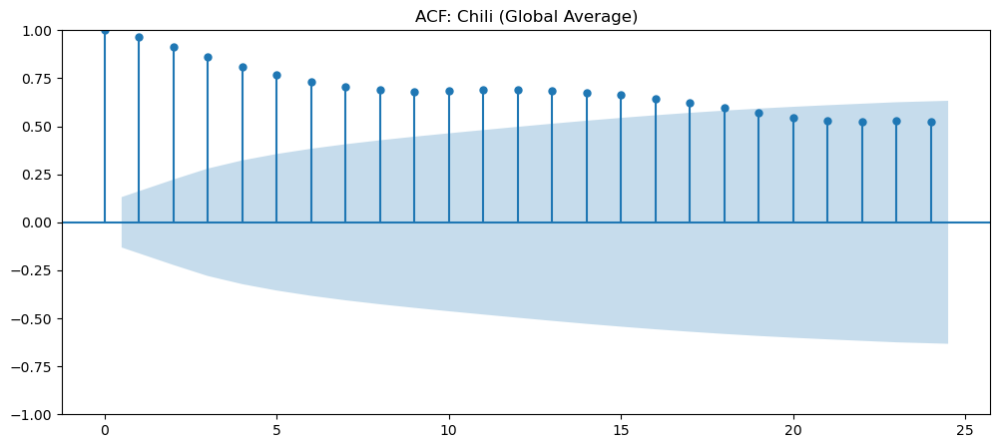

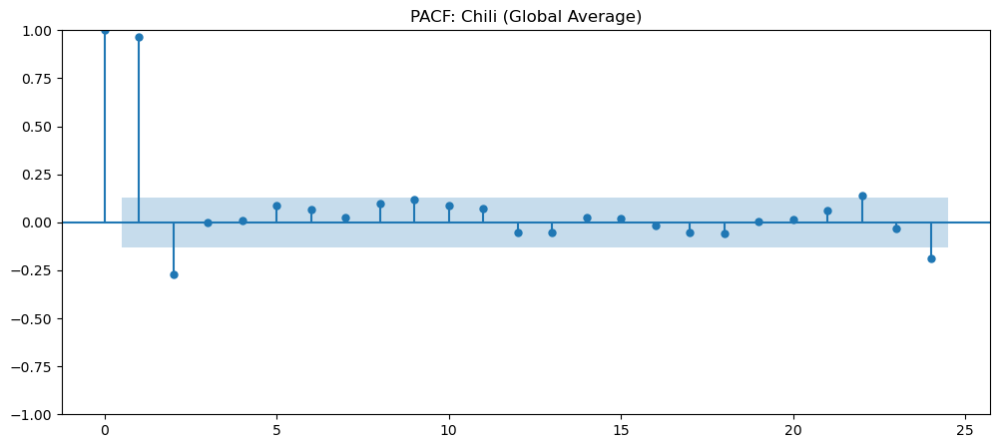

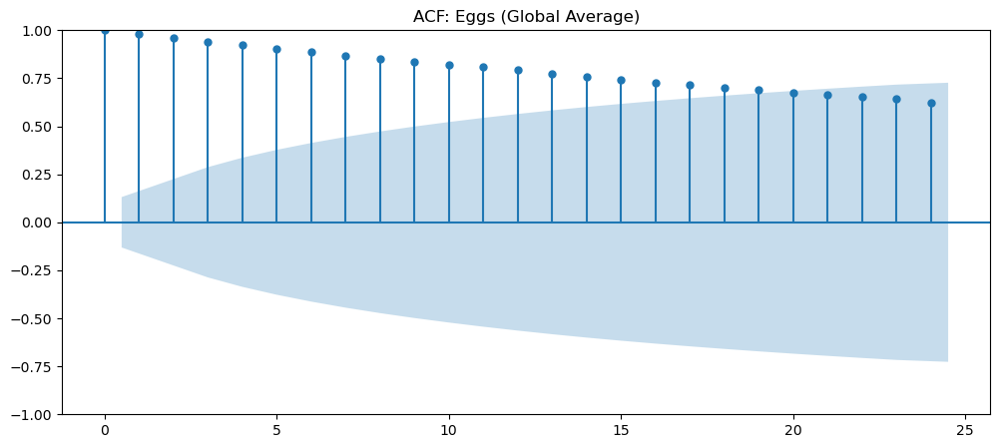

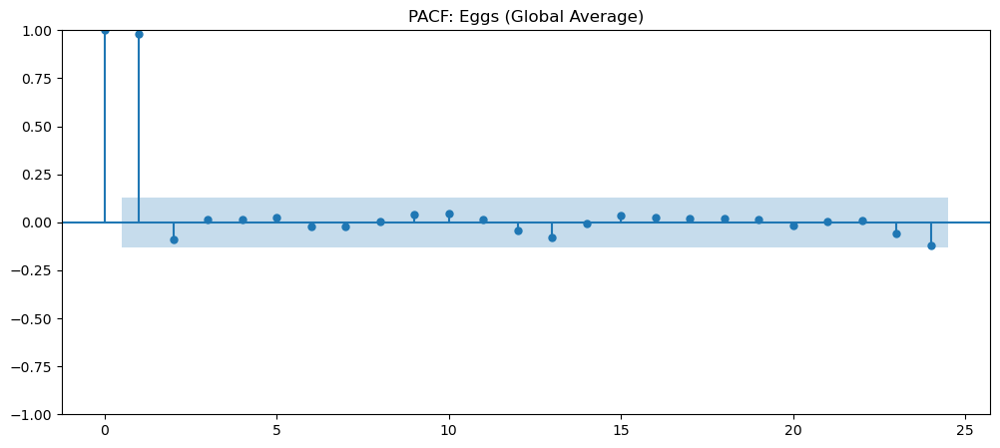

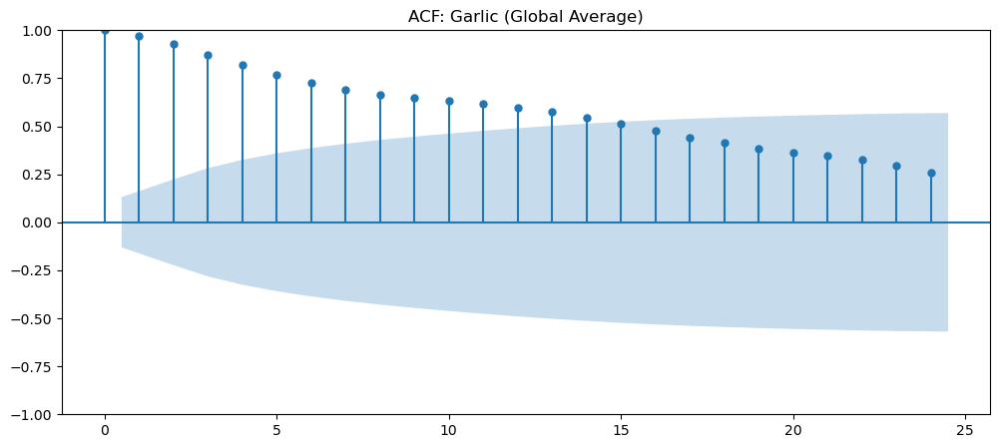

...

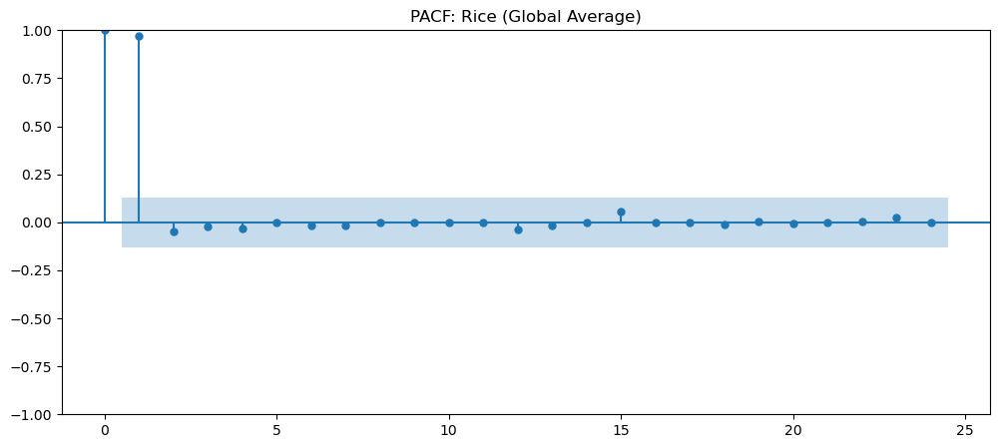

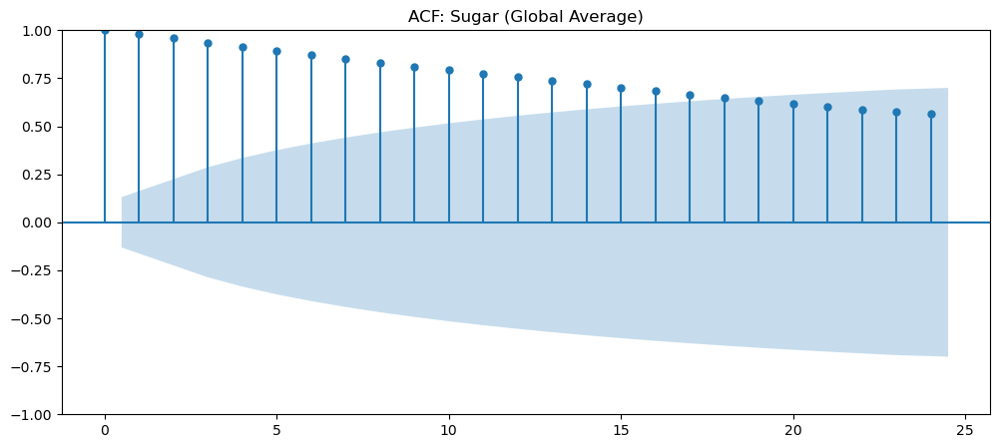

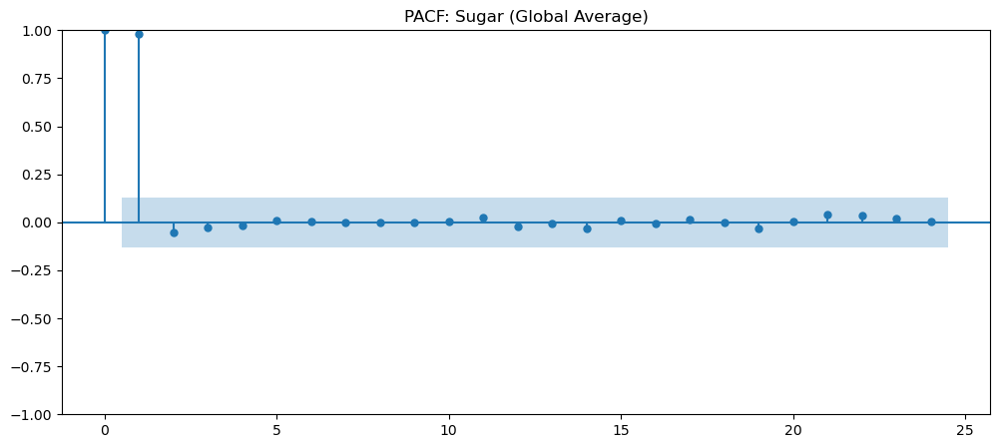

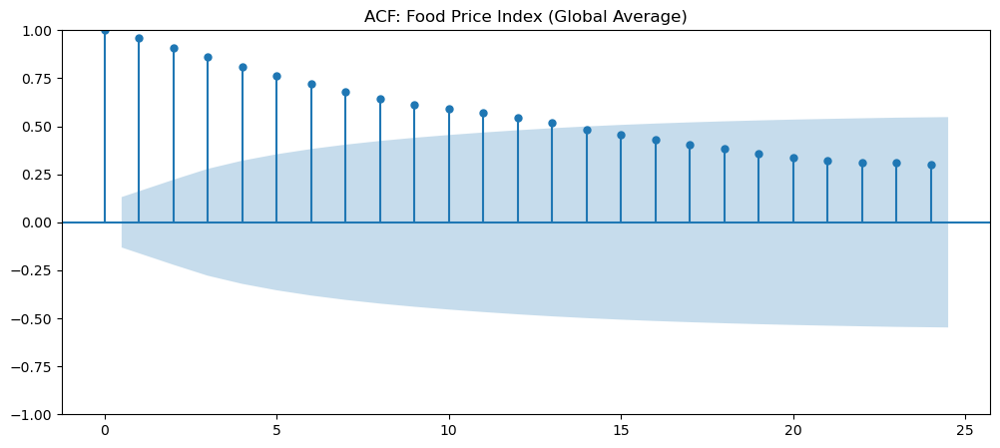

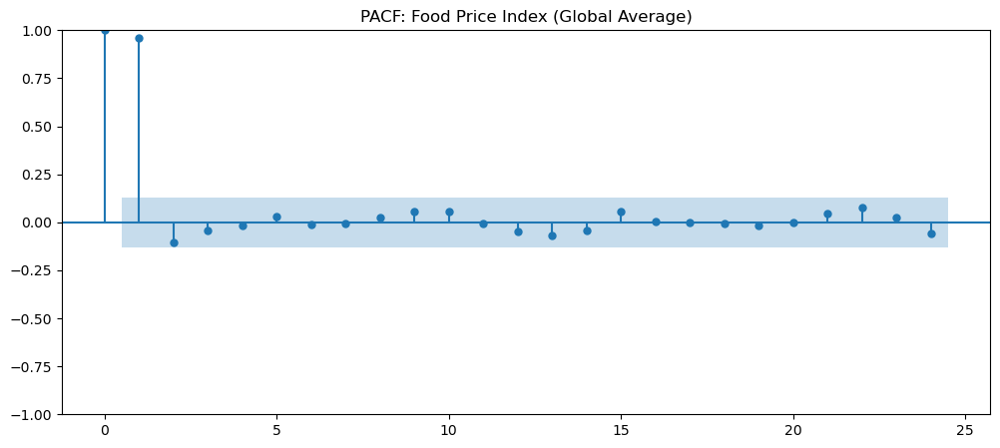


--- Analisis ACF dan PACF Selesai ---
--------------------------------------------------


In [16]:
# --- Analisis ACF dan PACF ---
print("--- Memulai Analisis ACF dan PACF ---")

for commodity in commodities_detailed:
    col_name = f'c_{commodity}'
    if col_name not in food_price_df.columns:
        print(f"Kolom {col_name} tidak ditemukan di DataFrame.")
        continue
    df_global = food_price_df.groupby('price_date', as_index=False)[col_name].mean()

    # Hapus baris yang memiliki nilai kosong setelah penggabungan
    df_global = df_global.dropna(subset=[col_name])

    if df_global.empty:
        print(f"Tidak ada data global untuk {commodity}.")
        continue

    # Set 'price_date' sebagai index dan urutkan
    df_global.set_index('price_date', inplace=True)
    df_global = df_global.sort_index()

    # Pastikan frekuensi data bulanan dan isi missing values jika ada
    ts_data_global = df_global[col_name].asfreq('MS')
    ts_data_global = ts_data_global.interpolate(method='time')

    if not ts_data_global.isnull().all():
        try:
            # Plot ACF
            fig, ax = plt.subplots(figsize=(12, 5))
            plot_acf(ts_data_global, lags=24, ax=ax, title=f'ACF: {commodity.replace("_", " ").title()} (Global Average)')
            plt.show()

            # Plot PACF
            fig, ax = plt.subplots(figsize=(12, 5))
            plot_pacf(ts_data_global, lags=24, ax=ax, title=f'PACF: {commodity.replace("_", " ").title()} (Global Average)')
            plt.show()
        except Exception as e:
            print(f"Gagal menganalisis ACF/PACF untuk {commodity} secara global: {e}")
    else:
        print(f"Deret waktu kosong untuk ACF/PACF pada {commodity} secara global.")

print("\n--- Analisis ACF dan PACF Selesai ---")
print("-" * 50)

In [17]:
# --- Pemeriksaan Stasioneritas (ADF dan KPSS Test) ---
print("--- Memulai Pemeriksaan Stasioneritas ---")

stationarity_results = [] # Untuk menyimpan hasil tes

for commodity in commodities_detailed:
    col_name = f'c_{commodity}'
    if col_name not in food_price_df.columns:
        print(f"Kolom {col_name} tidak ditemukan di DataFrame.")
        continue
    
    df_global = food_price_df.groupby('price_date', as_index=False)[col_name].mean()
    df_global = df_global.dropna(subset=[col_name])
    if df_global.empty:
        print(f"Tidak ada data global untuk {commodity}.")
        continue

    df_global.set_index('price_date', inplace=True)
    df_global = df_global.sort_index()

    ts_data_global = df_global[col_name].asfreq('MS').interpolate(method='time').dropna()

    if len(ts_data_global) > 0:
        print(f"\n--- Uji Stasioneritas: {commodity.replace('_', ' ').title()} ---")
        adf_p_value, kpss_p_value = np.nan, np.nan
        adf_conclusion, kpss_conclusion = "", ""

        try:
            adf_result = adfuller(ts_data_global)
            adf_p_value = adf_result[1]
            adf_conclusion = "Stasioner" if adf_p_value <= 0.05 else "Non-stasioner"
            print(f'ADF Test (p-value): {adf_p_value:.3f} -> {adf_conclusion}')
        except Exception as e:
            print(f"Gagal menjalankan ADF test: {e}")

        try:
            kpss_result = kpss(ts_data_global, regression='c')
            kpss_p_value = kpss_result[1]
            kpss_conclusion = "Non-stasioner" if kpss_p_value <= 0.05 else "Stasioner"
            print(f'KPSS Test (p-value): {kpss_p_value:.3f} -> {kpss_conclusion}')
        except Exception as e:
            print(f"Gagal menjalankan KPSS test: {e}")

        stationarity_results.append({
            'commodity': commodity,
            'adf_p_value': adf_p_value,
            'adf_conclusion': adf_conclusion,
            'kpss_p_value': kpss_p_value,
            'kpss_conclusion': kpss_conclusion
        })
    else:
        print(f"Tidak ada data cukup untuk {commodity} untuk uji stasioneritas.")


# Tampilkan ringkasan hasil stasioneritas
print("\n--- Ringkasan Hasil Uji Stasioneritas ---")
stationarity_df = pd.DataFrame(stationarity_results)
print(stationarity_df.head()) # Tampilkan beberapa baris pertama
# Anda bisa menyimpan ini ke CSV atau melakukan analisis lebih lanjut
# stationarity_df.to_csv('stationarity_test_results.csv', index=False)

print("\n--- Pemeriksaan Stasioneritas Selesai ---")
print("-" * 50)

--- Memulai Pemeriksaan Stasioneritas ---

--- Uji Stasioneritas: Chili ---
ADF Test (p-value): 0.990 -> Non-stasioner
KPSS Test (p-value): 0.010 -> Non-stasioner

--- Uji Stasioneritas: Eggs ---
ADF Test (p-value): 0.994 -> Non-stasioner
KPSS Test (p-value): 0.010 -> Non-stasioner

--- Uji Stasioneritas: Garlic ---
ADF Test (p-value): 0.792 -> Non-stasioner
KPSS Test (p-value): 0.066 -> Stasioner

--- Uji Stasioneritas: Meat Beef ---
ADF Test (p-value): 0.990 -> Non-stasioner
KPSS Test (p-value): 0.010 -> Non-stasioner

--- Uji Stasioneritas: Meat Chicken ---
ADF Test (p-value): 0.997 -> Non-stasioner
KPSS Test (p-value): 0.010 -> Non-stasioner

--- Uji Stasioneritas: Meat Chicken Broiler ---
ADF Test (p-value): 0.945 -> Non-stasioner
KPSS Test (p-value): 0.010 -> Non-stasioner

--- Uji Stasioneritas: Oil ---
ADF Test (p-value): 0.828 -> Non-stasioner
KPSS Test (p-value): 0.010 -> Non-stasioner

--- Uji Stasioneritas: Onions ---


C:\Users\wenje\AppData\Local\Temp\ipykernel_24636\4081749910.py:37: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(ts_data_global, regression='c')
C:\Users\wenje\AppData\Local\Temp\ipykernel_24636\4081749910.py:37: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(ts_data_global, regression='c')
C:\Users\wenje\AppData\Local\Temp\ipykernel_24636\4081749910.py:37: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(ts_data_global, regression='c')
C:\Users\wenje\AppData\Local\Temp\ipykernel_24636\4081749910.py:37: InterpolationWarning: The test statistic is outside of the range of 

ADF Test (p-value): 0.534 -> Non-stasioner
KPSS Test (p-value): 0.010 -> Non-stasioner

--- Uji Stasioneritas: Rice ---
ADF Test (p-value): 0.997 -> Non-stasioner
KPSS Test (p-value): 0.010 -> Non-stasioner

--- Uji Stasioneritas: Sugar ---
ADF Test (p-value): 0.968 -> Non-stasioner
KPSS Test (p-value): 0.010 -> Non-stasioner

--- Uji Stasioneritas: Food Price Index ---
ADF Test (p-value): 0.998 -> Non-stasioner
KPSS Test (p-value): 0.010 -> Non-stasioner

--- Ringkasan Hasil Uji Stasioneritas ---
      commodity  adf_p_value adf_conclusion  kpss_p_value kpss_conclusion
0         chili     0.989830  Non-stasioner      0.010000   Non-stasioner
1          eggs     0.994426  Non-stasioner      0.010000   Non-stasioner
2        garlic     0.791958  Non-stasioner      0.065814       Stasioner
3     meat_beef     0.990185  Non-stasioner      0.010000   Non-stasioner
4  meat_chicken     0.996944  Non-stasioner      0.010000   Non-stasioner

--- Pemeriksaan Stasioneritas Selesai ---
----------

C:\Users\wenje\AppData\Local\Temp\ipykernel_24636\4081749910.py:37: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(ts_data_global, regression='c')


In [18]:
# # --- Analisis Periodogram ---
# print("--- Memulai Analisis Periodogram ---")

# periodogram_results = [] # Inisialisasi di sini

# fs = 12 # Frekuensi sampling: 12 bulan per tahun (Pastikan fs ini global atau didefinisikan)

# for commodity in commodities_detailed:
#     col_name = f'c_{commodity}'
#     num_provinces_found = 0
#     temp_plots_data = [] # Menyimpan data frequencies, psd, dan province_name

#     if col_name not in food_price_df.columns:
#         print(f"Kolom {col_name} tidak ditemukan di DataFrame.")
#         continue # Lanjutkan ke komoditas berikutnya jika kolom tidak ada

#     # for province in provinces:
#     #     # Filter data untuk provinsi saat ini
#     #     df_filtered = food_price_df[food_price_df['adm1_name'] == province][['price_date', col_name]].copy()
#     #     df_filtered = df_filtered.dropna(subset=[col_name])

#     #     if df_filtered.empty:
#     #         # print(f"Tidak ada data untuk {commodity} di {province}.") # Nonaktifkan untuk mengurangi spam output
#     #         continue # Lanjutkan ke provinsi berikutnya

#     #     # Gabungkan data dengan tanggal duplikat (ambil rata-rata jika ada duplikat)
#     #     df_filtered = df_filtered.groupby('price_date', as_index=False)[col_name].mean()
#     #     df_filtered = df_filtered.sort_values('price_date')
#     #     df_filtered.set_index('price_date', inplace=True)

#     #     # Pastikan frekuensi bulanan dan isi missing values jika ada
#     #     ts_data = df_filtered[col_name].asfreq('MS')
#     #     ts_data = ts_data.interpolate(method='time')
#     #     ts_data = ts_data.dropna() # Periodogram tidak bisa menangani NaN
#     #     ts_data_detrended = ts_data.diff().dropna()

#     #     if len(ts_data) > 0:
#     #         try:
#     #             frequencies, psd = periodogram(ts_data, fs=fs)
                
#     #             # --- Hitung dan simpan siklus dominan di sini ---
#     #             dominant_frequency_idx = np.argmax(psd)
#     #             dominant_frequency = frequencies[dominant_frequency_idx]
#     #             dominant_period = np.nan # Default jika tidak ada frekuensi dominan
                
#     #             if dominant_frequency > 0:
#     #                 dominant_period = 1 / dominant_frequency
                
#     #             # Tambahkan hasil ke list periodogram_results
#     #             periodogram_results.append({
#     #                 'commodity': commodity,
#     #                 'province': province,
#     #                 'dominant_frequency': dominant_frequency,
#     #                 'dominant_period_months': dominant_period
#     #             })
#     #             # --- Akhir perhitungan dan penyimpanan ---

#     #             temp_plots_data.append({
#     #                 'province': province,
#     #                 'frequencies': frequencies,
#     #                 'psd': psd,
#     #                 'dominant_period': dominant_period,
#     #                 'dominant_frequency': dominant_frequency
#     #             })
#     #             num_provinces_found += 1
#     #         except Exception as e:
#     #             print(f"Gagal menghitung periodogram untuk {commodity} di {province}: {e}")
#     #     # else:
#     #         # print(f"Tidak ada data cukup setelah interpolasi untuk {commodity} di {province} untuk analisis periodogram.")
            
#     # # Bagian plotting digeser ke sini
#     # if num_provinces_found > 0:
#     #     cols = 5 # Misalnya, 5 kolom per baris
#     #     rows = int(np.ceil(num_provinces_found / cols))

#     #     fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3), sharex=True, sharey=True)
#     #     fig.suptitle(f'Periodogram for {commodity.replace("_", " ").title()} across Provinces (Harga Penutupan)', fontsize=16, y=1.02)
#     #     axes = axes.flatten() # Flatten the 2D array of axes for easier iteration

#     #     for i, plot_data in enumerate(temp_plots_data):
#     #         ax = axes[i]
#     #         ax.plot(plot_data['frequencies'], plot_data['psd'])
#     #         ax.set_title(plot_data['province'], fontsize=10)
#     #         ax.set_xlim(0, fs/2)
#     #         ax.grid(True, linestyle='--', alpha=0.7)
            
#     #         # Opsional: Tandai siklus dominan pada plot
#     #         if plot_data['dominant_frequency'] > 0: # Cek jika ada frekuensi dominan
#     #             ax.axvline(x=plot_data['dominant_frequency'], color='r', linestyle=':', linewidth=1, label=f'{plot_data["dominant_period"]:.1f} months')
#     #             ax.legend(fontsize=8)

#     #     # Hapus subplot kosong jika ada
#     #     for j in range(i + 1, len(axes)):
#     #         fig.delaxes(axes[j])

#     #     # Atur label sumbu umum
#     #     fig.text(0.5, 0.04, 'Frekuensi (Siklus per Bulan)', ha='center', va='center', fontsize=12)
#     #     fig.text(0.06, 0.5, 'Power Spectral Density (PSD)', ha='center', va='center', rotation='vertical', fontsize=12)

#     #     plt.tight_layout(rect=[0.05, 0.05, 0.95, 0.95]) # Sesuaikan layout untuk judul dan label umum
#     #     plt.show() 
#     # else:
#     #     print(f"Tidak ada data yang valid untuk {commodity} di provinsi manapun untuk membuat periodogram.")
#     df_global = food_price_df.groupby('price_date', as_index=False)[col_name].mean()
#     df_global = df_global.dropna(subset=[col_name])
#     if df_global.empty:
#         print(f"Tidak ada data global untuk {commodity}.")
#         continue

#     df_global.set_index('price_date', inplace=True)
#     ts_data_global = df_global[col_name].asfreq('MS').interpolate(method='time').dropna()

#     if len(ts_data_global) > 0:
#         try:
#             ts_data_detrended = ts_data_global.diff().dropna()
#             frequencies, psd = periodogram(ts_data_detrended, fs=fs)
#             dominant_frequency_idx = np.argmax(psd)
#             dominant_frequency = frequencies[dominant_frequency_idx]
#             dominant_period = 1 / dominant_frequency if dominant_frequency > 0 else np.nan

#             periodogram_results.append({
#                 'commodity': commodity,
#                 'dominant_frequency': dominant_frequency,
#                 'dominant_period_months': dominant_period
#             })

#             plt.figure(figsize=(12, 6))
#             plt.plot(frequencies, psd)
#             plt.title(f'Periodogram: {commodity.replace("_", " ").title()}')
#             plt.xlabel('Frekuensi (Siklus per Bulan)')
#             plt.ylabel('Power Spectral Density (PSD)')
#             plt.xlim(0, fs/2)
#             plt.grid(True, linestyle='--', alpha=0.7)

#             if dominant_period is not np.nan:
#                 plt.axvline(x=dominant_frequency, color='r', linestyle=':', linewidth=2, label=f'Dominant Period: {dominant_period:.1f} months')
#                 plt.legend()

#             plt.tight_layout()
#             plt.show()

#         except Exception as e:
#             print(f"Gagal menghitung periodogram: {e}")
#     else:
#         print(f"Tidak ada data cukup untuk {commodity} untuk analisis periodogram.")

# # Tampilkan ringkasan hasil periodogram
# print("\n--- Ringkasan Hasil Periodogram ---")
# periodogram_df = pd.DataFrame(periodogram_results)
# print(periodogram_df)
# periodogram_df.to_csv('periodogram_results.csv', index=False)

In [19]:
# --- Visualisasi Candle Harga ---
import pandas as pd
import plotly.graph_objects as go
import numpy as np
import warnings

warnings.filterwarnings('ignore')

# --- Asumsi: food_price_df_wide sudah dimuat dan diolah seperti sebelumnya ---
# Pastikan food_price_df_wide memiliki kolom-kolom seperti 'o_price_chili', 'h_price_chili', etc.
# Dan 'adm1_name', 'price_date'

# --- Candlestick Charts (Interaktif: Pilih Komoditas, lalu Pilih Provinsi) ---
print("--- Memulai Candlestick Charts (Interaktif) ---")

for current_commodity in commodities_detailed: # Loop melalui SETIAP komoditas
    # Inisialisasi daftar data untuk Plotly Figure untuk KOMODITAS SAAT INI
    data_traces_for_commodity = []
    buttons_for_commodity = []
    
    # Kolom-kolom yang relevan untuk komoditas saat ini
    o_col = f'o_{current_commodity}'
    h_col = f'h_{current_commodity}'
    l_col = f'l_{current_commodity}'
    c_col = f'c_{current_commodity}'

    # Pastikan kolom-kolom harga untuk komoditas ini ada sebelum melanjutkan
    if not all(col in food_price_df.columns for col in [o_col, h_col, l_col, c_col]):
        print(f"Melewatkan {current_commodity}: Kolom OHLC tidak lengkap.")
        continue
    
    df_global = food_price_df.groupby('price_date', as_index=False)[[o_col, h_col, l_col, c_col]].mean()
    df_global = df_global.dropna()

    if df_global.empty:
        print(f"Tidak ada data global yang valid untuk {current_commodity}. Melewatkan plot.")
        continue

    # Buat figure Plotly untuk komoditas saat ini
    fig = go.Figure(data=[go.Candlestick(x=df_global['price_date'],
                                          open=df_global[o_col],
                                          high=df_global[h_col],
                                          low=df_global[l_col],
                                          close=df_global[c_col],
                                          name=f'Harga Rata-Rata Global {current_commodity.replace("_", " ").title()}')])

    fig.update_layout(
        title_text=f'Candlestick Chart Harga Rata-Rata Global untuk {current_commodity.replace("_", " ").title()}',
        xaxis_title='Tanggal',
        yaxis_title='Harga',
        xaxis_rangeslider_visible=False,
        height=600
    )

    fig.show()

print("-" * 50)

--- Memulai Candlestick Charts (Interaktif) ---


--------------------------------------------------


DARI HASIL EDA --> FOKUS UTAMA PADA HARGA DAGING

PREPROCESSING DATA

In [20]:
# --- Ambil data harga daging sapi ---
# country	adm1_name	adm2_name	mkt_name	lat	lon	geo_id	price_date	year	month	currency	
# components	start_dense_data	last_survey_point	data_coverage	data_coverage_recent	index_confidence_score	spatially_interpolated
# o_meat_beef	h_meat_beef	l_meat_beef	c_meat_beef	inflation_meat_beef	trust_meat_beef
# return_meat_beef	volatility_meat_beef	bullish_flag_meat_beef

columns_to_extract =  [
    'country', 'adm1_name', 'adm2_name', 'mkt_name', 'lat', 'lon', 'geo_id', 'price_date', 'year', 'month', 'currency',
    'components', 'start_dense_data', 'last_survey_point', 'data_coverage', 'data_coverage_recent', 'index_confidence_score', 'spatially_interpolated',
    'o_meat_beef', 'h_meat_beef', 'l_meat_beef', 'c_meat_beef', 'inflation_meat_beef', 'trust_meat_beef',
    'return_meat_beef', 'volatility_meat_beef', 'bullish_flag_meat_beef'
]

beef_data = food_price_df[columns_to_extract].copy()    
beef_data.info()

#extract to csv
# beef_data.to_csv('beef_data.csv', index=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47945 entries, 0 to 47944
Data columns (total 27 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   country                 47945 non-null  object        
 1   adm1_name               47945 non-null  object        
 2   adm2_name               47945 non-null  object        
 3   mkt_name                47945 non-null  object        
 4   lat                     47722 non-null  float64       
 5   lon                     47722 non-null  float64       
 6   geo_id                  47945 non-null  object        
 7   price_date              47945 non-null  datetime64[ns]
 8   year                    47945 non-null  int64         
 9   month                   47945 non-null  int64         
 10  currency                47945 non-null  object        
 11  components              47945 non-null  object        
 12  start_dense_data        47945 non-null  object

PENANGANAN MISSING VALUE

In [21]:
beef_data.isnull().sum()

country                      0
adm1_name                    0
adm2_name                    0
mkt_name                     0
lat                        223
lon                        223
geo_id                       0
price_date                   0
year                         0
month                        0
currency                     0
components                   0
start_dense_data             0
last_survey_point            0
data_coverage                0
data_coverage_recent         0
index_confidence_score       0
spatially_interpolated       0
o_meat_beef                  0
h_meat_beef                  0
l_meat_beef                  0
c_meat_beef                  0
inflation_meat_beef       2580
trust_meat_beef              0
return_meat_beef             0
volatility_meat_beef         0
bullish_flag_meat_beef       0
dtype: int64

In [22]:
# --- Check Missing Values Location ---
# Hipotesis : semua data yang hilang di tahun 2007

beef_data['price_date'] = pd.to_datetime(beef_data['price_date'], errors='coerce')

# Kolom yang berisi data inflasi yang ingin diperiksa
inflation_col = 'inflation_meat_beef'
province_col = 'adm1_name'

# 1. Temukan semua baris di mana inflation_meat_beef kosong
missing_inflation_df = beef_data[beef_data[inflation_col].isnull()].copy()

if missing_inflation_df.empty:
    print("Tidak ada data inflasi yang hilang.")
else:
    missing_inflation_df['year'] = missing_inflation_df['price_date'].dt.year
    missing_in_2007 = missing_inflation_df[missing_inflation_df['year'] == 2007]
    total_provinces = beef_data[province_col].nunique()

    # Menghitung jumlah entri yang hilang di tahun 2007
    num_missing_in_2007 = len(missing_in_2007)
    # Menghitung jumlah total data hilang di seluruh dataset
    total_missing = len(missing_inflation_df)

    print(f"Total data inflasi yang hilang: {total_missing}")
    print(f"Jumlah data inflasi yang hilang di tahun 2007: {num_missing_in_2007}")
    print(f"Total provinsi dalam dataset: {total_provinces}\n")

    if num_missing_in_2007 == total_missing:
        print("Kesimpulan: Semua data inflasi yang hilang berada di tahun 2007 dan mencakup setiap provinsi. Hipotesis Anda terkonfirmasi.")
    else:
        print("Kesimpulan: Pola data inflasi yang hilang tidak sesuai dengan hipotesis. Anda perlu melakukan analisis missing values yang lebih mendalam.")

Total data inflasi yang hilang: 2580
Jumlah data inflasi yang hilang di tahun 2007: 2580
Total provinsi dalam dataset: 35

Kesimpulan: Semua data inflasi yang hilang berada di tahun 2007 dan mencakup setiap provinsi. Hipotesis Anda terkonfirmasi.


In [23]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

beef_data['price_date'] = pd.to_datetime(beef_data['price_date'])
beef_data = beef_data.sort_values(by='price_date')

# Nama kolom yang relevan
market_col = 'mkt_name'
inflation_col = 'inflation_meat_beef'
price_cols = ['o_meat_beef', 'h_meat_beef', 'l_meat_beef', 'c_meat_beef']

# 2. Identifikasi kolom-kolom numerik untuk imputasi
#    Imputer akan menggunakan kolom harga sebagai prediktor untuk nilai inflasi yang hilang
feature_cols_for_imputation = price_cols + [inflation_col]

imputed_list = []

# 3. Iterasi melalui setiap pasar untuk melakukan imputasi
for market in beef_data[market_col].unique():
    temp_df = beef_data[beef_data[market_col] == market].set_index('price_date').copy()
    
    # Ambil data yang akan diimputasi dan prediktornya
    df_impute_market = temp_df[feature_cols_for_imputation].copy()

    # Periksa apakah ada nilai yang hilang di kolom inflasi untuk pasar ini
    if df_impute_market[inflation_col].isnull().any():
        print(f"Mengimputasi data inflasi untuk pasar: {market} dengan MICE.")

        try:
            # Latih model MICE pada data pasar ini
            imputer = IterativeImputer(max_iter=10, random_state=0)
            df_imputed_array = imputer.fit_transform(df_impute_market)

            # Masukkan kembali hasil imputasi ke DataFrame
            df_impute_market[feature_cols_for_imputation] = df_imputed_array
            
            # Ganti kolom inflasi di DataFrame sementara
            temp_df[inflation_col] = df_impute_market[inflation_col]
        
        except Exception as e:
            print(f"Gagal menggunakan MICE untuk {market}, menggunakan interpolasi linear: {e}")
            temp_df[inflation_col] = temp_df[inflation_col].interpolate(method='linear')
    
    imputed_list.append(temp_df.reset_index())

# 4. Gabungkan semua hasil ke dalam satu DataFrame baru
beef_data = pd.concat(imputed_list, ignore_index=True)
# Simpan hasil akhir
beef_data.head()

Mengimputasi data inflasi untuk pasar: Pasar 23 Maret dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Pandan Sari dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Hatta dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Baru (sentral Majene) (Kab. Majene) dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Talang Banjar Jambi dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Inpres Lubuklinggau dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Pagi (Kota Samarinda) dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Senggol dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Brayan dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Kota Boyolali (Kab. Boyolali) dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Kreneng dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Loktuan dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Banyuwangi dengan MICE.
Mengimputasi data inflasi untuk pasar: Pasar Agun

,price_date,country,adm1_name,adm2_name,mkt_name,lat,lon,geo_id,year,month,...,spatially_interpolated,o_meat_beef,h_meat_beef,l_meat_beef,c_meat_beef,inflation_meat_beef,trust_meat_beef,return_meat_beef,volatility_meat_beef,bullish_flag_meat_beef
0,2007-01-01,Indonesia,SULAWESI UTARA,KOTA KOTAMOBAGU,Pasar 23 Maret,0.74,124.31,gid_74000001243100000,2007,1,...,0,113670.37,114083.47,113397.95,113751.65,0.291678,9.5,0.000715,0.006031,1
1,2007-02-01,Indonesia,SULAWESI UTARA,KOTA KOTAMOBAGU,Pasar 23 Maret,0.74,124.31,gid_74000001243100000,2007,2,...,0,113822.04,114165.04,113420.46,113420.46,-0.392705,9.5,-0.003528,0.006542,0
2,2007-03-01,Indonesia,SULAWESI UTARA,KOTA KOTAMOBAGU,Pasar 23 Maret,0.74,124.31,gid_74000001243100000,2007,3,...,0,113486.00,113859.91,113112.08,113285.61,-0.144543,9.5,-0.001766,0.006590,0
3,2007-04-01,Indonesia,SULAWESI UTARA,KOTA KOTAMOBAGU,Pasar 23 Maret,0.74,124.31,gid_74000001243100000,2007,4,...,0,113337.65,114014.91,112997.92,114014.91,1.058082,9.5,0.005976,0.008973,1
4,2007-05-01,Indonesia,SULAWESI UTARA,KOTA KOTAMOBAGU,Pasar 23 Maret,0.74,124.31,gid_74000001243100000,2007,5,...,0,114107.74,114568.76,113646.72,114003.52,0.037518,9.5,-0.000913,0.008080,0


FEATURE ENGINEERING 

In [24]:
# --- Pembuatan Fitur Agregat per Provinsi ---

# Gunakan groupby untuk mengelompokkan data berdasarkan 'adm1_name'
beef_data = beef_data[beef_data['adm1_name'] != 'Market Average'].copy()
df_grouped_by_province = beef_data.groupby('adm1_name')

province_coords_agg = df_grouped_by_province.agg(
    lat=('lat', 'mean'),
    lon=('lon', 'mean')
).reset_index()

# Lakukan agregasi dan simpan hasilnya
spatial_features_economic = df_grouped_by_province.agg(
    mean_price=('c_meat_beef', 'mean'),
    mean_volatility=('volatility_meat_beef', 'mean'),
    std_dev_price=('c_meat_beef', 'std'),
    skewness=('c_meat_beef', pd.Series.skew)
)

print("Fitur Agregat Dasar per Provinsi:")
spatial_features_agg = pd.merge(
    spatial_features_economic,
    province_coords_agg,
    on='adm1_name',
    how='left'
)

province_col = spatial_features_agg[['adm1_name']]
spatial_features_agg.set_index('adm1_name', inplace=True)
print(spatial_features_agg)

# 2. Hitung Kemiringan Tren (Trend Slope) per Provinsi
# Ini membutuhkan fungsi terpisah dan 'apply' pada groupby
def calculate_trend_slope(series):
    # Pastikan seri memiliki panjang yang cukup
    if len(series) < 2:
        return np.nan
    y = series.values
    x = np.arange(len(y))
    # Tambahkan konstanta ke x untuk model regresi
    X = sm.add_constant(x)
    model = sm.OLS(y, X).fit()
    return model.params[1]  # Kembalikan koefisien (slope)

# Hitung trend slope untuk setiap provinsi
trend_slopes = df_grouped_by_province['c_meat_beef'].apply(calculate_trend_slope)
trend_slopes.name = 'trend_slope'

# 3. Gabungkan semua fitur ke dalam satu DataFrame
# Gunakan pd.concat untuk menggabungkan DataFrame yang sudah dibuat
spatial_features = pd.concat(
    [spatial_features_agg, trend_slopes],
    axis=1  # Gabungkan kolom
)

print("\nFitur Agregat Lengkap per Provinsi:")
print(spatial_features)

Fitur Agregat Dasar per Provinsi:
                               mean_price  mean_volatility  std_dev_price  \
adm1_name                                                                   
ACEH                        137377.577683         0.012549    9081.169950   
BALI                        113361.550527         0.013467    7205.564692   
BANTEN                      123029.825874         0.014272    9645.447403   
BENGKULU                    123466.906244         0.012714    7208.433323   
DAERAH ISTIMEWA YOGYAKARTA  122660.987108         0.010002    7565.845538   
DKI JAKARTA                 131917.132646         0.013807    8943.931975   
GORONTALO                   120007.330568         0.011885    8175.105599   
JAMBI                       125500.382209         0.011690    7629.294233   
JAWA BARAT                  128594.169096         0.012828    9714.273797   
JAWA TENGAH                 119950.639852         0.011357    7971.123353   
JAWA TIMUR                  115362.685031 

In [25]:
# --- Cek Outlier Spatial Feature ---
for col in spatial_features.columns:
    Q1 = spatial_features[col].quantile(0.25)
    Q3 = spatial_features[col].quantile(0.75)
    IQR = Q3 - Q1

    # Tentukan batas atas dan bawah
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_mask = (spatial_features[col] < lower_bound) | (spatial_features[col] > upper_bound)
    print(f"Outliers untuk {col}: {spatial_features[col][outliers_mask]}")

    # Lakukan clipping: ganti nilai outlier dengan batas
    spatial_features[col] = np.clip(spatial_features[col], lower_bound, upper_bound)

print("\nDataFrame Setelah Penanganan Outlier (nilai outlier diganti):")
print(spatial_features)

Outliers untuk mean_price: Series([], Name: mean_price, dtype: float64)
Outliers untuk mean_volatility: adm1_name
KEPULAUAN RIAU     0.016946
SULAWESI TENGAH    0.008248
Name: mean_volatility, dtype: float64
Outliers untuk std_dev_price: adm1_name
KALIMANTAN UTARA    14191.555173
KEPULAUAN RIAU      18696.656521
MALUKU              13744.833050
Name: std_dev_price, dtype: float64
Outliers untuk skewness: adm1_name
KALIMANTAN UTARA    0.180574
KEPULAUAN RIAU      0.087220
PAPUA               0.366418
Name: skewness, dtype: float64
Outliers untuk lat: Series([], Name: lat, dtype: float64)
Outliers untuk lon: Series([], Name: lon, dtype: float64)
Outliers untuk trend_slope: adm1_name
GORONTALO           27.294626
KALIMANTAN UTARA    37.870932
KEPULAUAN RIAU      46.107090
MALUKU UTARA        28.150730
SUMATERA SELATAN    32.064619
Name: trend_slope, dtype: float64

DataFrame Setelah Penanganan Outlier (nilai outlier diganti):
                               mean_price  mean_volatility  std

SCALLING DATA

In [26]:
# --- Scalling Data ---
scaler = preprocessing.StandardScaler()
spatial_features_scaled = pd.DataFrame(scaler.fit_transform(spatial_features), columns=spatial_features.columns)
print(spatial_features_scaled)

    mean_price  mean_volatility  std_dev_price  skewness       lat       lon  \
0     1.941114         0.405084       0.104978 -0.061291  2.156685 -1.699685   
1    -1.265687         1.064950      -0.925940  0.502097 -1.490231  0.148001   
2     0.025294         1.644029       0.415131 -0.113538 -0.869130 -0.715369   
3     0.083656         0.523741      -0.924363  1.158925 -0.240289 -1.106819   
4    -0.023956        -1.425754      -0.727913  1.611696 -1.327670 -0.318228   
5     1.211994         1.309454       0.029546  0.504352 -0.908746 -0.660910   
6    -0.378293        -0.072365      -0.393036  0.070628  0.950912  0.919523   
7     0.355181        -0.212622      -0.693039  1.529886  0.379901 -1.049760   
8     0.768287         0.605771       0.452961 -0.116571 -1.057191 -0.585210   
9    -0.385862        -0.451649      -0.505154 -0.004463 -1.225899 -0.318675   
10   -0.998481        -0.669860      -1.426174 -0.392210 -1.332314 -0.068435   
11    1.131523        -0.176922       0.

SPATIAL CLUSTERING (K-MEANS CLUSTERING)

Jumlah klaster optimal (K-Means): 3

--- Ringkasan Klaster Spasial ---
        mean_price           mean_volatility           std_dev_price  \
             count      mean           count      mean         count   
cluster                                                                
0               15  0.782591              15  0.232683            15   
1               12 -0.893850              12 -0.738381            12   
2                7 -0.144668               7  0.767191             7   

                  skewness             lat             lon            \
             mean    count      mean count      mean count      mean   
cluster                                                                
0        0.220298       15  0.487568    15  0.286124    15 -0.747033   
1       -0.765396       12 -0.050039    12 -0.718318    12  0.288295   
2        0.840041        7 -0.959007     7  0.618278     7  1.106565   

        trend_slope            
              count      mean  

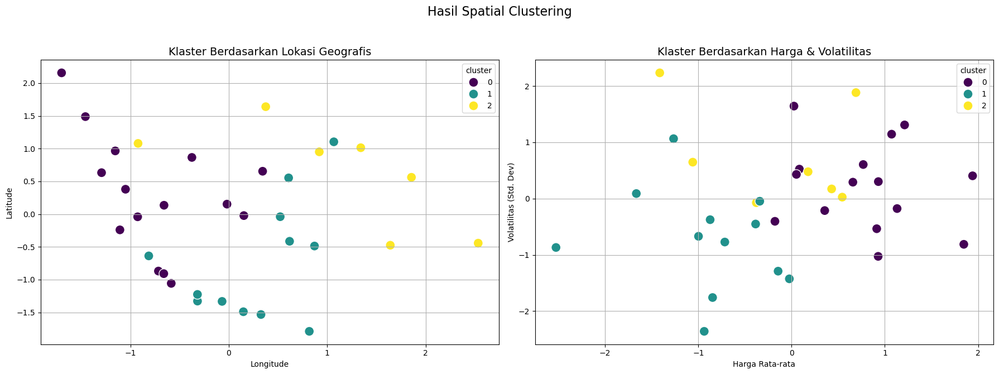

In [27]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

silhouette_scores = []
for n_clusters in range(2, 10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
    cluster_labels = kmeans.fit_predict(spatial_features_scaled)
    silhouette_scores.append(silhouette_score(spatial_features_scaled, cluster_labels))

optimal_clusters = np.argmax(silhouette_scores) + 2
print(f"Jumlah klaster optimal (K-Means): {optimal_clusters}")

# 2. Lakukan K-Means Clustering dengan jumlah klaster optimal
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42, n_init='auto')
cluster_labels = kmeans.fit_predict(spatial_features_scaled)

# Tambahkan label klaster ke DataFrame fitur asli
spatial_features_scaled['cluster'] = cluster_labels

print("\n--- Ringkasan Klaster Spasial ---")
print(spatial_features_scaled.groupby('cluster').agg(['count', 'mean']))

# 3. Visualisasi Hasil Klaster
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle('Hasil Spatial Clustering', fontsize=16)

# Visualisasi 1: Klaster pada Peta Geografis
sns.scatterplot(x='lon', y='lat', hue='cluster', data=spatial_features_scaled, palette='viridis', s=150, ax=axes[0])
axes[0].set_title('Klaster Berdasarkan Lokasi Geografis', fontsize=14)
axes[0].set_xlabel('Longitude')
axes[0].set_ylabel('Latitude')
axes[0].grid(True)


# Visualisasi 2: Klaster Berdasarkan Karakteristik Ekonomi
sns.scatterplot(x='mean_price', y='mean_volatility', hue='cluster', data=spatial_features_scaled, palette='viridis', s=150, ax=axes[1])
axes[1].set_title('Klaster Berdasarkan Harga & Volatilitas', fontsize=14)
axes[1].set_xlabel('Harga Rata-rata')
axes[1].set_ylabel('Volatilitas (Std. Dev)')
axes[1].grid(True)


plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

SPATIAL CLUSTERING (TIME SERIES CLUSTERING)

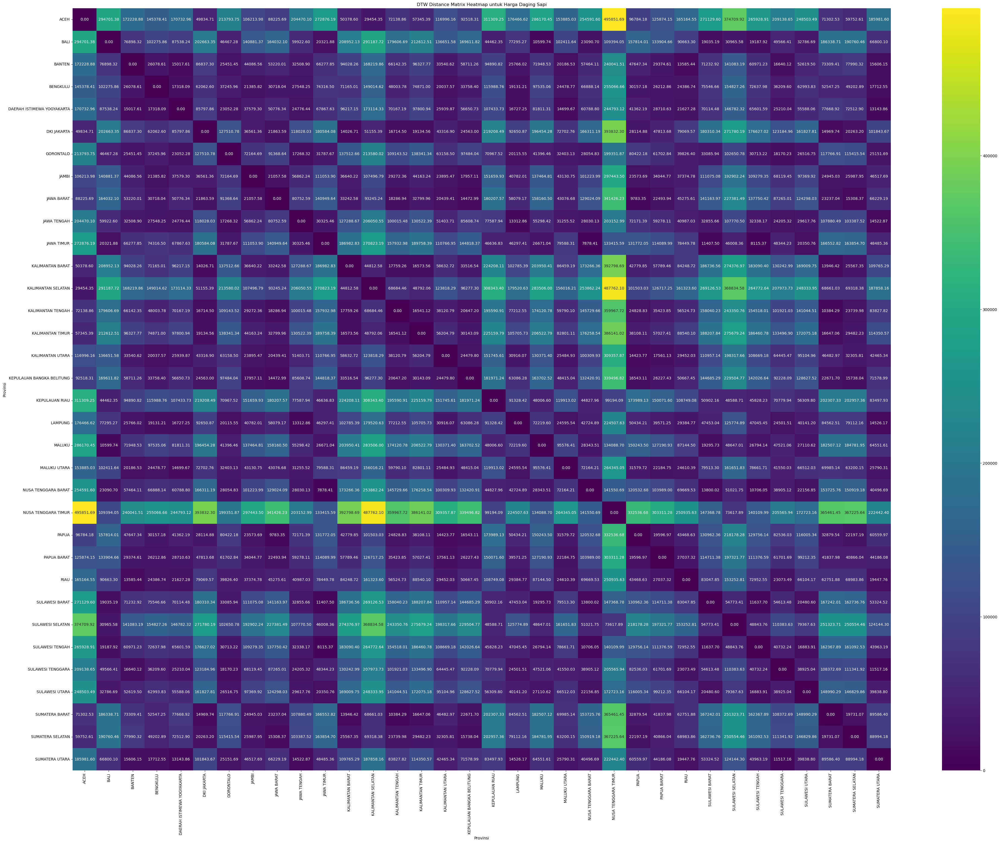

In [28]:
from tslearn.clustering import TimeSeriesKMeans
from tslearn.metrics import dtw
from tslearn.utils import to_time_series_dataset
from scipy.cluster.hierarchy import linkage, dendrogram

ts_data = beef_data.pivot_table(index='price_date', columns='adm1_name', values='c_meat_beef')
ts_dataset = to_time_series_dataset(ts_data.T)

dtw_distance_matrix = np.zeros((ts_dataset.shape[0], ts_dataset.shape[0]))
for i in range(ts_dataset.shape[0]):
    for j in range(ts_dataset.shape[0]):
        dtw_distance_matrix[i, j] = dtw(ts_dataset[i], ts_dataset[j])

plt.figure(figsize=(48, 36))
sns.heatmap(dtw_distance_matrix,
            cmap='viridis',
            annot=True,
            fmt=".2f",
            xticklabels=ts_data.columns,
            yticklabels=ts_data.columns)
plt.title('DTW Distance Matrix Heatmap untuk Harga Daging Sapi')
plt.xlabel('Provinsi')
plt.ylabel('Provinsi')
plt.show()


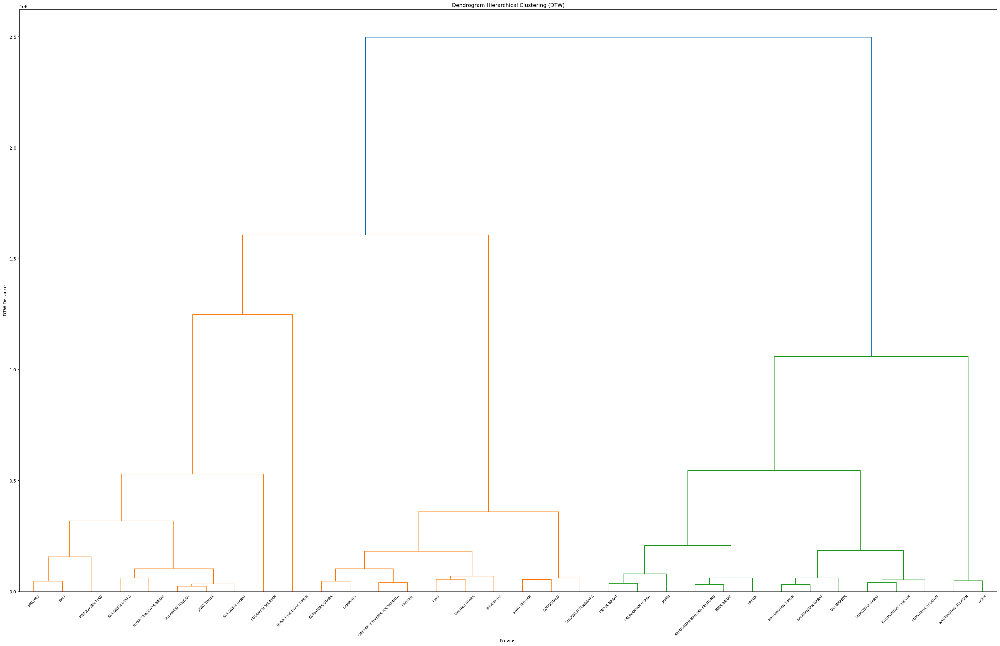

In [29]:
linked_matrix = linkage(dtw_distance_matrix, method='ward')
plt.figure(figsize=(40, 24))
dendrogram(linked_matrix,
           orientation='top',
           labels=ts_data.columns.tolist(),
           distance_sort='descending',
           show_leaf_counts=True)
plt.title('Dendrogram Hierarchical Clustering (DTW)')
plt.xlabel('Provinsi')
plt.ylabel('DTW Distance')
plt.show()

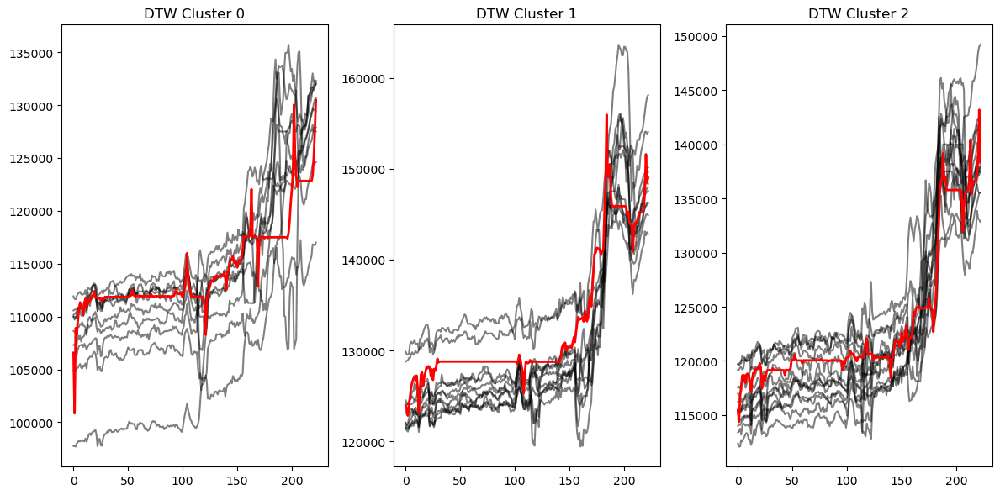


--- Perbandingan Klaster Spasial vs Klaster DTW ---
    cluster  dtw_cluster
0         0            1
1         1            0
2         0            2
3         0            2
4         1            2
5         0            1
6         2            2
7         0            2
8         0            1
9         1            2
10        1            0
11        0            1
12        0            1
13        0            1
14        0            1
15        2            2
16        0            1
17        2            0
18        1            2
19        2            0
20        2            2
21        1            0
22        1            0
23        2            1
24        2            2
25        0            2
26        1            0
27        1            0
28        1            0
29        1            2
30        1            0
31        0            1
32        0            1
33        0            2


In [58]:
n_clusters = 3
kmeans_dtw = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", max_iter=10, random_state=42)
dtw_cluster_labels = kmeans_dtw.fit_predict(ts_dataset)

#visualisasi dtw cluster
plt.figure(figsize=(12, 6))
for cluster in range(n_clusters):
    plt.subplot(1, n_clusters, cluster + 1)
    plt.title(f"DTW Cluster {cluster}")
    for ts in ts_dataset[dtw_cluster_labels == cluster]:
        plt.plot(ts, "k-", alpha=0.5)
    plt.plot(kmeans_dtw.cluster_centers_[cluster], "r-", linewidth=2)
plt.tight_layout()
plt.show()

# Tambahkan label klaster DTW ke DataFrame fitur agregat untuk perbandingan
spatial_features_scaled['dtw_cluster'] = dtw_cluster_labels

print("\n--- Perbandingan Klaster Spasial vs Klaster DTW ---")
print(spatial_features_scaled[['cluster', 'dtw_cluster']])

In [62]:
crosstab_result = pd.crosstab(
    index=spatial_features_scaled['cluster'],
    columns=spatial_features_scaled['dtw_cluster'],
    rownames=['K-Means Cluster'],
    colnames=['DTW Cluster']
)

print(crosstab_result)

DTW Cluster      0   1  2
K-Means Cluster          
0                0  10  5
1                8   0  4
2                2   1  4


In [31]:
# --- Merge adm1_name 1 to spatial feature scaled ---
clustering_res = pd.merge(spatial_features_scaled, province_col, left_index=True, right_index=True, how='left')
clustering_res

,mean_price,mean_volatility,std_dev_price,skewness,lat,lon,trend_slope,cluster,dtw_cluster,adm1_name
0,1.941114,0.405084,0.104978,-0.061291,2.156685,-1.699685,-0.419242,0,1,ACEH
1,-1.265687,1.064950,-0.925940,0.502097,-1.490231,0.148001,0.103295,1,0,BALI
2,0.025294,1.644029,0.415131,-0.113538,-0.869130,-0.715369,-0.772905,0,2,BANTEN
3,0.083656,0.523741,-0.924363,1.158925,-0.240289,-1.106819,-0.233992,0,2,BENGKULU
4,-0.023956,-1.425754,-0.727913,1.611696,-1.327670,-0.318228,1.128227,1,2,DAERAH ISTIMEWA YOGYAKARTA
5,1.211994,1.309454,0.029546,0.504352,-0.908746,-0.660910,-1.003366,0,1,DKI JAKARTA
6,-0.378293,-0.072365,-0.393036,0.070628,0.950912,0.919523,1.960241,2,2,GORONTALO
7,0.355181,-0.212622,-0.693039,1.529886,0.379901,-1.049760,-0.154073,0,2,JAMBI
8,0.768287,0.605771,0.452961,-0.116571,-1.057191,-0.585210,-0.535804,0,1,JAWA BARAT
9,-0.385862,-0.451649,-0.505154,-0.004463,-1.225899,-0.318675,-0.825012,1,2,JAWA TENGAH


FORECASTING

In [32]:
# --- merge to original dataset --

dtw_clusters_df = pd.DataFrame({
    'adm1_name': province_col['adm1_name'],
    'dtw_cluster_label': clustering_res['dtw_cluster']
})

beef_price_df_final = pd.merge(
    beef_data,
    dtw_clusters_df,
    on='adm1_name',
    how='left'
)

beef_price_df_final

# beef_price_df_final.to_csv('beef_price_data_with_dtw_clusters.csv', index=False)

,price_date,country,adm1_name,adm2_name,mkt_name,lat,lon,geo_id,year,month,...,o_meat_beef,h_meat_beef,l_meat_beef,c_meat_beef,inflation_meat_beef,trust_meat_beef,return_meat_beef,volatility_meat_beef,bullish_flag_meat_beef,dtw_cluster_label
0,2007-01-01,Indonesia,SULAWESI UTARA,KOTA KOTAMOBAGU,Pasar 23 Maret,0.74,124.31,gid_74000001243100000,2007,1,...,113670.37,114083.47,113397.95,113751.65,0.291678,9.5,0.000715,0.006031,1,0
1,2007-02-01,Indonesia,SULAWESI UTARA,KOTA KOTAMOBAGU,Pasar 23 Maret,0.74,124.31,gid_74000001243100000,2007,2,...,113822.04,114165.04,113420.46,113420.46,-0.392705,9.5,-0.003528,0.006542,0,0
2,2007-03-01,Indonesia,SULAWESI UTARA,KOTA KOTAMOBAGU,Pasar 23 Maret,0.74,124.31,gid_74000001243100000,2007,3,...,113486.00,113859.91,113112.08,113285.61,-0.144543,9.5,-0.001766,0.006590,0,0
3,2007-04-01,Indonesia,SULAWESI UTARA,KOTA KOTAMOBAGU,Pasar 23 Maret,0.74,124.31,gid_74000001243100000,2007,4,...,113337.65,114014.91,112997.92,114014.91,1.058082,9.5,0.005976,0.008973,1,0
4,2007-05-01,Indonesia,SULAWESI UTARA,KOTA KOTAMOBAGU,Pasar 23 Maret,0.74,124.31,gid_74000001243100000,2007,5,...,114107.74,114568.76,113646.72,114003.52,0.037518,9.5,-0.000913,0.008080,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47717,2025-03-01,Indonesia,ACEH,ACEH BARAT,Pasar Ujong Baro,4.15,96.13,gid_41500000961300000,2025,3,...,150561.24,151204.95,149917.53,151086.80,4.090000,9.6,0.003491,0.008551,1,1
47718,2025-04-01,Indonesia,ACEH,ACEH BARAT,Pasar Ujong Baro,4.15,96.13,gid_41500000961300000,2025,4,...,151058.79,152191.53,150441.43,152191.53,3.010000,9.6,0.007499,0.011586,1,1
47719,2025-05-01,Indonesia,ACEH,ACEH BARAT,Pasar Ujong Baro,4.15,96.13,gid_41500000961300000,2025,5,...,151928.23,154098.17,151230.62,154098.17,4.120000,9.5,0.014283,0.018874,1,1
47720,2025-06-01,Indonesia,ACEH,ACEH BARAT,Pasar Ujong Baro,4.15,96.13,gid_41500000961300000,2025,6,...,153511.82,154595.75,152508.56,154595.75,3.920000,9.5,0.007061,0.013596,1,1


In [33]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm
import joblib # Untuk menyimpan model
import os
from prophet import Prophet
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Bidirectional
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings

In [34]:
def prepare_cluster_data(df):
    """
    Prepare data by DTW clusters for modeling
    """
    print("Preparing data by DTW clusters...")
    
    # Convert price_date to datetime
    df['price_date'] = pd.to_datetime(df['price_date'])
    
    # Group by cluster and aggregate by date (average across markets)
    cluster_data = {}
    
    for cluster in sorted(df['dtw_cluster_label'].unique()):
        cluster_df = df[df['dtw_cluster_label'] == cluster].copy()
        
        # Aggregate by date (average across all markets in cluster)
        agg_data = cluster_df.groupby('price_date').agg({
            'o_meat_beef': 'mean',
            'h_meat_beef': 'mean',
            'l_meat_beef': 'mean',
            'c_meat_beef': 'mean',
            'inflation_meat_beef': 'mean',
            'trust_meat_beef': 'mean',
            'return_meat_beef': 'mean',
            'volatility_meat_beef': 'mean',
            'adm1_name': 'count'  # Number of observations
        }).reset_index()
        
        # Rename columns to match original code structure
        agg_data.columns = [
            'date', 'open_price_daging', 'high_price_daging', 'low_price_daging',
            'close_price_daging', 'inflation_rate', 'trust_score', 'return_rate',
            'volatility_score', 'observation_count'
        ]
        
        cluster_name = f'Cluster_{cluster}'
        cluster_data[cluster_name] = agg_data
        
        print(f"{cluster_name}: {len(agg_data)} time periods, "
              f"Average {agg_data['observation_count'].mean():.1f} markets per period")
    
    return cluster_data

# Load and prepare data
print("Loading and preparing beef price dataset...")
df = beef_price_df_final.copy()
clusters_data = prepare_cluster_data(df)

# Display cluster information
print("\nCluster Information:")
for cluster_name, data in clusters_data.items():
    print(f"\n{cluster_name}:")
    print(f"  Time periods: {len(data)}")
    print(f"  Date range: {data['date'].min()} to {data['date'].max()}")
    print(f"  Close price range: Rp {data['close_price_daging'].min():,.0f} - Rp {data['close_price_daging'].max():,.0f}")
    
    # Show provinces in this cluster
    cluster_provinces = df[df['dtw_cluster_label'] == int(cluster_name.split('_')[1])]['adm1_name'].unique()
    print(f"  Provinces: {', '.join(cluster_provinces)}")

Loading and preparing beef price dataset...
Preparing data by DTW clusters...
Cluster_0: 223 time periods, Average 64.0 markets per period
Cluster_1: 223 time periods, Average 68.0 markets per period
Cluster_2: 223 time periods, Average 82.0 markets per period

Cluster Information:

Cluster_0:
  Time periods: 223
  Date range: 2007-01-01 00:00:00 to 2025-07-01 00:00:00
  Close price range: Rp 107,622 - Rp 128,355
  Provinces: SULAWESI UTARA, SULAWESI BARAT, BALI, JAWA TIMUR, MALUKU, NUSA TENGGARA BARAT, NUSA TENGGARA TIMUR, SULAWESI SELATAN, KEPULAUAN RIAU, SULAWESI TENGAH

Cluster_1:
  Time periods: 223
  Date range: 2007-01-01 00:00:00 to 2025-07-01 00:00:00
  Close price range: Rp 123,243 - Rp 150,487
  Provinces: KALIMANTAN TIMUR, KEPULAUAN BANGKA BELITUNG, SUMATERA SELATAN, JAWA BARAT, PAPUA, SUMATERA BARAT, KALIMANTAN BARAT, ACEH, KALIMANTAN TENGAH, KALIMANTAN SELATAN, DKI JAKARTA

Cluster_2:
  Time periods: 223
  Date range: 2007-01-01 00:00:00 to 2025-07-01 00:00:00
  Close pri

ARIMA

In [63]:
# --- 1. Pemisahan Data Training dan Testing ---
print("1. Memisahkan data training dan testing...")
cutoff_date = '2023-07-01'
n_forecast_steps = len(beef_price_df_final.loc[beef_price_df_final['price_date'] > cutoff_date, 'price_date'].unique())

# Buat direktori untuk menyimpan data
if not os.path.exists('preprocessed_data'):
    os.makedirs('preprocessed_data')

# Simpan data training dan testing
train_data = beef_price_df_final.loc[beef_price_df_final['price_date'] <= cutoff_date]
test_data = beef_price_df_final.loc[beef_price_df_final['price_date'] > cutoff_date]



1. Memisahkan data training dan testing...


In [64]:
print("2. Melakukan preprocessing per klaster...")
for cluster_id in sorted(beef_price_df_final['dtw_cluster_label'].unique()):
    df_cluster = beef_price_df_final[beef_price_df_final['dtw_cluster_label'] == cluster_id].copy()
    
    # Agregasi data di tingkat klaster
    ts_data_cluster = df_cluster.groupby('price_date').agg({
        'o_meat_beef': 'mean', 'h_meat_beef': 'mean', 'l_meat_beef': 'mean',
        'c_meat_beef': 'mean', 'inflation_meat_beef': 'mean'
    })
    
    # Menangani NaN/inf yang mungkin muncul setelah agregasi
    ts_data_cluster = ts_data_cluster.replace([np.inf, -np.inf], np.nan).dropna()
    
    train_data = ts_data_cluster.loc[ts_data_cluster.index <= cutoff_date]
    test_data = ts_data_cluster.loc[ts_data_cluster.index > cutoff_date]
    
    # Simpan data yang telah diproses
    train_data.to_csv(f'preprocessed_data/train_cluster_{cluster_id}.csv')
    test_data.to_csv(f'preprocessed_data/test_cluster_{cluster_id}.csv')
    
    print(f" -> Klaster {cluster_id} siap. Ukuran data train: {len(train_data)}, test: {len(test_data)}")

print("\nPreprocessing selesai. Data telah disimpan di direktori 'preprocessed_data'.")

2. Melakukan preprocessing per klaster...
 -> Klaster 0 siap. Ukuran data train: 199, test: 24
 -> Klaster 1 siap. Ukuran data train: 199, test: 24
 -> Klaster 2 siap. Ukuran data train: 199, test: 24

Preprocessing selesai. Data telah disimpan di direktori 'preprocessed_data'.


In [124]:
n_clusters = 3
exog_features = ['o_meat_beef', 'h_meat_beef', 'l_meat_beef', 'inflation_meat_beef']

# Buat direktori untuk menyimpan model
if not os.path.exists('trained_models'):
    os.makedirs('trained_models')

print("Memulai pelatihan model ARIMAX...")
for cluster_id in range(n_clusters):
    print(f"\nMelatih ARIMAX untuk Klaster {cluster_id}...")
    
    # Muat data training
    train_data = pd.read_csv(f'preprocessed_data/train_cluster_{cluster_id}.csv', index_col='price_date', parse_dates=True)
    
    if train_data.empty or len(train_data) < 24:
        print(f" -> Klaster {cluster_id} dilewati: Data training tidak mencukupi.")
        continue

    endog = train_data['c_meat_beef']
    exog = train_data[exog_features]
    
    try:
        # Latih model ARIMAX (SARIMAX dengan order musiman nol)
        arimax_model = SARIMAX(
            endog=endog, exog=exog,
            order=(1, 2, 1), #untuk kluster 1
            #order=(1,2,1) untuk kluster 0 dan 2
            seasonal_order=(0, 0, 0, 0),
            enforce_stationarity=False, enforce_invertibility=False
        )
        arimax_results = arimax_model.fit(disp=False)
        
        # Simpan model yang telah dilatih
        joblib.dump(arimax_results, f'trained_models/arimax_cluster_{cluster_id}.pkl')
        print(f" -> ARIMAX untuk Klaster {cluster_id} berhasil dilatih dan disimpan.")
        
    except Exception as e:
        print(f" -> Gagal melatih ARIMAX untuk Klaster {cluster_id}: {e}")

print("\nPelatihan ARIMAX selesai.")

Memulai pelatihan model ARIMAX...

Melatih ARIMAX untuk Klaster 0...
 -> ARIMAX untuk Klaster 0 berhasil dilatih dan disimpan.

Melatih ARIMAX untuk Klaster 1...
 -> ARIMAX untuk Klaster 1 berhasil dilatih dan disimpan.

Melatih ARIMAX untuk Klaster 2...
 -> ARIMAX untuk Klaster 2 berhasil dilatih dan disimpan.

Pelatihan ARIMAX selesai.


Memulai visualisasi hasil peramalan ARIMAX...


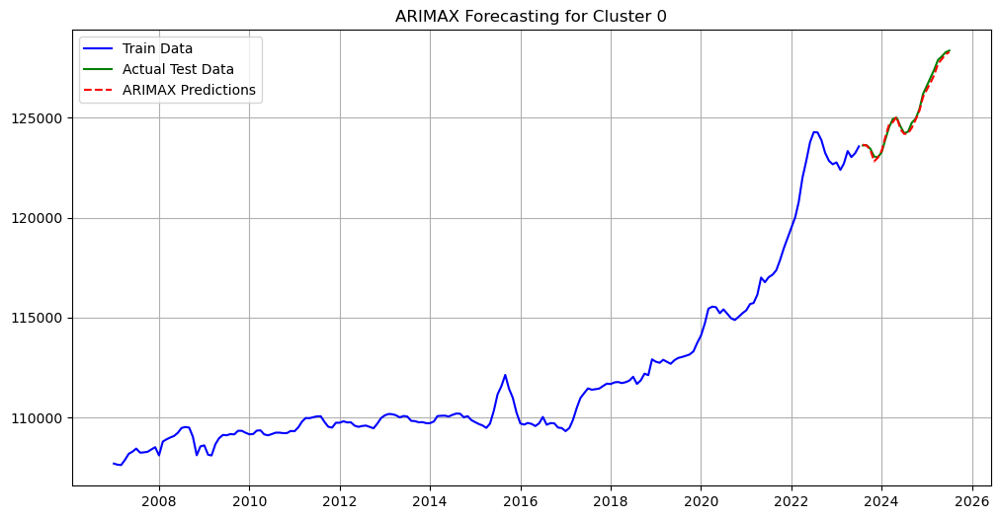

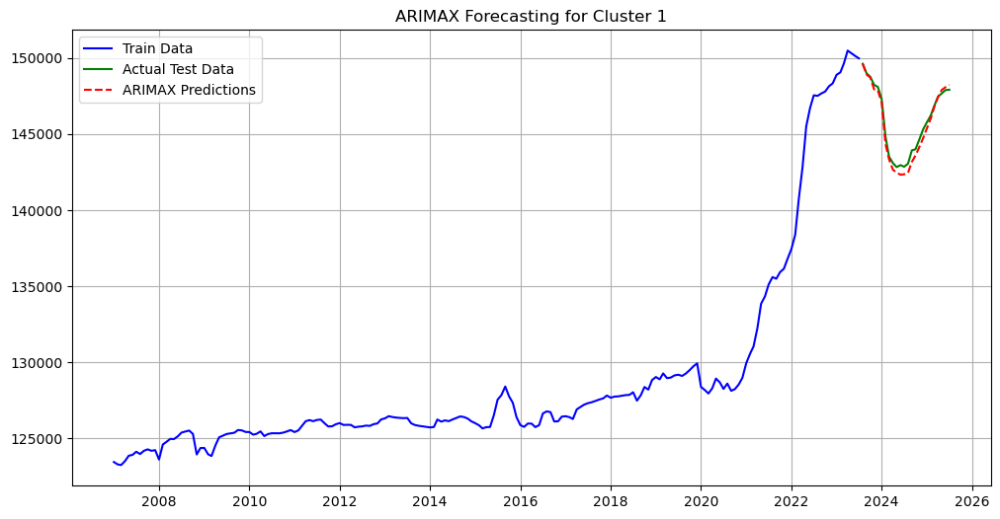

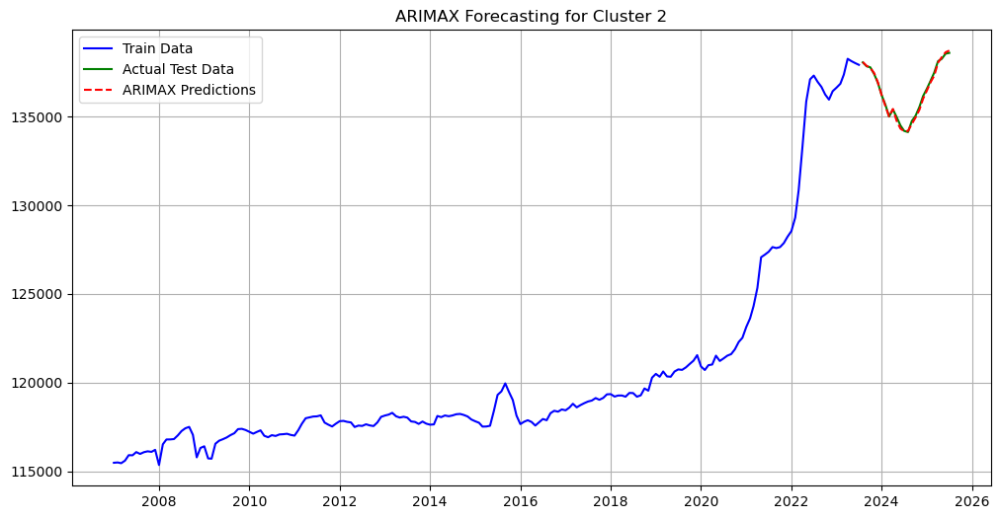


Visualisasi selesai.


In [125]:
print("Memulai visualisasi hasil peramalan ARIMAX...")
for cluster_id in range(3):
    try:
        # Muat model dan data
        arimax_model = joblib.load(f'trained_models/arimax_cluster_{cluster_id}.pkl')
        train_data = pd.read_csv(f'preprocessed_data/train_cluster_{cluster_id}.csv', index_col='price_date', parse_dates=True)
        test_data = pd.read_csv(f'preprocessed_data/test_cluster_{cluster_id}.csv', index_col='price_date', parse_dates=True)
        
        # Lakukan peramalan
        n_forecast_steps = len(test_data)
        exog_test = test_data[['o_meat_beef', 'h_meat_beef', 'l_meat_beef', 'inflation_meat_beef']]
        arimax_forecast = arimax_model.get_forecast(steps=n_forecast_steps, exog=exog_test)
        arimax_pred = arimax_forecast.predicted_mean
        
        # Buat plot
        plt.figure(figsize=(12, 6))
        plt.plot(train_data['c_meat_beef'], label='Train Data', color='blue')
        plt.plot(test_data['c_meat_beef'], label='Actual Test Data', color='green')
        plt.plot(arimax_pred, label='ARIMAX Predictions', color='red', linestyle='--')
        plt.title(f'ARIMAX Forecasting for Cluster {cluster_id}')
        plt.legend()
        plt.grid(True)
        plt.show()
        
    except FileNotFoundError:
        print(f" -> Klaster {cluster_id} dilewati: File model atau data tidak ditemukan.")
    except Exception as e:
        print(f" -> Gagal memvisualisasikan hasil untuk Klaster {cluster_id}: {e}")

print("\nVisualisasi selesai.")

In [126]:
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return {'RMSE': rmse, 'MAE': mae, 'MAPE': mape}

evaluation_results = pd.DataFrame(columns=['Cluster', 'Model', 'RMSE', 'MAE', 'MAPE'])

print("Memulai evaluasi model ARIMAX...")
for cluster_id in range(3):
    try:
        # Muat model dan data
        arimax_model = joblib.load(f'trained_models/arimax_cluster_{cluster_id}.pkl')
        test_data = pd.read_csv(f'preprocessed_data/test_cluster_{cluster_id}.csv', index_col='price_date', parse_dates=True)
        
        # Lakukan peramalan
        n_forecast_steps = len(test_data)
        exog_test = test_data[['o_meat_beef', 'h_meat_beef', 'l_meat_beef', 'inflation_meat_beef']]
        arimax_forecast = arimax_model.get_forecast(steps=n_forecast_steps, exog=exog_test)
        arimax_pred = arimax_forecast.predicted_mean
        
        # Hitung metrik dan simpan hasilnya
        metrics = calculate_metrics(test_data['c_meat_beef'], arimax_pred)
        evaluation_results.loc[len(evaluation_results)] = [cluster_id, 'ARIMAX', metrics['RMSE'], metrics['MAE'], metrics['MAPE']]
        
    except FileNotFoundError:
        print(f" -> Klaster {cluster_id} dilewati: File model atau data tidak ditemukan.")
    except Exception as e:
        print(f" -> Gagal mengevaluasi hasil untuk Klaster {cluster_id}: {e}")

print("\n" + "="*80)
print("Tabel Perbandingan Hasil Evaluasi ARIMAX per Klaster")
print("="*80)
print(evaluation_results)

Memulai evaluasi model ARIMAX...

Tabel Perbandingan Hasil Evaluasi ARIMAX per Klaster
   Cluster   Model        RMSE         MAE      MAPE
0        0  ARIMAX  145.973703  123.572657  0.098340
1        1  ARIMAX  383.092795  322.083653  0.222414
2        2  ARIMAX  105.151857   85.744222  0.062929


SARIMA

In [86]:
print("2. Memisahkan data training dan testing...")
cutoff_date = '2023-07-01'
n_forecast_steps = len(beef_price_df_final.loc[beef_price_df_final['price_date'] > cutoff_date, 'price_date'].unique())

# Buat direktori untuk menyimpan data
if not os.path.exists('preprocessed_data_sarimax'):
    os.makedirs('preprocessed_data_sarimax')

2. Memisahkan data training dan testing...


In [87]:
print("3. Melakukan preprocessing per klaster...")
for cluster_id in sorted(df['dtw_cluster_label'].unique()):
    df_cluster = df[df['dtw_cluster_label'] == cluster_id].copy()
    
    # Agregasi data di tingkat klaster
    ts_data_cluster = df_cluster.groupby('price_date').agg({
        'o_meat_beef': 'mean', 'h_meat_beef': 'mean', 'l_meat_beef': 'mean',
        'c_meat_beef': 'mean', 'inflation_meat_beef': 'mean'
    })
    
    # Menangani NaN/inf yang mungkin muncul setelah agregasi
    ts_data_cluster = ts_data_cluster.replace([np.inf, -np.inf], np.nan).dropna()
    
    train_data = ts_data_cluster.loc[ts_data_cluster.index <= cutoff_date]
    test_data = ts_data_cluster.loc[ts_data_cluster.index > cutoff_date]
    
    # Simpan data yang telah diproses
    train_data.to_csv(f'preprocessed_data_sarimax/train_cluster_{cluster_id}.csv')
    test_data.to_csv(f'preprocessed_data_sarimax/test_cluster_{cluster_id}.csv')
    
    print(f" -> Klaster {cluster_id} siap. Ukuran data train: {len(train_data)}, test: {len(test_data)}")

print("\nPreprocessing selesai. Data telah disimpan di direktori 'preprocessed_data_sarimax'.")

3. Melakukan preprocessing per klaster...
 -> Klaster 0 siap. Ukuran data train: 199, test: 24
 -> Klaster 1 siap. Ukuran data train: 199, test: 24
 -> Klaster 2 siap. Ukuran data train: 199, test: 24

Preprocessing selesai. Data telah disimpan di direktori 'preprocessed_data_sarimax'.


In [134]:
n_clusters = 3
exog_features = ['o_meat_beef', 'h_meat_beef', 'l_meat_beef', 'inflation_meat_beef']

# Buat direktori untuk menyimpan model
if not os.path.exists('trained_models_sarimax'):
    os.makedirs('trained_models_sarimax')

print("Memulai pelatihan model SARIMAX...")
for cluster_id in range(n_clusters):
    print(f"\nMelatih SARIMAX untuk Klaster {cluster_id}...")
    
    # Muat data training
    train_data = pd.read_csv(f'preprocessed_data_sarimax/train_cluster_{cluster_id}.csv', index_col='price_date', parse_dates=True)
    
    if train_data.empty or len(train_data) < 24:
        print(f" -> Klaster {cluster_id} dilewati: Data training tidak mencukupi.")
        continue

    endog = train_data['c_meat_beef']
    exog = train_data[exog_features]
    
    try:
        # Latih model SARIMAX dengan order musiman
        sarimax_model = SARIMAX(
            endog=endog, exog=exog,
            # order=(1, 1, 1), #untuk kluster 1
            #order=(1,1,0), # untuk kluster 0
            order=(1,2,0), # untuk kluster 2
            seasonal_order=(1, 1, 1, 12), #untuk kluster 0 dan 2
            #seasonal_order=(1,1,0,12), #untuk kluster 1
            enforce_stationarity=False, enforce_invertibility=False
        )
        sarimax_results = sarimax_model.fit(disp=False)
        
        # Simpan model yang telah dilatih
        joblib.dump(sarimax_results, f'trained_models_sarimax/sarimax_cluster_{cluster_id}.pkl')
        print(f" -> SARIMAX untuk Klaster {cluster_id} berhasil dilatih dan disimpan.")
        
    except Exception as e:
        print(f" -> Gagal melatih SARIMAX untuk Klaster {cluster_id}: {e}")

print("\nPelatihan SARIMAX selesai.")

Memulai pelatihan model SARIMAX...

Melatih SARIMAX untuk Klaster 0...
 -> SARIMAX untuk Klaster 0 berhasil dilatih dan disimpan.

Melatih SARIMAX untuk Klaster 1...
 -> SARIMAX untuk Klaster 1 berhasil dilatih dan disimpan.

Melatih SARIMAX untuk Klaster 2...
 -> SARIMAX untuk Klaster 2 berhasil dilatih dan disimpan.

Pelatihan SARIMAX selesai.


Memulai visualisasi hasil peramalan SARIMAX...


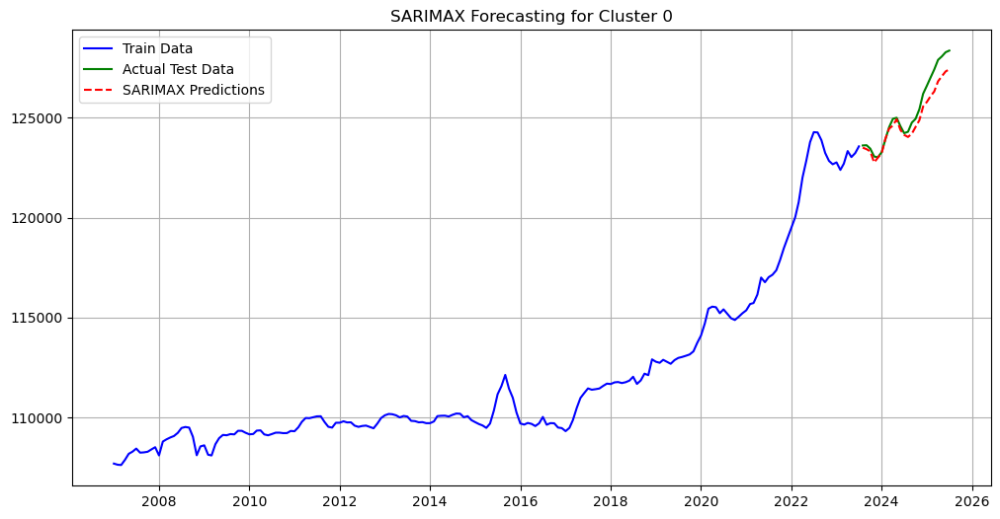

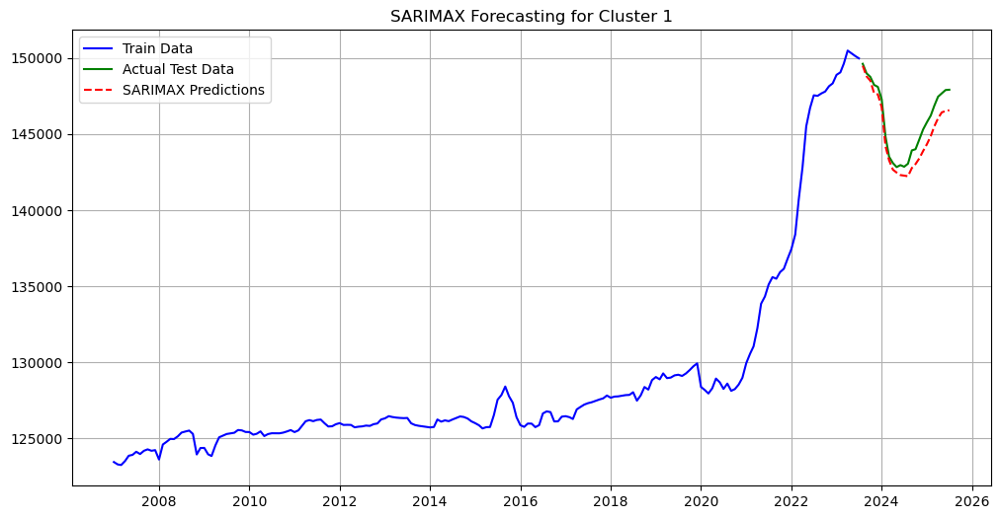

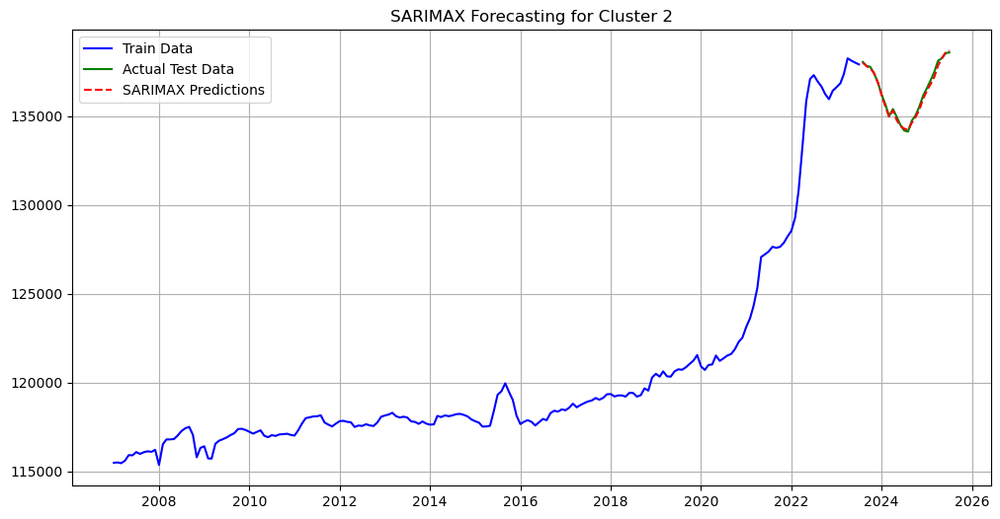


Visualisasi selesai.


In [135]:
print("Memulai visualisasi hasil peramalan SARIMAX...")
for cluster_id in range(3):
    try:
        # Muat model dan data
        sarimax_model = joblib.load(f'trained_models_sarimax/sarimax_cluster_{cluster_id}.pkl')
        train_data = pd.read_csv(f'preprocessed_data_sarimax/train_cluster_{cluster_id}.csv', index_col='price_date', parse_dates=True)
        test_data = pd.read_csv(f'preprocessed_data_sarimax/test_cluster_{cluster_id}.csv', index_col='price_date', parse_dates=True)
        
        # Lakukan peramalan
        n_forecast_steps = len(test_data)
        exog_test = test_data[['o_meat_beef', 'h_meat_beef', 'l_meat_beef', 'inflation_meat_beef']]
        sarimax_forecast = sarimax_model.get_forecast(steps=n_forecast_steps, exog=exog_test)
        sarimax_pred = sarimax_forecast.predicted_mean
        
        # Buat plot
        plt.figure(figsize=(12, 6))
        plt.plot(train_data['c_meat_beef'], label='Train Data', color='blue')
        plt.plot(test_data['c_meat_beef'], label='Actual Test Data', color='green')
        plt.plot(sarimax_pred, label='SARIMAX Predictions', color='red', linestyle='--')
        plt.title(f'SARIMAX Forecasting for Cluster {cluster_id}')
        plt.legend()
        plt.grid(True)
        plt.show()
        
    except FileNotFoundError:
        print(f" -> Klaster {cluster_id} dilewati: File model atau data tidak ditemukan.")
    except Exception as e:
        print(f" -> Gagal memvisualisasikan hasil untuk Klaster {cluster_id}: {e}")

print("\nVisualisasi selesai.")

In [136]:
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return {'RMSE': rmse, 'MAE': mae, 'MAPE': mape}

evaluation_results = pd.DataFrame(columns=['Cluster', 'Model', 'RMSE', 'MAE', 'MAPE'])

print("Memulai evaluasi model SARIMAX...")
for cluster_id in range(3):
    try:
        # Muat model dan data
        sarimax_model = joblib.load(f'trained_models_sarimax/sarimax_cluster_{cluster_id}.pkl')
        test_data = pd.read_csv(f'preprocessed_data_sarimax/test_cluster_{cluster_id}.csv', index_col='price_date', parse_dates=True)
        
        # Lakukan peramalan
        n_forecast_steps = len(test_data)
        exog_test = test_data[['o_meat_beef', 'h_meat_beef', 'l_meat_beef', 'inflation_meat_beef']]
        sarimax_forecast = sarimax_model.get_forecast(steps=n_forecast_steps, exog=exog_test)
        sarimax_pred = sarimax_forecast.predicted_mean
        
        # Hitung metrik dan simpan hasilnya
        metrics = calculate_metrics(test_data['c_meat_beef'], sarimax_pred)
        evaluation_results.loc[len(evaluation_results)] = [cluster_id, 'SARIMAX', metrics['RMSE'], metrics['MAE'], metrics['MAPE']]
        
    except FileNotFoundError:
        print(f" -> Klaster {cluster_id} dilewati: File model atau data tidak ditemukan.")
    except Exception as e:
        print(f" -> Gagal mengevaluasi hasil untuk Klaster {cluster_id}: {e}")

print("\n" + "="*80)
print("Tabel Perbandingan Hasil Evaluasi SARIMAX per Klaster")
print("="*80)
print(evaluation_results)

Memulai evaluasi model SARIMAX...

Tabel Perbandingan Hasil Evaluasi SARIMAX per Klaster
   Cluster    Model        RMSE         MAE      MAPE
0        0  SARIMAX  587.073565  450.845915  0.356161
1        1  SARIMAX  959.171273  842.830730  0.577735
2        2  SARIMAX  131.283793  105.744961  0.077551


PROPHET

In [147]:
print("2. Memisahkan data training dan testing...")
cutoff_date = '2023-07-01'
n_forecast_steps = len(beef_price_df_final.loc[beef_price_df_final['price_date'] > cutoff_date, 'price_date'].unique())

# Buat direktori untuk menyimpan data
if not os.path.exists('preprocessed_data_prophet'):
    os.makedirs('preprocessed_data_prophet')


2. Memisahkan data training dan testing...


In [148]:
print("3. Melakukan preprocessing per klaster...")
for cluster_id in sorted(df['dtw_cluster_label'].unique()):
    df_cluster = df[df['dtw_cluster_label'] == cluster_id].copy()
    
    # Agregasi data di tingkat klaster
    ts_data_cluster = df_cluster.groupby('price_date').agg({
        'o_meat_beef': 'mean', 'h_meat_beef': 'mean', 'l_meat_beef': 'mean',
        'c_meat_beef': 'mean', 'inflation_meat_beef': 'mean'
    })
    
    # Menangani NaN/inf yang mungkin muncul setelah agregasi
    ts_data_cluster = ts_data_cluster.replace([np.inf, -np.inf], np.nan).dropna()
    
    train_data = ts_data_cluster.loc[ts_data_cluster.index <= cutoff_date]
    test_data = ts_data_cluster.loc[ts_data_cluster.index > cutoff_date]
    
    # Format data untuk Prophet: kolom 'ds' dan 'y'
    prophet_train_df = train_data.reset_index().rename(columns={'price_date': 'ds', 'c_meat_beef': 'y'})
    prophet_test_df = test_data.reset_index().rename(columns={'price_date': 'ds', 'c_meat_beef': 'y'})

    # Simpan data yang telah diformat
    prophet_train_df.to_csv(f'preprocessed_data_prophet/train_cluster_{cluster_id}.csv', index=False)
    prophet_test_df.to_csv(f'preprocessed_data_prophet/test_cluster_{cluster_id}.csv', index=False)
    
    print(f" -> Klaster {cluster_id} siap. Ukuran data train: {len(prophet_train_df)}, test: {len(prophet_test_df)}")

print("\nPreprocessing selesai. Data telah disimpan di direktori 'preprocessed_data_prophet'.")

3. Melakukan preprocessing per klaster...
 -> Klaster 0 siap. Ukuran data train: 199, test: 24
 -> Klaster 1 siap. Ukuran data train: 199, test: 24
 -> Klaster 2 siap. Ukuran data train: 199, test: 24

Preprocessing selesai. Data telah disimpan di direktori 'preprocessed_data_prophet'.


In [153]:
import os
import joblib
import pandas as pd
from prophet import Prophet
from sklearn.preprocessing import MinMaxScaler

# Jumlah cluster
n_clusters = 3

# Fitur eksogen
exog_features = ['o_meat_beef', 'h_meat_beef', 'l_meat_beef']

# Buat direktori untuk menyimpan model
if not os.path.exists('trained_models_prophet'):
    os.makedirs('trained_models_prophet')

print("Memulai pelatihan model Prophet...")

for cluster_id in range(n_clusters):
    print(f"\nMelatih Prophet untuk Klaster {cluster_id}...")

    # Muat data training
    train_path = f'preprocessed_data_prophet/train_cluster_{cluster_id}.csv'
    if not os.path.exists(train_path):
        print(f" -> File {train_path} tidak ditemukan, dilewati.")
        continue

    train_data = pd.read_csv(train_path)

    # Pastikan format Prophet
    if "price_date" in train_data.columns:
        train_data.rename(columns={"price_date": "ds"}, inplace=True)
    if "price" in train_data.columns:
        train_data.rename(columns={"price": "y"}, inplace=True)

    # Cek minimum data
    if train_data.empty or len(train_data) < 24:
        print(f" -> Klaster {cluster_id} dilewati: Data training tidak mencukupi.")
        continue

    # Pastikan tipe datetime
    train_data["ds"] = pd.to_datetime(train_data["ds"], errors="coerce")

    # Drop NA
    cols_to_check = ["ds", "y"] + [c for c in exog_features if c in train_data.columns]
    train_data = train_data.dropna(subset=cols_to_check).reset_index(drop=True)

    # Pastikan hanya pakai regressor yang ada
    available_regressors = [c for c in exog_features if c in train_data.columns]

    # Normalisasi fitur eksogen
    scaler = MinMaxScaler()
    if available_regressors:
        train_data[available_regressors] = scaler.fit_transform(train_data[available_regressors])

    try:
        # Inisialisasi Prophet
        prophet_model = Prophet(
            seasonality_mode='multiplicative',
            yearly_seasonality=True,
            weekly_seasonality=False,
            daily_seasonality=False
        )

        # Tambahkan regressor
        for col in ["o_meat_beef", "h_meat_beef", "l_meat_beef", "inflation_meat_beef"]:
            prophet_model.add_regressor(col)
            
        print(train_data.head())
        print(train_data.dtypes)

        # Latih model dengan LBFGS (lebih stabil)
        # prophet_model.fit(train_data, algorithm="LBFGS")
        prophet_model.fit(train_data, algorithm="Newton")

        # Simpan model + scaler
        joblib.dump(
            {"model": prophet_model, "scaler": scaler, "regressors": available_regressors},
            f'trained_models_prophet/prophet_cluster_{cluster_id}.pkl'
        )

        print(f" -> Prophet untuk Klaster {cluster_id} berhasil dilatih dan disimpan.")

    except Exception as e:
        print(f" -> Gagal melatih Prophet untuk Klaster {cluster_id}: {e}")

print("\nPelatihan Prophet selesai.")


20:33:53 - cmdstanpy - INFO - Chain [1] start processing
20:33:53 - cmdstanpy - INFO - Chain [1] done processing
20:33:53 - cmdstanpy - ERROR - Chain [1] error: terminated by signal 3221225657 


Memulai pelatihan model Prophet...

Melatih Prophet untuk Klaster 0...
          ds  o_meat_beef  h_meat_beef  l_meat_beef              y  \
0 2007-01-01     0.000000     0.000270     0.000121  107693.217188   
1 2007-02-01     0.006981     0.004661     0.002124  107635.525781   
2 2007-03-01     0.003608     0.000000     0.000000  107622.016406   
3 2007-04-01     0.003037     0.002759     0.002084  107883.157656   
4 2007-05-01     0.018568     0.019322     0.017598  108181.800625   

   inflation_meat_beef  
0            -0.345553  
1            -0.446590  
2            -0.450117  
3            -0.261896  
4            -0.127402  
ds                     datetime64[ns]
o_meat_beef                   float64
h_meat_beef                   float64
l_meat_beef                   float64
y                             float64
inflation_meat_beef           float64
dtype: object
 -> Gagal melatih Prophet untuk Klaster 0: Error during optimization! Command 'C:\Users\wenje\anaconda3\envs\dataMin

20:33:53 - cmdstanpy - INFO - Chain [1] start processing
20:33:53 - cmdstanpy - INFO - Chain [1] done processing
20:33:53 - cmdstanpy - ERROR - Chain [1] error: terminated by signal 3221225657 
20:33:53 - cmdstanpy - INFO - Chain [1] start processing
20:33:53 - cmdstanpy - INFO - Chain [1] done processing
20:33:53 - cmdstanpy - ERROR - Chain [1] error: terminated by signal 3221225657 


 -> Gagal melatih Prophet untuk Klaster 1: Error during optimization! Command 'C:\Users\wenje\anaconda3\envs\dataMining-case\Lib\site-packages\prophet\stan_model\prophet_model.bin random seed=33997 data file=C:\Users\wenje\AppData\Local\Temp\tmp_zdjqzrs\d3x3azvs.json init=C:\Users\wenje\AppData\Local\Temp\tmp_zdjqzrs\nvtm72xo.json output file=C:\Users\wenje\AppData\Local\Temp\tmp_zdjqzrs\prophet_modelfuouua1r\prophet_model-20250827203353.csv method=optimize algorithm=newton iter=10000' failed: 

Melatih Prophet untuk Klaster 2...
          ds  o_meat_beef  h_meat_beef  l_meat_beef              y  \
0 2007-01-01     0.000000     0.000000     0.006044  115477.525488   
1 2007-02-01     0.005387     0.003642     0.007962  115494.798293   
2 2007-03-01     0.006715     0.004405     0.008082  115452.366220   
3 2007-04-01     0.004551     0.004893     0.006537  115597.605976   
4 2007-05-01     0.010104     0.013062     0.013150  115905.200366   

   inflation_meat_beef  
0            -0.15

LSTM

In [137]:
print("2. Memisahkan data training dan testing...")
cutoff_date = '2023-07-01'
n_forecast_steps = len(beef_price_df_final.loc[beef_price_df_final['price_date'] > cutoff_date, 'price_date'].unique())
exog_features = ['o_meat_beef', 'h_meat_beef', 'l_meat_beef', 'inflation_meat_beef']

# Buat direktori untuk menyimpan data
if not os.path.exists('preprocessed_data_lstm'):
    os.makedirs('preprocessed_data_lstm')

2. Memisahkan data training dan testing...


In [141]:
print("3. Melakukan preprocessing per klaster...")
for cluster_id in sorted(df['dtw_cluster_label'].unique()):
    df_cluster = df[df['dtw_cluster_label'] == cluster_id].copy()
    
    # Agregasi data di tingkat klaster
    ts_data_cluster = df_cluster.groupby('price_date').agg({
        'o_meat_beef': 'mean', 'h_meat_beef': 'mean', 'l_meat_beef': 'mean',
        'c_meat_beef': 'mean', 'inflation_meat_beef': 'mean'
    })
    
    # Menangani NaN/inf yang mungkin muncul setelah agregasi
    ts_data_cluster = ts_data_cluster.replace([np.inf, -np.inf], np.nan).dropna()
    
    train_data = ts_data_cluster.loc[ts_data_cluster.index <= cutoff_date]
    test_data = ts_data_cluster.loc[ts_data_cluster.index > cutoff_date]
    
    # Simpan scaler agar bisa digunakan untuk inverse-transform
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaler.fit(ts_data_cluster[exog_features + ['c_meat_beef']])
    joblib.dump(scaler, f'preprocessed_data_lstm/scaler_cluster_{cluster_id}.pkl')

    # Normalisasi data
    scaled_train_data = scaler.transform(train_data[exog_features + ['c_meat_beef']])
    scaled_test_data = scaler.transform(test_data[exog_features + ['c_meat_beef']])

    # Simpan data yang telah dinormalisasi
    pd.DataFrame(scaled_train_data).to_csv(f'preprocessed_data_lstm/train_cluster_{cluster_id}.csv', index=False)
    pd.DataFrame(scaled_test_data).to_csv(f'preprocessed_data_lstm/test_cluster_{cluster_id}.csv', index=False)
    
    print(f" -> Klaster {cluster_id} siap. Ukuran data train: {len(scaled_train_data)}, test: {len(scaled_test_data)}")

print("\nPreprocessing selesai. Data telah disimpan di direktori 'preprocessed_data_lstm'.")

3. Melakukan preprocessing per klaster...
 -> Klaster 0 siap. Ukuran data train: 199, test: 24
 -> Klaster 1 siap. Ukuran data train: 199, test: 24
 -> Klaster 2 siap. Ukuran data train: 199, test: 24

Preprocessing selesai. Data telah disimpan di direktori 'preprocessed_data_lstm'.


In [144]:
import pandas as pd
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense
import joblib
import os
import warnings

warnings.filterwarnings('ignore')

# Definisikan parameter
n_clusters = 3
n_steps = 12
n_features = 5 # o, h, l, c, inflation

# Buat direktori untuk menyimpan model
if not os.path.exists('trained_models_lstm'):
    os.makedirs('trained_models_lstm')

# --- Fungsi untuk membuat sekuens multivariat ---
def create_multivariate_sequences(data, n_steps, target_col_index):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps
        if end_ix > len(data)-1:
            break
        seq_x = data[i:end_ix]
        seq_y = data[end_ix, target_col_index]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

print("Memulai pelatihan model LSTM...")
for cluster_id in range(n_clusters):
    print(f"\nMelatih LSTM untuk Klaster {cluster_id}...")
    
    # Muat data training yang sudah dinormalisasi
    try:
        scaled_train_data = pd.read_csv(f'preprocessed_data_lstm/train_cluster_{cluster_id}.csv').values
        
        # Buat sekuens
        target_col_index = 4 # Indeks untuk 'c_price'
        X_train, y_train = create_multivariate_sequences(scaled_train_data, n_steps, target_col_index)
        
        # Reshape untuk input LSTM
        X_train = X_train.reshape(X_train.shape[0], n_steps, n_features)

        if X_train.shape[0] == 0:
            print(f" -> Klaster {cluster_id} dilewati: Data training tidak mencukupi untuk sekuens.")
            continue
            
        # Definisikan model LSTM
        lstm_model = Sequential([
            LSTM(50, activation='relu', input_shape=(n_steps, n_features)),
            Dense(1)
        ])
        lstm_model.compile(optimizer='adam', loss='mse')
        lstm_model.fit(X_train, y_train, epochs=100, verbose=0)
        
        # Simpan model yang telah dilatih
        lstm_model.save(f'trained_models_lstm/lstm_cluster_{cluster_id}.keras')
        print(f" -> LSTM untuk Klaster {cluster_id} berhasil dilatih dan disimpan.")
        
    except Exception as e:
        print(f" -> Gagal melatih LSTM untuk Klaster {cluster_id}: {e}")

print("\nPelatihan LSTM selesai.")

Memulai pelatihan model LSTM...

Melatih LSTM untuk Klaster 0...
 -> LSTM untuk Klaster 0 berhasil dilatih dan disimpan.

Melatih LSTM untuk Klaster 1...
 -> LSTM untuk Klaster 1 berhasil dilatih dan disimpan.

Melatih LSTM untuk Klaster 2...
 -> LSTM untuk Klaster 2 berhasil dilatih dan disimpan.

Pelatihan LSTM selesai.


Memulai visualisasi hasil peramalan LSTM...


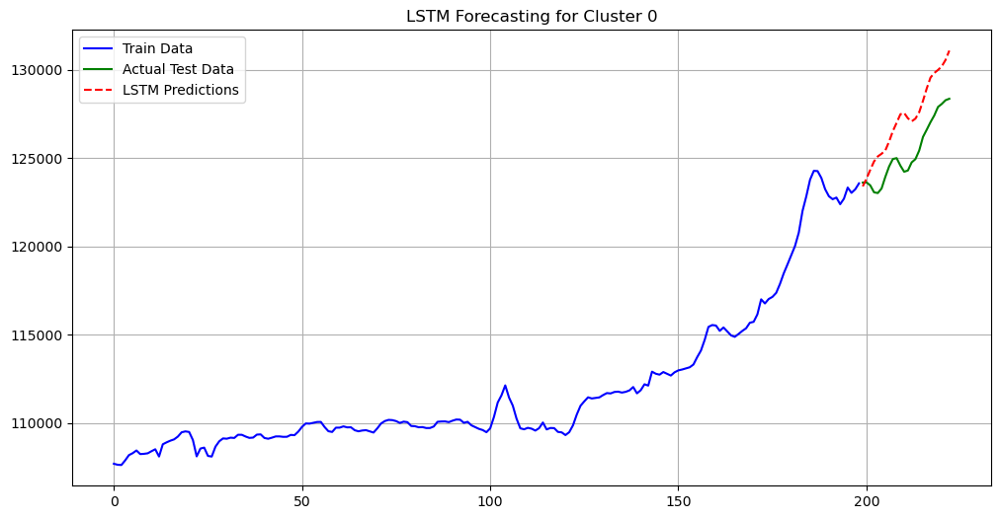

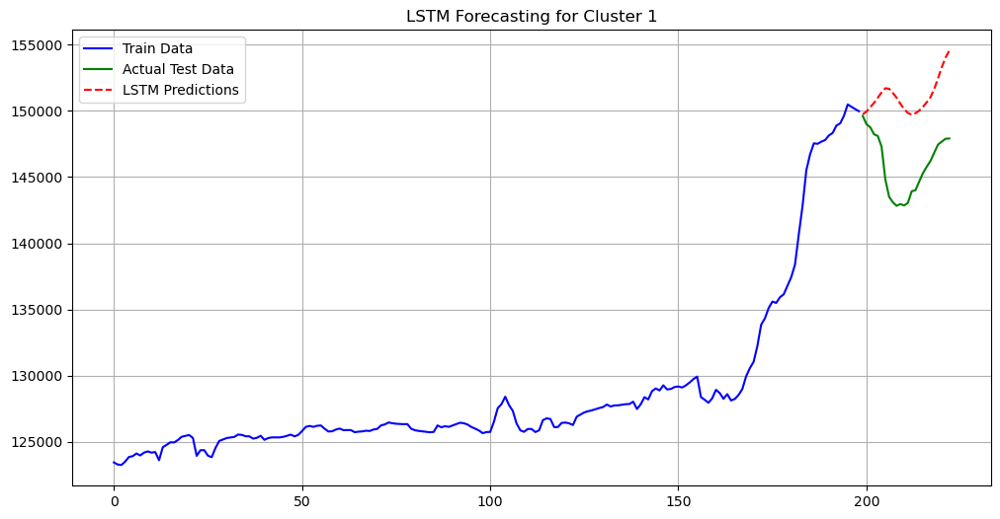

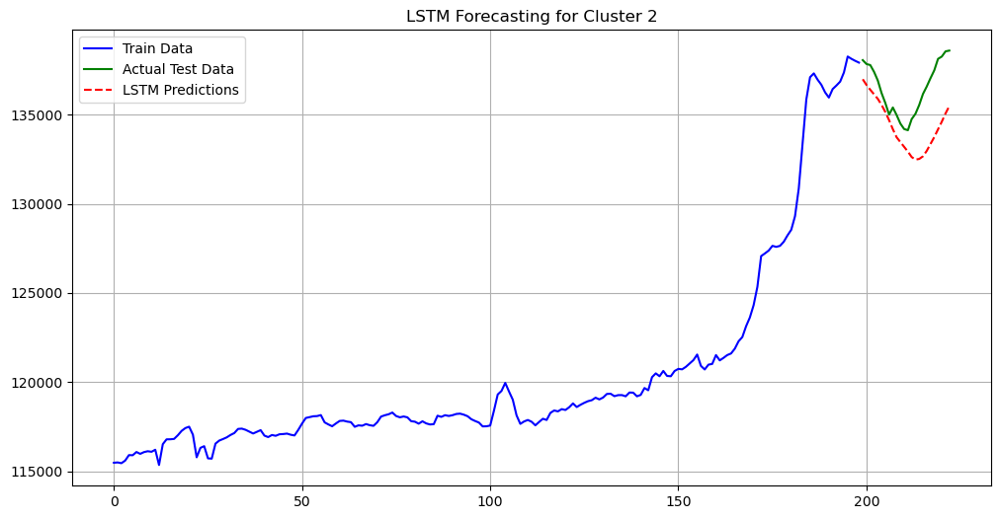


Visualisasi selesai.


In [145]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model # Gunakan tensorflow.keras
import joblib
import warnings
import os

warnings.filterwarnings('ignore')

print("Memulai visualisasi hasil peramalan LSTM...")
for cluster_id in range(3):
    try:
        # Muat model dan data
        # Model disimpan dalam format .keras
        lstm_model = load_model(f'trained_models_lstm/lstm_cluster_{cluster_id}.keras')
        scaler = joblib.load(f'preprocessed_data_lstm/scaler_cluster_{cluster_id}.pkl')
        
        # Muat data yang sudah diproses (tanpa header)
        scaled_train_data = pd.read_csv(f'preprocessed_data_lstm/train_cluster_{cluster_id}.csv').values
        scaled_test_data = pd.read_csv(f'preprocessed_data_lstm/test_cluster_{cluster_id}.csv').values

        # Tentukan jumlah fitur secara dinamis dari data yang dimuat
        n_features = scaled_train_data.shape[1]
        n_steps = 12
        n_forecast_steps = len(scaled_test_data)
        
        # --- Buat prediksi multi-langkah dengan logika yang lebih robust ---
        forecast_input = scaled_train_data[-n_steps:].reshape(1, n_steps, n_features)
        lstm_forecast_scaled = []
        
        for i in range(n_forecast_steps):
            # Prediksi satu langkah ke depan
            prediction = lstm_model.predict(forecast_input, verbose=0)[0]
            lstm_forecast_scaled.append(prediction[0])

            # Ambil fitur eksogen dari data testing untuk timestep saat ini
            exog_features_test = scaled_test_data[i, :-1]
            
            # Gabungkan prediksi sebagai nilai 'c_price' untuk input selanjutnya
            next_step_input = np.append(exog_features_test, prediction)
            
            # Perbarui input sekuens untuk iterasi berikutnya
            forecast_input = np.append(forecast_input[:, 1:, :], next_step_input.reshape(1, 1, n_features), axis=1)

        # Inverse-transform prediksi
        dummy_array = np.zeros(shape=(len(lstm_forecast_scaled), n_features))
        dummy_array[:, -1] = np.array(lstm_forecast_scaled)
        lstm_pred = scaler.inverse_transform(dummy_array)[:, -1]

        # Muat data asli (inverse transform dari data yang diskalakan) untuk plotting
        original_train_data = scaler.inverse_transform(scaled_train_data)[:, -1]
        original_test = scaler.inverse_transform(scaled_test_data)[:, -1]

        # Buat plot
        plt.figure(figsize=(12, 6))
        plt.plot(original_train_data, label='Train Data', color='blue')
        plt.plot(range(len(original_train_data), len(original_train_data) + len(original_test)), original_test, label='Actual Test Data', color='green')
        plt.plot(range(len(original_train_data), len(original_train_data) + len(lstm_pred)), lstm_pred, label='LSTM Predictions', color='red', linestyle='--')
        plt.title(f'LSTM Forecasting for Cluster {cluster_id}')
        plt.legend()
        plt.grid(True)
        plt.show()
        
    except (FileNotFoundError, ValueError):
        print(f" -> Klaster {cluster_id} dilewati: File model atau data tidak ditemukan atau tidak valid.")
    except Exception as e:
        print(f" -> Gagal memvisualisasikan hasil untuk Klaster {cluster_id}: {e}")

print("\nVisualisasi selesai.")

In [146]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import load_model
import joblib
import warnings
import os

warnings.filterwarnings('ignore')

# --- Fungsi untuk evaluasi metrik ---
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return {'RMSE': rmse, 'MAE': mae, 'MAPE': mape}

evaluation_results = pd.DataFrame(columns=['Cluster', 'Model', 'RMSE', 'MAE', 'MAPE'])

print("Memulai evaluasi model LSTM...")
for cluster_id in range(3):
    try:
        # Muat model dan data
        # Catatan: Asumsikan model disimpan dalam format .keras sesuai rekomendasi
        lstm_model = load_model(f'trained_models_lstm/lstm_cluster_{cluster_id}.keras')
        scaler = joblib.load(f'preprocessed_data_lstm/scaler_cluster_{cluster_id}.pkl')
        
        # Muat data yang sudah diproses (tanpa header)
        scaled_train_data = pd.read_csv(f'preprocessed_data_lstm/train_cluster_{cluster_id}.csv').values
        scaled_test_data = pd.read_csv(f'preprocessed_data_lstm/test_cluster_{cluster_id}.csv').values
        
        # --- Dinamiskan jumlah fitur dan langkah peramalan ---
        n_features = scaled_train_data.shape[1]
        n_steps = 12
        n_forecast_steps = len(scaled_test_data)
        
        # --- Logika peramalan multi-langkah yang diperbaiki ---
        forecast_input = scaled_train_data[-n_steps:]
        lstm_forecast_scaled = []
        
        for i in range(n_forecast_steps):
            forecast_input_reshaped = forecast_input.reshape(1, n_steps, n_features)
            prediction = lstm_model.predict(forecast_input_reshaped, verbose=0)[0]
            lstm_forecast_scaled.append(prediction[0])

            # Ambil fitur eksogen dari data testing untuk timestep saat ini
            exog_features_test = scaled_test_data[i, :-1]
            
            # Gabungkan prediksi sebagai nilai 'c_price' untuk input selanjutnya
            next_step_input = np.append(exog_features_test, prediction)
            forecast_input = np.append(forecast_input[1:], next_step_input.reshape(1, n_features), axis=0)

        # Inverse-transform prediksi
        dummy_array = np.zeros(shape=(len(lstm_forecast_scaled), n_features))
        dummy_array[:, -1] = np.array(lstm_forecast_scaled)
        lstm_pred = scaler.inverse_transform(dummy_array)[:, -1]

        # Ambil data testing asli dari file CSV
        original_test_data = pd.read_csv(f'preprocessed_data_lstm/test_cluster_{cluster_id}.csv').values[:, -1]
        
        # Hitung metrik dan simpan hasilnya
        metrics = calculate_metrics(original_test_data, lstm_pred)
        evaluation_results.loc[len(evaluation_results)] = [cluster_id, 'LSTM', metrics['RMSE'], metrics['MAE'], metrics['MAPE']]
        
    except (FileNotFoundError, ValueError):
        print(f" -> Klaster {cluster_id} dilewati: File model atau data tidak ditemukan atau tidak valid.")
    except Exception as e:
        print(f" -> Gagal mengevaluasi hasil untuk Klaster {cluster_id}: {e}")

print("\n" + "="*80)
print("Tabel Perbandingan Hasil Evaluasi LSTM per Klaster")
print("="*80)
print(evaluation_results)

Memulai evaluasi model LSTM...

Tabel Perbandingan Hasil Evaluasi LSTM per Klaster
   Cluster Model           RMSE            MAE          MAPE
0        0  LSTM  127271.660553  127253.153409  1.506748e+07
1        1  LSTM  151119.537848  151113.906492  1.833586e+07
2        2  LSTM  134367.118963  134359.884851  1.488185e+07


BILSTM

In [53]:
print("2. Memisahkan data training dan testing...")
cutoff_date = '2023-07-01'
n_forecast_steps = len(df.loc[df['price_date'] > cutoff_date, 'price_date'].unique())
exog_features = ['o_meat_beef', 'h_meat_beef', 'l_meat_beef', 'inflation_meat_beef']

# Buat direktori untuk menyimpan data
if not os.path.exists('preprocessed_data_bilstm'):
    os.makedirs('preprocessed_data_bilstm')

2. Memisahkan data training dan testing...


In [54]:
print("3. Melakukan preprocessing per klaster...")
for cluster_id in sorted(df['dtw_cluster_label'].unique()):
    df_cluster = df[df['dtw_cluster_label'] == cluster_id].copy()
    
    # Agregasi data di tingkat klaster
    ts_data_cluster = df_cluster.groupby('price_date').agg({
        'o_meat_beef': 'mean', 'h_meat_beef': 'mean', 'l_meat_beef': 'mean',
        'c_meat_beef': 'mean', 'inflation_meat_beef': 'mean'
    })
    
    # Menangani NaN/inf yang mungkin muncul setelah agregasi
    ts_data_cluster = ts_data_cluster.replace([np.inf, -np.inf], np.nan).dropna()
    
    train_data = ts_data_cluster.loc[ts_data_cluster.index <= cutoff_date]
    test_data = ts_data_cluster.loc[ts_data_cluster.index > cutoff_date]
    
    # Simpan scaler agar bisa digunakan untuk inverse-transform
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaler.fit(ts_data_cluster[exog_features + ['c_meat_beef']])
    joblib.dump(scaler, f'preprocessed_data_bilstm/scaler_cluster_{cluster_id}.pkl')

    # Normalisasi data
    scaled_train_data = scaler.transform(train_data[exog_features + ['c_meat_beef']])
    scaled_test_data = scaler.transform(test_data[exog_features + ['c_meat_beef']])

    # Simpan data yang telah dinormalisasi
    pd.DataFrame(scaled_train_data).to_csv(f'preprocessed_data_bilstm/train_cluster_{cluster_id}.csv', index=False)
    pd.DataFrame(scaled_test_data).to_csv(f'preprocessed_data_bilstm/test_cluster_{cluster_id}.csv', index=False)
    
    print(f" -> Klaster {cluster_id} siap. Ukuran data train: {len(scaled_train_data)}, test: {len(scaled_test_data)}")

print("\nPreprocessing selesai. Data telah disimpan di direktori 'preprocessed_data_bilstm'.")

3. Melakukan preprocessing per klaster...
 -> Klaster 0 siap. Ukuran data train: 199, test: 24
 -> Klaster 1 siap. Ukuran data train: 199, test: 24
 -> Klaster 2 siap. Ukuran data train: 199, test: 24

Preprocessing selesai. Data telah disimpan di direktori 'preprocessed_data_bilstm'.


In [55]:
# ==============================================================================
# BLOK 2: Pelatihan Model BiLSTM
# ==============================================================================

import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Bidirectional
import joblib
import os
import warnings

warnings.filterwarnings('ignore')

# Definisikan parameter
n_clusters = 3
n_steps = 12
n_features = 5 # o, h, l, c, inflation

# Buat direktori untuk menyimpan model
if not os.path.exists('trained_models_bilstm'):
    os.makedirs('trained_models_bilstm')

# --- Fungsi untuk membuat sekuens multivariat ---
def create_multivariate_sequences(data, n_steps, target_col_index):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps
        if end_ix > len(data)-1:
            break
        seq_x = data[i:end_ix]
        seq_y = data[end_ix, target_col_index]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

print("Memulai pelatihan model BiLSTM...")
for cluster_id in range(n_clusters):
    print(f"\nMelatih BiLSTM untuk Klaster {cluster_id}...")
    
    # Muat data training yang sudah dinormalisasi
    try:
        scaled_train_data = pd.read_csv(f'preprocessed_data_bilstm/train_cluster_{cluster_id}.csv').values
        
        # Buat sekuens
        target_col_index = 4 # Indeks untuk 'c_price'
        X_train, y_train = create_multivariate_sequences(scaled_train_data, n_steps, target_col_index)
        
        # Reshape untuk input BiLSTM
        X_train = X_train.reshape(X_train.shape[0], n_steps, n_features)

        if X_train.shape[0] == 0:
            print(f" -> Klaster {cluster_id} dilewati: Data training tidak mencukupi untuk sekuens.")
            continue
            
        # Definisikan model BiLSTM
        bilstm_model = Sequential([
            Bidirectional(LSTM(50, activation='relu'), input_shape=(n_steps, n_features)),
            Dense(1)
        ])
        bilstm_model.compile(optimizer='adam', loss='mse')
        bilstm_model.fit(X_train, y_train, epochs=100, verbose=0)
        
        # Simpan model yang telah dilatih
        bilstm_model.save(f'trained_models_bilstm/bilstm_cluster_{cluster_id}.keras')
        print(f" -> BiLSTM untuk Klaster {cluster_id} berhasil dilatih dan disimpan.")
        
    except Exception as e:
        print(f" -> Gagal melatih BiLSTM untuk Klaster {cluster_id}: {e}")

print("\nPelatihan BiLSTM selesai.")

Memulai pelatihan model BiLSTM...

Melatih BiLSTM untuk Klaster 0...
 -> BiLSTM untuk Klaster 0 berhasil dilatih dan disimpan.

Melatih BiLSTM untuk Klaster 1...
 -> BiLSTM untuk Klaster 1 berhasil dilatih dan disimpan.

Melatih BiLSTM untuk Klaster 2...
 -> BiLSTM untuk Klaster 2 berhasil dilatih dan disimpan.

Pelatihan BiLSTM selesai.


Memulai visualisasi hasil peramalan BiLSTM...


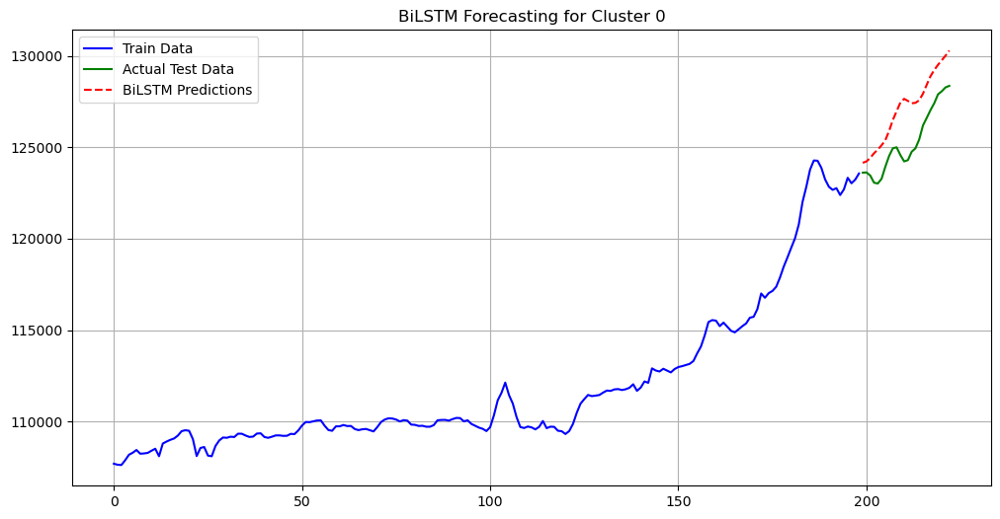

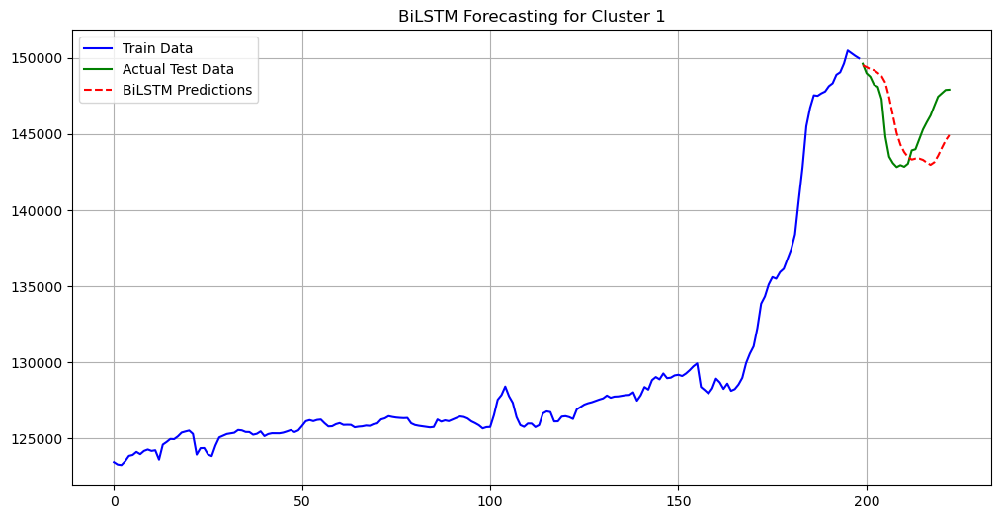

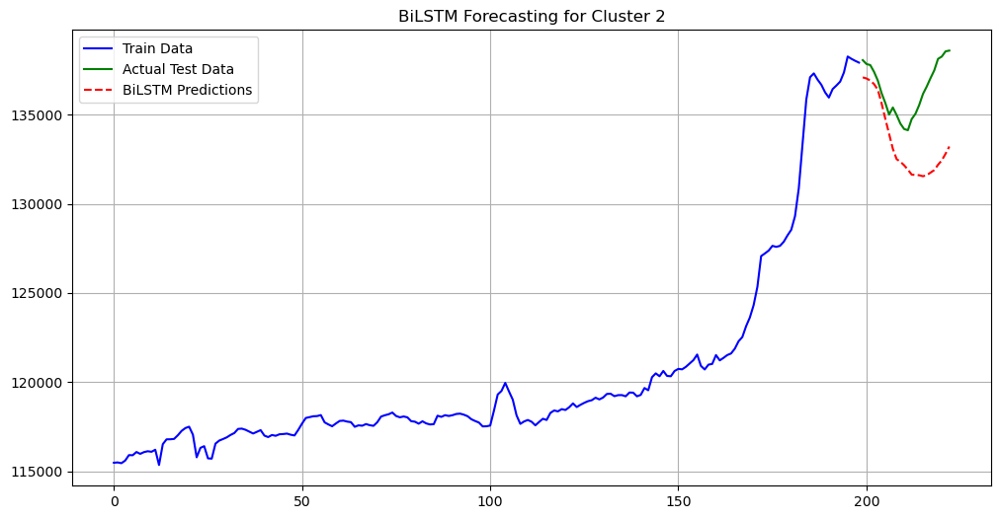


Visualisasi selesai.


In [56]:
# ==============================================================================
# BLOK 3: Visualisasi Hasil Peramalan (DIREVISI & BENAR)
# ==============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
import joblib
import warnings
import os

warnings.filterwarnings('ignore')

print("Memulai visualisasi hasil peramalan BiLSTM...")
for cluster_id in range(3):
    try:
        # Muat model, scaler, dan data
        # Catatan: Asumsikan model disimpan dalam format .keras sesuai rekomendasi
        bilstm_model = load_model(f'trained_models_bilstm/bilstm_cluster_{cluster_id}.keras')
        scaler = joblib.load(f'preprocessed_data_bilstm/scaler_cluster_{cluster_id}.pkl')
        
        # Muat data yang sudah diproses (tanpa header)
        scaled_train_data = pd.read_csv(f'preprocessed_data_bilstm/train_cluster_{cluster_id}.csv').values
        scaled_test_data = pd.read_csv(f'preprocessed_data_bilstm/test_cluster_{cluster_id}.csv').values

        # Tentukan jumlah fitur secara dinamis dari data yang dimuat
        n_features = scaled_train_data.shape[1]
        n_steps = 12
        n_forecast_steps = len(scaled_test_data)
        
        # --- Logika peramalan multi-langkah yang diperbaiki ---
        forecast_input = scaled_train_data[-n_steps:]
        bilstm_forecast_scaled = []
        
        for i in range(n_forecast_steps):
            # Reshape input untuk predict
            forecast_input_reshaped = forecast_input.reshape(1, n_steps, n_features)
            
            # Prediksi satu langkah ke depan
            prediction = bilstm_model.predict(forecast_input_reshaped, verbose=0)[0]
            
            # Ambil fitur eksogen dari data testing untuk timestep saat ini
            exog_features_test = scaled_test_data[i, :-1]
            
            # Gabungkan prediksi sebagai nilai 'c_price' untuk input selanjutnya
            next_step_input = np.append(exog_features_test, prediction)
            
            # Perbarui input sekuens untuk iterasi berikutnya
            forecast_input = np.append(forecast_input[1:], next_step_input.reshape(1, n_features), axis=0)

            # Simpan prediksi
            bilstm_forecast_scaled.append(prediction[0])

        # Inverse-transform prediksi
        dummy_array = np.zeros(shape=(len(bilstm_forecast_scaled), n_features))
        dummy_array[:, -1] = np.array(bilstm_forecast_scaled)
        bilstm_pred = scaler.inverse_transform(dummy_array)[:, -1]

        # Muat data asli untuk plotting
        original_train_data_df = pd.read_csv(f'preprocessed_data_bilstm/train_cluster_{cluster_id}.csv')
        original_test_data_df = pd.read_csv(f'preprocessed_data_bilstm/test_cluster_{cluster_id}.csv')
        
        # Buat plot
        plt.figure(figsize=(12, 6))
        plt.plot(original_train_data_df.index, scaler.inverse_transform(original_train_data_df.values)[:, -1], label='Train Data', color='blue')
        plt.plot(range(len(original_train_data_df), len(original_train_data_df) + len(original_test_data_df)), scaler.inverse_transform(original_test_data_df.values)[:, -1], label='Actual Test Data', color='green')
        plt.plot(range(len(original_train_data_df), len(original_train_data_df) + len(bilstm_pred)), bilstm_pred, label='BiLSTM Predictions', color='red', linestyle='--')
        plt.title(f'BiLSTM Forecasting for Cluster {cluster_id}')
        plt.legend()
        plt.grid(True)
        plt.show()
        
    except (FileNotFoundError, ValueError):
        print(f" -> Klaster {cluster_id} dilewati: File model atau data tidak ditemukan atau tidak valid.")
    except Exception as e:
        print(f" -> Gagal memvisualisasikan hasil untuk Klaster {cluster_id}: {e}")

print("\nVisualisasi selesai.")

In [57]:
# ==============================================================================
# BLOK 4: Evaluasi Model (DIREVISI & BENAR)
# ==============================================================================

import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import load_model
import joblib
import warnings
import os

warnings.filterwarnings('ignore')

# --- Fungsi untuk evaluasi metrik ---
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return {'RMSE': rmse, 'MAE': mae, 'MAPE': mape}

evaluation_results = pd.DataFrame(columns=['Cluster', 'Model', 'RMSE', 'MAE', 'MAPE'])

print("Memulai evaluasi model BiLSTM...")
for cluster_id in range(3):
    try:
        # Muat model dan data
        # Catatan: Asumsikan model disimpan dalam format .keras sesuai rekomendasi
        bilstm_model = load_model(f'trained_models_bilstm/bilstm_cluster_{cluster_id}.keras')
        scaler = joblib.load(f'preprocessed_data_bilstm/scaler_cluster_{cluster_id}.pkl')
        
        # Muat data yang sudah diproses (tanpa header)
        scaled_train_data = pd.read_csv(f'preprocessed_data_bilstm/train_cluster_{cluster_id}.csv').values
        scaled_test_data = pd.read_csv(f'preprocessed_data_bilstm/test_cluster_{cluster_id}.csv').values
        
        # --- Dinamiskan jumlah fitur dan langkah peramalan ---
        n_features = scaled_train_data.shape[1]
        n_steps = 12
        n_forecast_steps = len(scaled_test_data)
        
        # --- Logika peramalan multi-langkah yang diperbaiki ---
        forecast_input = scaled_train_data[-n_steps:]
        bilstm_forecast_scaled = []
        
        for i in range(n_forecast_steps):
            # Reshape input untuk predict
            forecast_input_reshaped = forecast_input.reshape(1, n_steps, n_features)
            
            # Prediksi satu langkah ke depan
            prediction = bilstm_model.predict(forecast_input_reshaped, verbose=0)[0]
            
            # Ambil fitur eksogen dari data testing untuk timestep saat ini
            exog_features_test = scaled_test_data[i, :-1]
            
            # Gabungkan prediksi sebagai nilai 'c_price' untuk input selanjutnya
            next_step_input = np.append(exog_features_test, prediction)
            
            # Perbarui input sekuens untuk iterasi berikutnya
            forecast_input = np.append(forecast_input[1:], next_step_input.reshape(1, n_features), axis=0)

            # Simpan prediksi
            bilstm_forecast_scaled.append(prediction[0])

        # Inverse-transform prediksi
        dummy_array = np.zeros(shape=(len(bilstm_forecast_scaled), n_features))
        dummy_array[:, -1] = np.array(bilstm_forecast_scaled)
        bilstm_pred = scaler.inverse_transform(dummy_array)[:, -1]

        # Ambil data testing asli dari file CSV
        original_test_data = pd.read_csv(f'preprocessed_data_bilstm/test_cluster_{cluster_id}.csv').values[:, -1]
        
        # Hitung metrik dan simpan hasilnya
        metrics = calculate_metrics(original_test_data, bilstm_pred)
        evaluation_results.loc[len(evaluation_results)] = [cluster_id, 'BiLSTM', metrics['RMSE'], metrics['MAE'], metrics['MAPE']]
        
    except (FileNotFoundError, ValueError):
        print(f" -> Klaster {cluster_id} dilewati: File model atau data tidak ditemukan atau tidak valid.")
    except Exception as e:
        print(f" -> Gagal mengevaluasi hasil untuk Klaster {cluster_id}: {e}")

print("\n" + "="*80)
print("Tabel Perbandingan Hasil Evaluasi BiLSTM per Klaster")
print("="*80)
print(evaluation_results)

Memulai evaluasi model BiLSTM...

Tabel Perbandingan Hasil Evaluasi BiLSTM per Klaster
   Cluster   Model           RMSE            MAE          MAPE
0        0  BiLSTM  127146.108168  127131.960098  1.505610e+07
1        1  BiLSTM  145590.233094  145569.310107  1.765388e+07
2        2  BiLSTM  133465.037234  133450.064012  1.478157e+07
